In [3]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import gc

import keras as k
import tensorflow as tf
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Activation, BatchNormalization
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.applications.inception_v3 import InceptionV3
from keras.applications.resnet50 import ResNet50
from keras.layers import Input
from keras import backend as K
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
import cv2
from tqdm import tqdm
from heamy.dataset import Dataset

from IPython.display import Image
import matplotlib.pyplot as plt
from IPython.display import display

from vis.utils import utils
from vis.visualization import visualize_saliency
from vis.visualization import visualize_cam


from sklearn.model_selection import train_test_split
from sklearn.metrics import fbeta_score, precision_score 
from skimage import io,transform

import time

import os
import fnmatch

In [21]:
df_train = pd.read_csv('train_v2.csv')

labels = ['blow_down',
 'bare_ground',
 'conventional_mine',
 'blooming',
 'artisinal_mine',
 'selective_logging',         
 'slash_burn', 
 'cultivation',
 'habitation',
 'road',
 'agriculture',
 'water',
 'primary',
 'partly_cloudy', 
 'cloudy',
 'clear',
 'haze',]

label_map = {l: i for i, l in enumerate(labels)}
inv_label_map = {i: l for l, i in label_map.items()}

In [5]:
base_model = ResNet50(weights='imagenet', include_top=False)

# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(1024)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(17, activation='sigmoid')(x)

# this is the model we will train
model = Model(inputs=base_model.input, outputs=predictions)
model.load_weights('resnet_224_weights_2')

In [6]:
train_mean = np.load('resnet_224_train_mean.npy')
thresh_2_val = np.load('resnet_224_thresh_2_val.npy')

In [8]:
print(labels)
print(thresh_2_val)

['blow_down', 'bare_ground', 'conventional_mine', 'blooming', 'artisinal_mine', 'selective_logging', 'slash_burn', 'cultivation', 'habitation', 'road', 'agriculture', 'water', 'primary', 'partly_cloudy', 'cloudy', 'clear', 'haze']
[ 0.44  0.24  0.93  0.42  0.61  0.77  0.17  0.2   0.36  0.27  0.2   0.31
  0.17  0.42  0.08  0.08  0.2 ]


In [9]:
x_train = np.zeros((40479,224,224,3), np.float32)
y_train = []

df_train = pd.read_csv('train_v2.csv')

i=0

for f, tags in tqdm(df_train.values[:40479], miniters=1000):    
    img = cv2.imread('train-jpg/{}.jpg'.format(f))
    targets = np.zeros(17)
    for t in tags.split(' '):
        targets[label_map[t]] = 1 
    x_train[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
    y_train.append(targets)
  
y_train = np.array(y_train, np.uint8)

print(x_train.shape)
print(y_train.shape)

100%|██████████| 40479/40479 [01:18<00:00, 512.82it/s]

(40479, 224, 224, 3)
(40479, 17)


In [10]:
print(thresh_2_val)

[ 0.44  0.24  0.93  0.42  0.61  0.77  0.17  0.2   0.36  0.27  0.2   0.31
  0.17  0.42  0.08  0.08  0.2 ]


In [11]:
x_train -=train_mean
y_pred = model.predict(x_train,batch_size=64)

In [13]:
for i in range(50):
    thresh = i/100.
    print("thresh:",thresh,"\tF2 score:",fbeta_score(y_train, np.array(y_pred)>thresh, beta=2, average='samples'))

thresh: 0.0 	F2 score: 0.485363843004
thresh: 0.01 	F2 score: 0.837232380782
thresh: 0.02 	F2 score: 0.87242947799
thresh: 0.03 	F2 score: 0.888962084574
thresh: 0.04 	F2 score: 0.899348728254
thresh: 0.05 	F2 score: 0.90640326386
thresh: 0.06 	F2 score: 0.911528915198
thresh: 0.07 	F2 score: 0.915608869362
thresh: 0.08 	F2 score: 0.918883155445
thresh: 0.09 	F2 score: 0.921861781919
thresh: 0.1 	F2 score: 0.924118712332
thresh: 0.11 	F2 score: 0.926043938394
thresh: 0.12 	F2 score: 0.927602851712
thresh: 0.13 	F2 score: 0.928959344617
thresh: 0.14 	F2 score: 0.930122650065
thresh: 0.15 	F2 score: 0.931190832506
thresh: 0.16 	F2 score: 0.931928832034
thresh: 0.17 	F2 score: 0.932698418878
thresh: 0.18 	F2 score: 0.933246608496
thresh: 0.19 	F2 score: 0.933630780586
thresh: 0.2 	F2 score: 0.933936187625
thresh: 0.21 	F2 score: 0.934021755109
thresh: 0.22 	F2 score: 0.934311268899
thresh: 0.23 	F2 score: 0.934295544184
thresh: 0.24 	F2 score: 0.934410902417
thresh: 0.25 	F2 score: 0.9343

/home/cs231n/myVE35/lib/python3.5/site-packages/sklearn/metrics/classification.py:1113: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in samples with no predicted labels.
  'precision', 'predicted', average, warn_for)


In [14]:
print("\tF2 score:",fbeta_score(y_train, np.array(y_pred>np.array(thresh_2_val)), beta=2, average='samples'))

	F2 score: 0.936261658274


In [16]:
def multilabelmetrics(y_true,y_pred):
    '''y_true and y_pred should be boolean np arrays
    of shape num_example x num_classes '''
    total = np.sum(y_true,axis = 0)
    tp = np.sum(y_true*y_pred,axis=0)
    tn = np.sum((1-y_true)*(1-y_pred),axis=0)
    fp = np.sum((1-y_true)*y_pred,axis=0)
    fn = np.sum(y_true*(1-y_pred),axis=0)
    return total,tp,tn,fp,fn

In [18]:
total,tp,tn,fp,fn = multilabelmetrics(y_train,np.array(y_pred>np.array(thresh_2_val)))
d = {'Total':total,'TP':tp,'TN':tn,'FP':fp,'FN':fn}
pd.DataFrame(d, index=labels)

,FN,FP,TN,TP,Total
blow_down,47,75,40306,51,98
bare_ground,370,631,38986,492,862
conventional_mine,45,6,40373,55,100
blooming,237,177,39970,95,332
artisinal_mine,27,69,40071,312,339
selective_logging,262,25,40114,78,340
slash_burn,96,291,39979,113,209
cultivation,780,4272,31730,3697,4477
habitation,540,1351,35468,3120,3660
road,446,2801,29608,7624,8070


In [20]:
df_test = pd.read_csv('sample_submission_v2.csv')

x_train = []
x_test = []
x_test = np.zeros((30000,224,224,3), np.float32)


i = 0 
for f, tags in tqdm(df_test.values[:30000], miniters=1000):
    img = cv2.imread('test-jpg/{}.jpg'.format(f))
    x_test[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
print(x_test.shape)

x_test -= train_mean
y_test_0 = model.predict(x_test,batch_size=64)
y_pred_0 = np.array(y_test_0>0.24)

x_test = []
x_test = np.zeros((30000,224,224,3), np.float32)


i = 0 
for f, tags in tqdm(df_test.values[:30000], miniters=1000):
    img = cv2.imread('test-jpg-1/{}.jpg'.format(f))
    x_test[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
print(x_test.shape)

x_test -= train_mean
y_test_1 = model.predict(x_test,batch_size=64)
y_pred_1 = np.array(y_test_1>0.24)

x_test = []
x_test = np.zeros((30000,224,224,3), np.float32)


i = 0 
for f, tags in tqdm(df_test.values[:30000], miniters=1000):
    img = cv2.imread('test-jpg-2/{}.jpg'.format(f))
    x_test[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
print(x_test.shape)

x_test -= train_mean
y_test_2 = model.predict(x_test,batch_size=64)
y_pred_2 = np.array(y_test_2>0.24)

x_test = []
x_test = np.zeros((30000,224,224,3), np.float32)


i = 0 
for f, tags in tqdm(df_test.values[:30000], miniters=1000):
    img = cv2.imread('test-jpg-3/{}.jpg'.format(f))
    x_test[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
print(x_test.shape)

x_test -= train_mean
y_test_3 = model.predict(x_test,batch_size=64)
y_pred_3 = np.array(y_test_3>0.24)

x_test = []
x_test = np.zeros((30000,224,224,3), np.float32)


i = 0 
for f, tags in tqdm(df_test.values[:30000], miniters=1000):
    img = cv2.imread('test-jpg-4/{}.jpg'.format(f))
    x_test[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
print(x_test.shape)

x_test -= train_mean
y_test_4 = model.predict(x_test,batch_size=64)
y_pred_4 = np.array(y_test_4>0.24)

y_pred_0= np.array(y_pred_0,np.uint)
y_pred_1= np.array(y_pred_1,np.uint)
y_pred_2= np.array(y_pred_2,np.uint)
y_pred_3= np.array(y_pred_3,np.uint)
y_pred_4= np.array(y_pred_4,np.uint)

x_test = []
x_test = np.zeros((31191,224,224,3), np.float32)


i = 0 
for f, tags in tqdm(df_test.values[30000:], miniters=1000):
    img = cv2.imread('test-jpg/{}.jpg'.format(f))
    x_test[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
print(x_test.shape)

x_test -= train_mean
y_test_0_1 = model.predict(x_test,batch_size=64)
y_pred_0_1 = np.array(y_test_0_1>0.24)

x_test = []
x_test = np.zeros((31191,224,224,3), np.float32)


i = 0 
for f, tags in tqdm(df_test.values[30000:], miniters=1000):
    img = cv2.imread('test-jpg-1/{}.jpg'.format(f))
    x_test[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
print(x_test.shape)

x_test -= train_mean
y_test_1_1 = model.predict(x_test,batch_size=64)
y_pred_1_1 = np.array(y_test_1_1>0.24)

x_test = []
x_test = np.zeros((31191,224,224,3), np.float32)


i = 0 
for f, tags in tqdm(df_test.values[30000:], miniters=1000):
    img = cv2.imread('test-jpg-2/{}.jpg'.format(f))
    x_test[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
print(x_test.shape)

x_test -= train_mean
y_test_2_1 = model.predict(x_test,batch_size=64)
y_pred_2_1 = np.array(y_test_2_1>0.24)

x_test = []
x_test = np.zeros((31191,224,224,3), np.float32)


i = 0 
for f, tags in tqdm(df_test.values[30000:], miniters=1000):
    img = cv2.imread('test-jpg-3/{}.jpg'.format(f))
    x_test[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
print(x_test.shape)

x_test -= train_mean
y_test_3_1 = model.predict(x_test,batch_size=64)
y_pred_3_1 = np.array(y_test_3_1>0.24)

x_test = []
x_test = np.zeros((31191,224,224,3), np.float32)


i = 0 
for f, tags in tqdm(df_test.values[30000:], miniters=1000):
    img = cv2.imread('test-jpg-4/{}.jpg'.format(f))
    x_test[i,:,:,:] = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    i+=1
print(x_test.shape)

x_test -= train_mean
y_test_4_1 = model.predict(x_test,batch_size=64)
y_pred_4_1 = np.array(y_test_4_1>0.24)

y_pred_0_1= np.array(y_pred_0_1,np.uint)
y_pred_1_1= np.array(y_pred_1_1,np.uint)
y_pred_2_1= np.array(y_pred_2_1,np.uint)
y_pred_3_1= np.array(y_pred_3_1,np.uint)
y_pred_4_1= np.array(y_pred_4_1,np.uint)

y_pred_0 = np.concatenate([y_pred_0,y_pred_0_1])
y_pred_1 = np.concatenate([y_pred_1,y_pred_1_1])
y_pred_2 = np.concatenate([y_pred_2,y_pred_2_1])
y_pred_3 = np.concatenate([y_pred_3,y_pred_3_1])
y_pred_4 = np.concatenate([y_pred_4,y_pred_4_1])


y_sum = y_pred_0 + y_pred_1 + y_pred_2 + y_pred_3 + y_pred_4

labels = ['blow_down',
 'bare_ground',
 'conventional_mine',
 'blooming',
 'artisinal_mine',
 'selective_logging',         
 'slash_burn', 
 'cultivation',
 'habitation',
 'road',
 'agriculture',
 'water',
 'primary',
 'partly_cloudy', 
 'cloudy',
 'clear',
 'haze',]

y_pred = (y_sum>=3)

labels_np = np.array(labels)
preds = [' '.join(labels_np[np.array(y_pred[i,:],bool)]) for i in range(y_pred.shape[0])]
subm = pd.DataFrame()
subm['image_name'] = df_test.values[:,0]
subm['tags'] = preds
subm.to_csv('submission_resnet_224_3.csv', index=False)
#test set score:

100%|██████████| 30000/30000 [01:28<00:00, 382.78it/s]

(30000, 224, 224, 3)
(30000, 224, 224, 3)


100%|██████████| 30000/30000 [01:18<00:00, 453.01it/s]


(30000, 224, 224, 3)


100%|██████████| 30000/30000 [01:18<00:00, 446.72it/s]


(30000, 224, 224, 3)


100%|██████████| 30000/30000 [01:16<00:00, 456.87it/s]


(30000, 224, 224, 3)


100%|██████████| 31191/31191 [02:12<00:00, 235.02it/s]


(31191, 224, 224, 3)


100%|██████████| 31191/31191 [01:22<00:00, 376.02it/s]


(31191, 224, 224, 3)


100%|██████████| 31191/31191 [01:07<00:00, 460.86it/s]


(31191, 224, 224, 3)


100%|██████████| 31191/31191 [01:07<00:00, 460.49it/s]


(31191, 224, 224, 3)


100%|██████████| 31191/31191 [01:07<00:00, 462.42it/s]


(31191, 224, 224, 3)


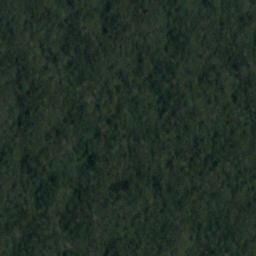

True label
clear primary
Predicted
['primary clear']


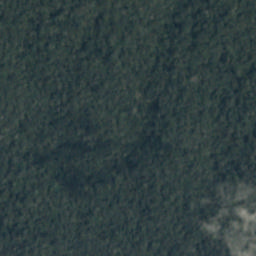

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


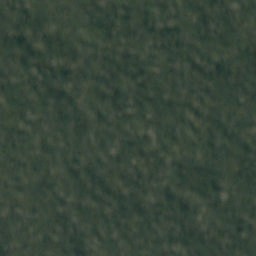

True label
clear primary
Predicted
['primary clear']


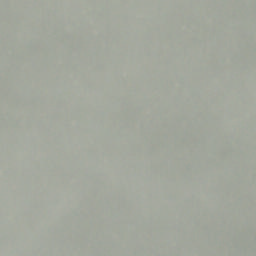

True label
cloudy
Predicted
['cloudy']


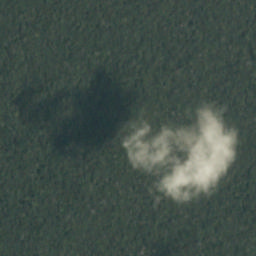

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


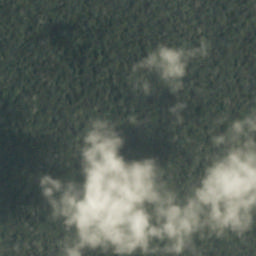

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


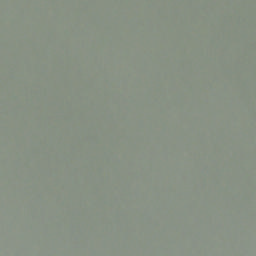

True label
cloudy
Predicted
['cloudy']


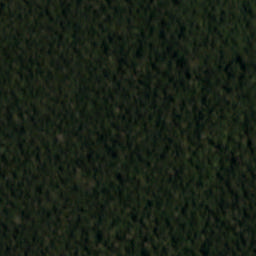

True label
clear primary
Predicted
['primary clear']


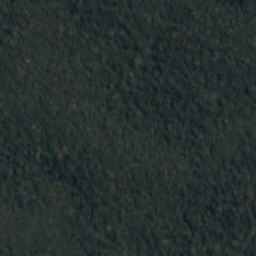

True label
clear primary
Predicted
['primary clear']


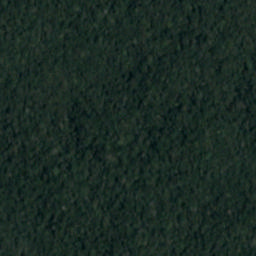

True label
clear primary
Predicted
['primary clear']


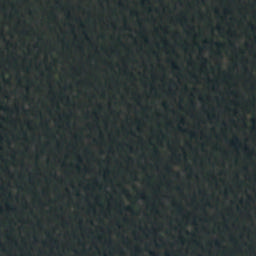

True label
clear primary
Predicted
['primary clear']


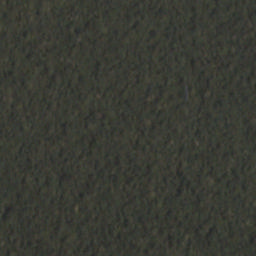

True label
clear primary
Predicted
['primary clear']


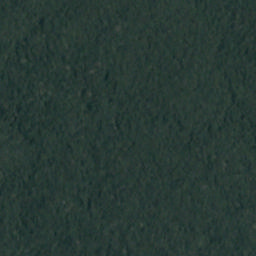

True label
clear primary
Predicted
['primary clear']


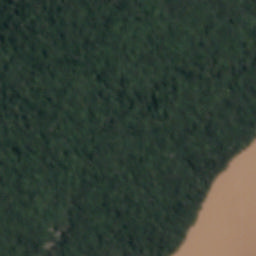

True label
clear primary water
Predicted
['water primary clear']


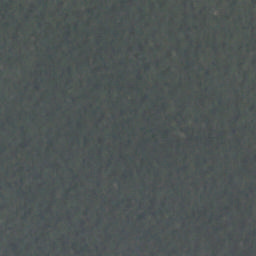

True label
clear primary
Predicted
['primary clear']


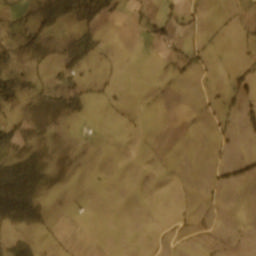

True label
agriculture clear habitation primary road
Predicted
['habitation road agriculture primary clear']


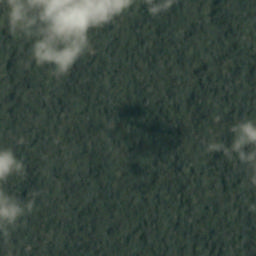

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


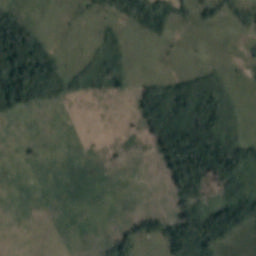

True label
agriculture clear cultivation primary
Predicted
['cultivation agriculture primary clear']


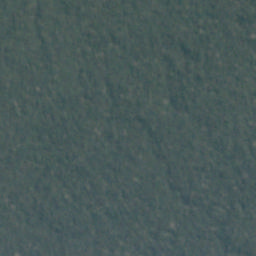

True label
clear primary
Predicted
['primary clear']


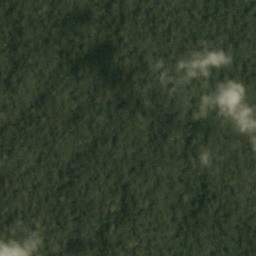

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


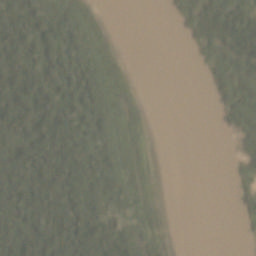

True label
clear primary water
Predicted
['water primary clear']


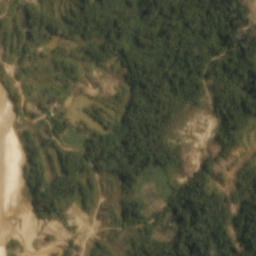

True label
artisinal_mine clear primary road water
Predicted
['artisinal_mine road water primary clear']


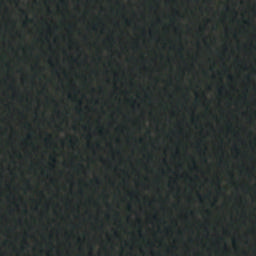

True label
clear primary
Predicted
['primary clear']


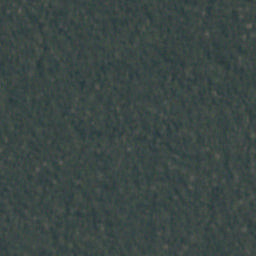

True label
clear primary
Predicted
['primary clear']


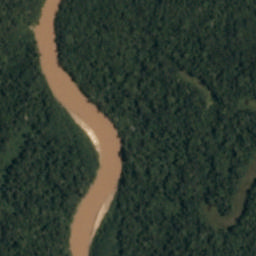

True label
clear primary water
Predicted
['water primary clear']


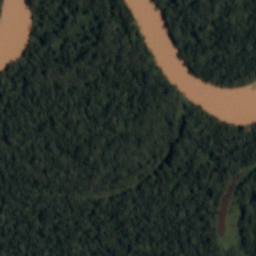

True label
clear primary water
Predicted
['water primary clear']


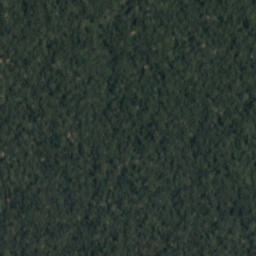

True label
clear primary
Predicted
['primary clear']


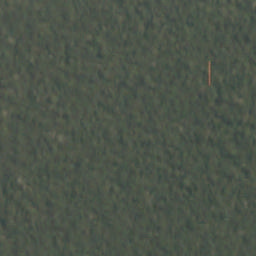

True label
clear primary
Predicted
['primary clear']


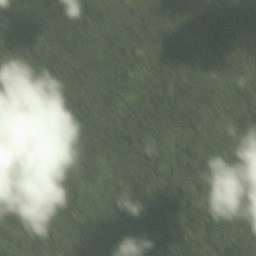

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


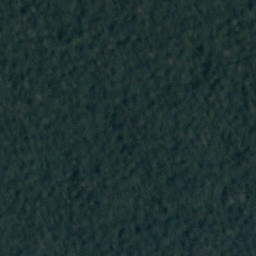

True label
clear primary
Predicted
['primary clear']


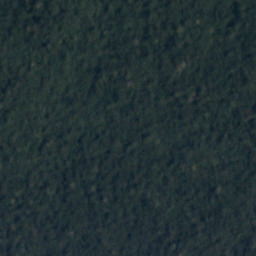

True label
clear primary
Predicted
['primary clear']


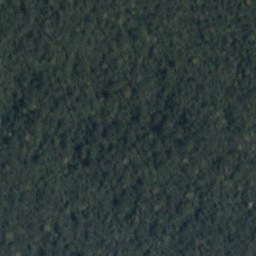

True label
clear primary
Predicted
['primary clear']


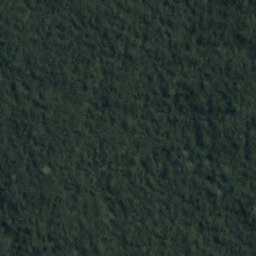

True label
clear primary
Predicted
['primary clear']


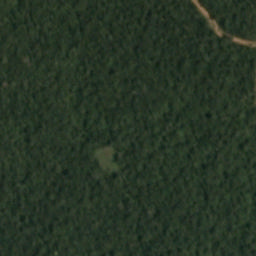

True label
agriculture clear cultivation primary road water
Predicted
['cultivation road agriculture water primary clear']


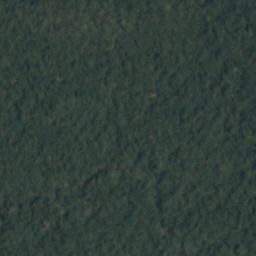

True label
clear primary
Predicted
['primary clear']


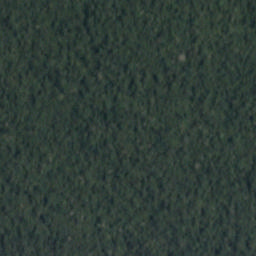

True label
clear primary
Predicted
['primary clear']


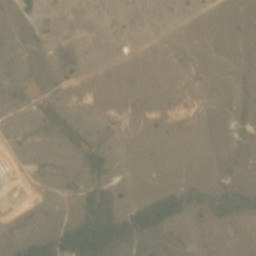

True label
agriculture clear habitation primary road
Predicted
['habitation road agriculture primary clear']


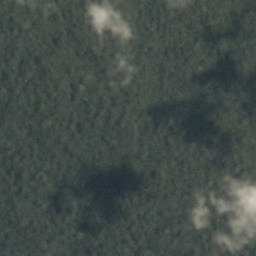

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


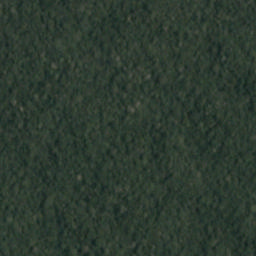

True label
clear primary
Predicted
['primary clear']


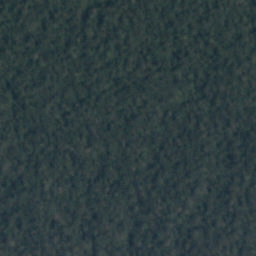

True label
clear primary
Predicted
['primary clear']


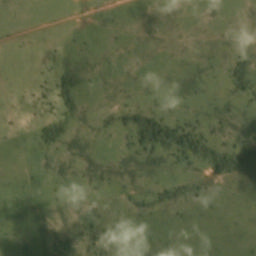

True label
agriculture partly_cloudy primary road
Predicted
['road agriculture primary partly_cloudy']


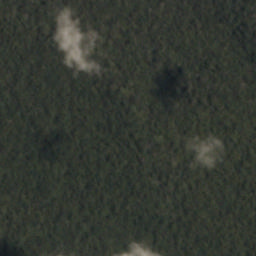

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


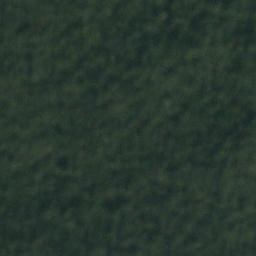

True label
clear primary
Predicted
['primary clear']


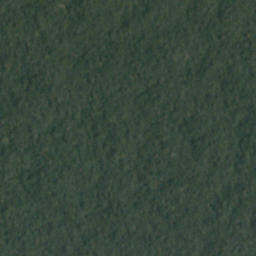

True label
clear primary
Predicted
['primary clear']


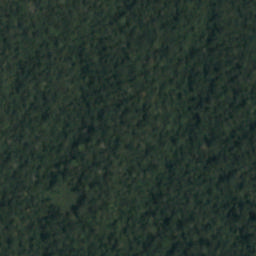

True label
clear primary
Predicted
['primary clear']


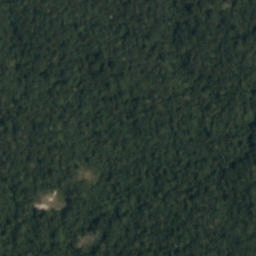

True label
agriculture clear cultivation primary
Predicted
['cultivation agriculture primary clear']


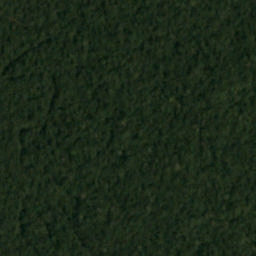

True label
clear primary
Predicted
['primary clear']


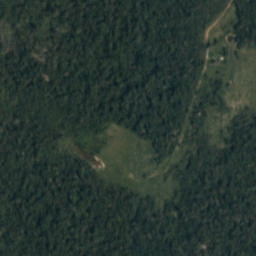

True label
agriculture clear cultivation habitation primary road
Predicted
['cultivation habitation road agriculture primary clear']


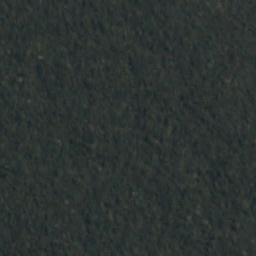

True label
clear primary
Predicted
['primary clear']


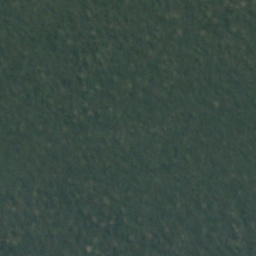

True label
clear primary
Predicted
['primary clear']


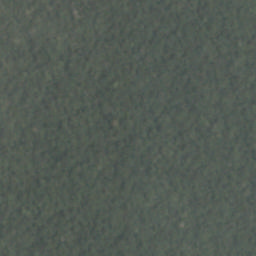

True label
clear primary
Predicted
['primary clear']


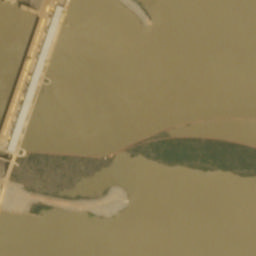

True label
agriculture clear habitation primary road water
Predicted
['habitation road agriculture water primary clear']


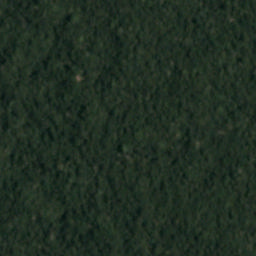

True label
clear primary
Predicted
['primary clear']


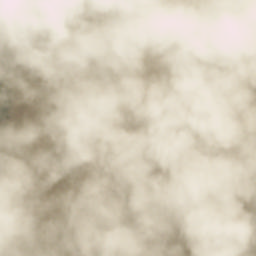

True label
cloudy
Predicted
['cloudy']


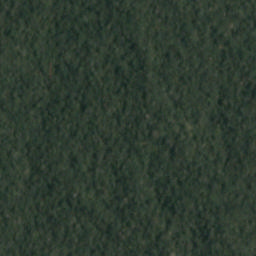

True label
clear primary
Predicted
['primary clear']


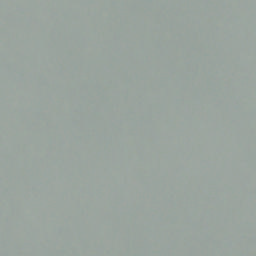

True label
cloudy
Predicted
['cloudy']


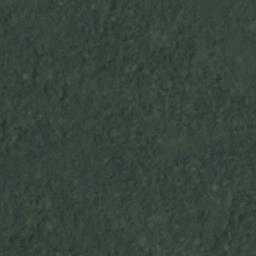

True label
clear primary
Predicted
['primary clear']


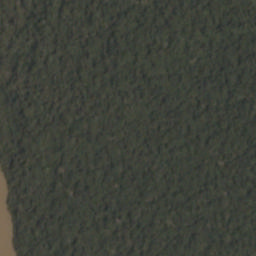

True label
clear primary water
Predicted
['water primary clear']


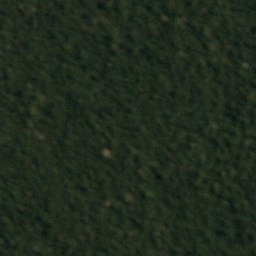

True label
clear primary
Predicted
['primary clear']


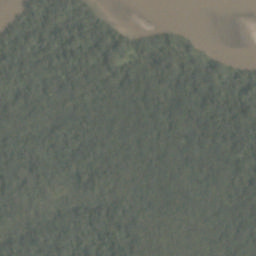

True label
clear primary water
Predicted
['water primary clear']


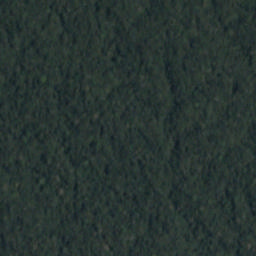

True label
clear primary
Predicted
['primary clear']


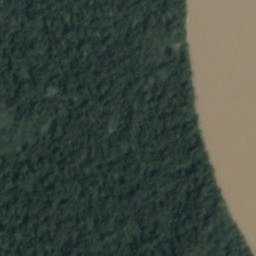

True label
clear primary water
Predicted
['water primary clear']


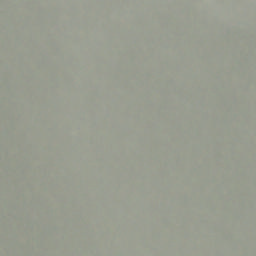

True label
cloudy
Predicted
['cloudy']


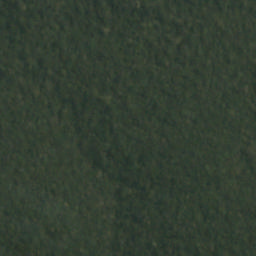

True label
clear primary
Predicted
['primary clear']


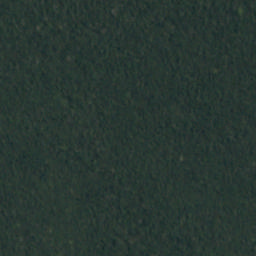

True label
clear primary
Predicted
['primary clear']


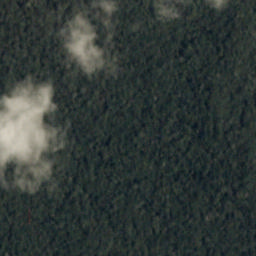

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


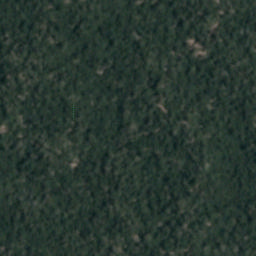

True label
clear primary selective_logging
Predicted
['selective_logging primary clear']


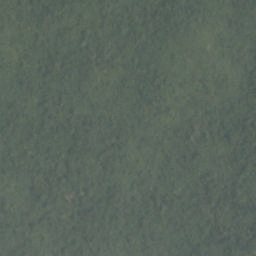

True label
clear primary
Predicted
['primary clear']


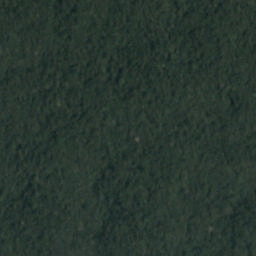

True label
clear primary
Predicted
['primary clear']


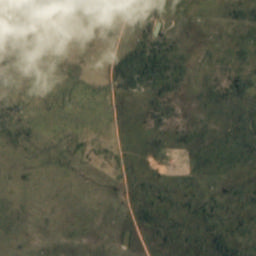

True label
agriculture cultivation partly_cloudy primary road
Predicted
['cultivation road agriculture primary partly_cloudy']


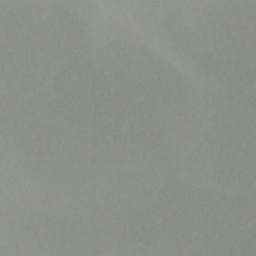

True label
cloudy
Predicted
['cloudy']


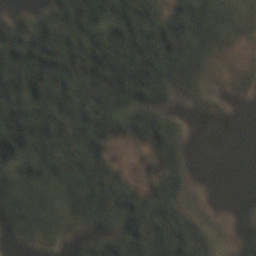

True label
agriculture clear cultivation primary water
Predicted
['cultivation agriculture water primary clear']


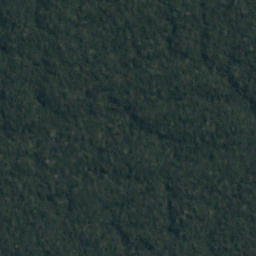

True label
clear primary
Predicted
['primary clear']


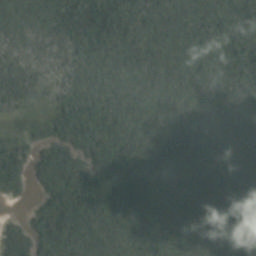

True label
partly_cloudy primary water
Predicted
['water primary partly_cloudy']


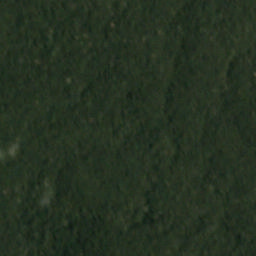

True label
clear primary
Predicted
['primary clear']


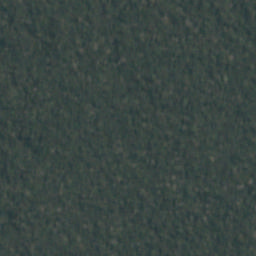

True label
clear primary
Predicted
['primary clear']


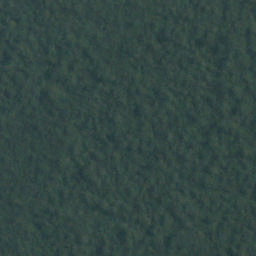

True label
clear primary
Predicted
['primary clear']


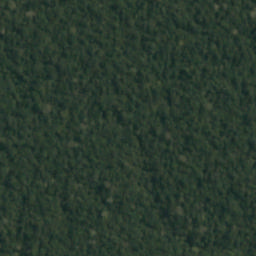

True label
clear primary
Predicted
['primary clear']


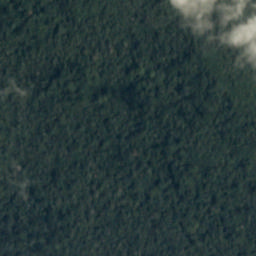

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


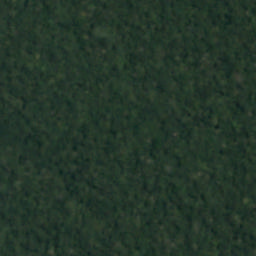

True label
clear primary
Predicted
['primary clear']


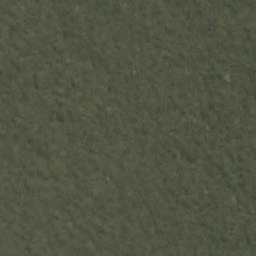

True label
clear primary
Predicted
['primary clear']


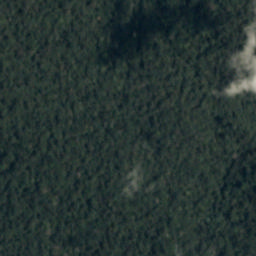

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


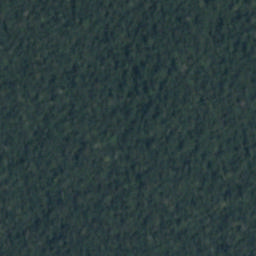

True label
clear primary
Predicted
['primary clear']


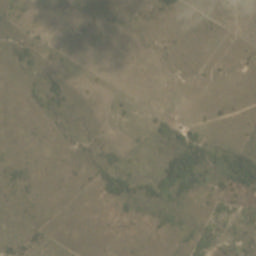

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


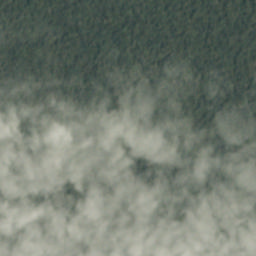

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


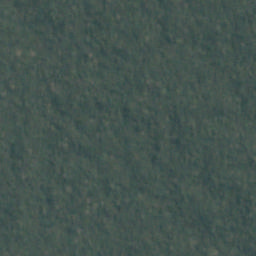

True label
clear primary
Predicted
['primary clear']


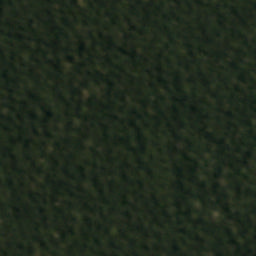

True label
clear primary
Predicted
['primary clear']


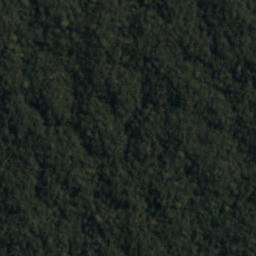

True label
clear primary
Predicted
['primary clear']


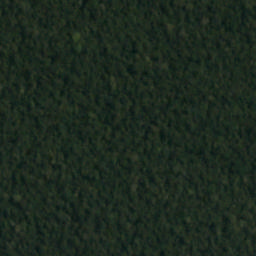

True label
clear primary
Predicted
['primary clear']


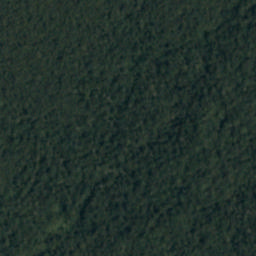

True label
clear primary
Predicted
['primary clear']


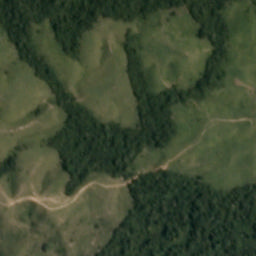

True label
agriculture clear cultivation primary road
Predicted
['cultivation road agriculture primary clear']


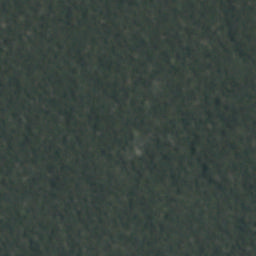

True label
clear primary
Predicted
['primary clear']


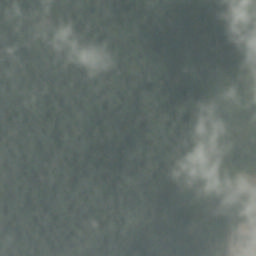

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


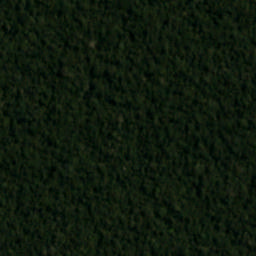

True label
clear primary
Predicted
['primary clear']


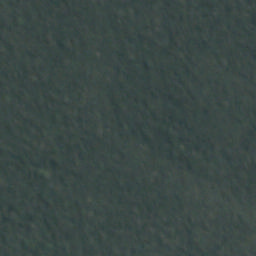

True label
clear primary
Predicted
['primary clear']


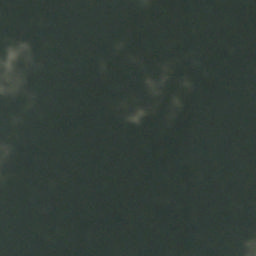

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


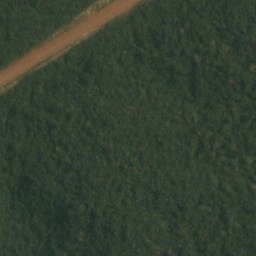

True label
clear primary road water
Predicted
['road water primary clear']


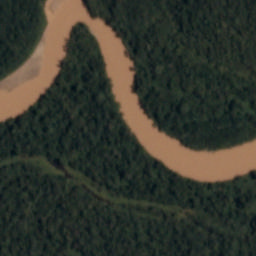

True label
clear primary road water
Predicted
['road water primary clear']


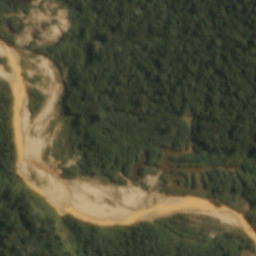

True label
artisinal_mine clear primary water
Predicted
['artisinal_mine water primary clear']


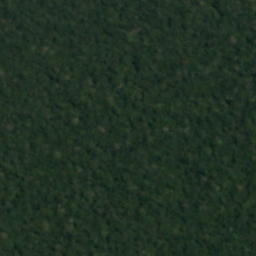

True label
clear primary
Predicted
['primary clear']


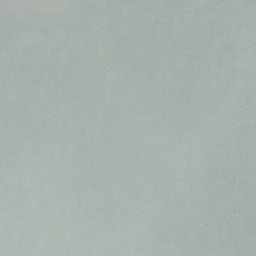

True label
cloudy
Predicted
['cloudy']


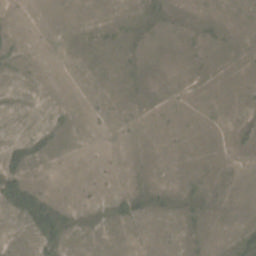

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


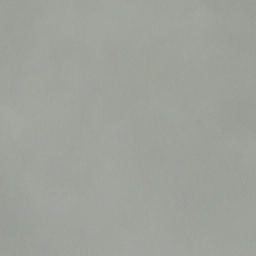

True label
cloudy
Predicted
['cloudy']


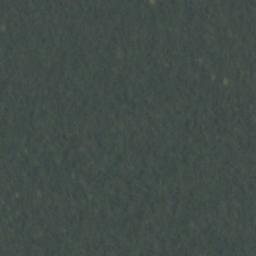

True label
clear primary
Predicted
['primary clear']


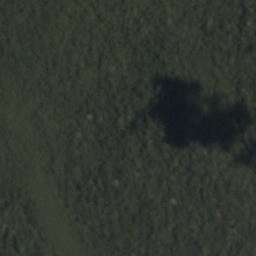

True label
clear primary
Predicted
['primary clear']


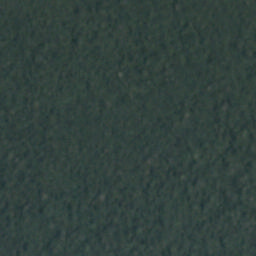

True label
clear primary
Predicted
['primary clear']


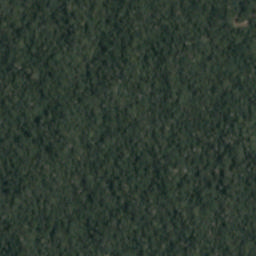

True label
clear primary
Predicted
['primary clear']


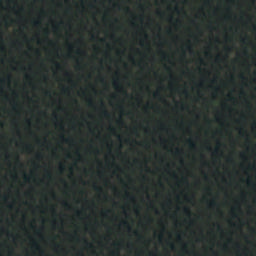

True label
clear primary
Predicted
['primary clear']


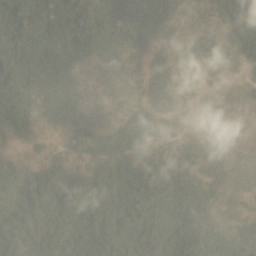

True label
agriculture partly_cloudy primary
Predicted
['agriculture primary partly_cloudy']


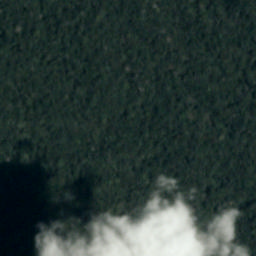

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


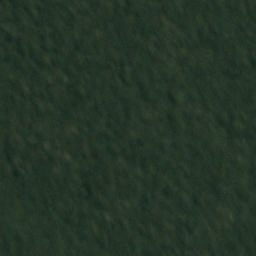

True label
clear primary
Predicted
['primary clear']


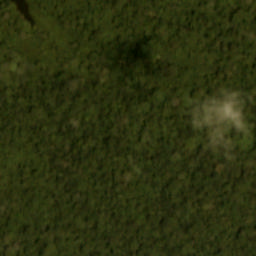

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


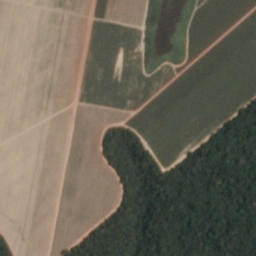

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


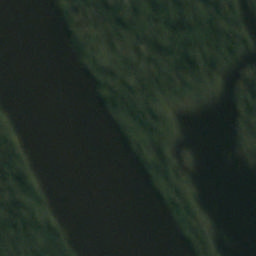

True label
clear primary water
Predicted
['water primary clear']


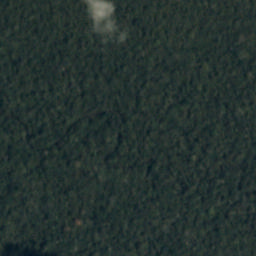

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


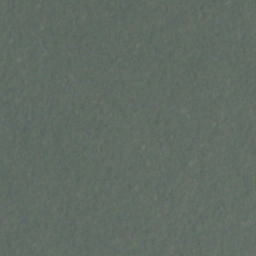

True label
haze primary
Predicted
['primary haze']


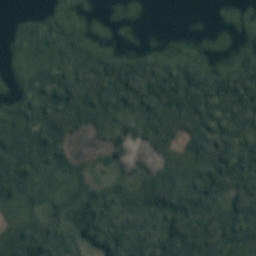

True label
agriculture clear cultivation primary slash_burn water
Predicted
['slash_burn cultivation agriculture water primary clear']


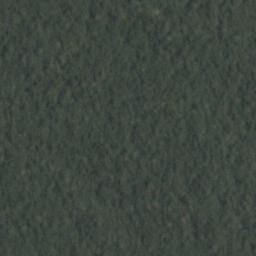

True label
clear primary
Predicted
['primary clear']


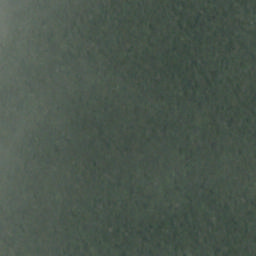

True label
clear primary
Predicted
['primary clear']


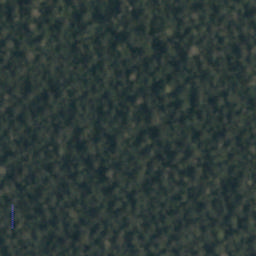

True label
clear primary
Predicted
['primary clear']


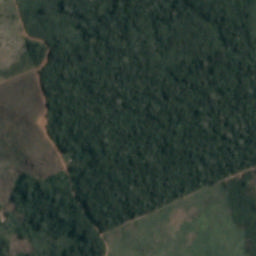

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


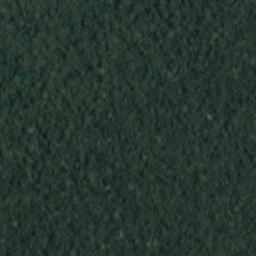

True label
clear primary
Predicted
['primary clear']


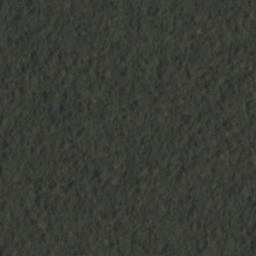

True label
clear primary
Predicted
['primary clear']


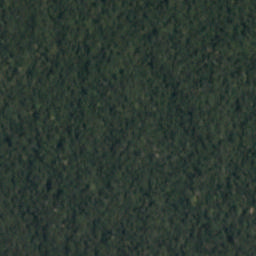

True label
clear primary
Predicted
['primary clear']


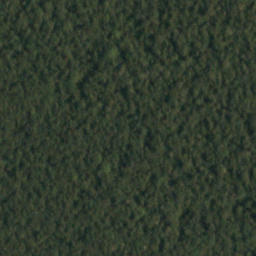

True label
clear primary
Predicted
['primary clear']


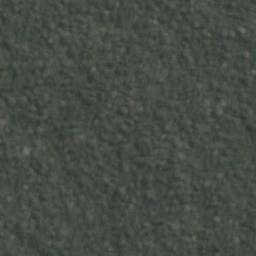

True label
clear primary
Predicted
['primary clear']


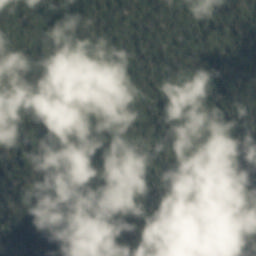

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


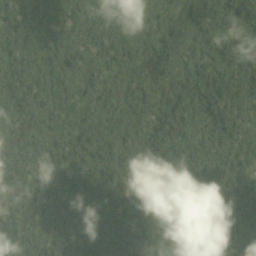

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


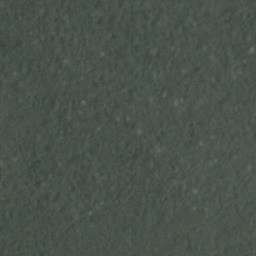

True label
clear primary
Predicted
['primary clear']


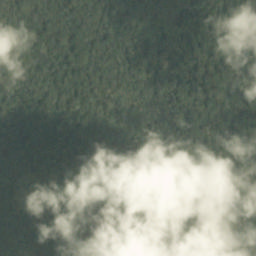

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


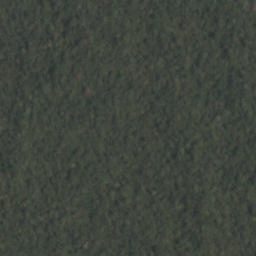

True label
clear primary
Predicted
['primary clear']


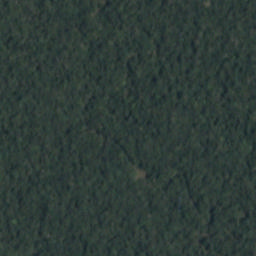

True label
clear primary
Predicted
['primary clear']


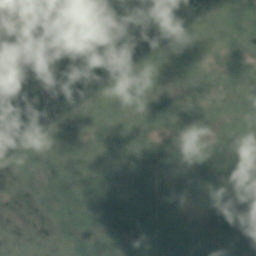

True label
agriculture partly_cloudy primary
Predicted
['agriculture primary partly_cloudy']


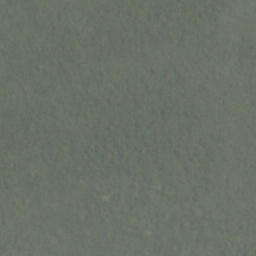

True label
haze primary
Predicted
['primary haze']


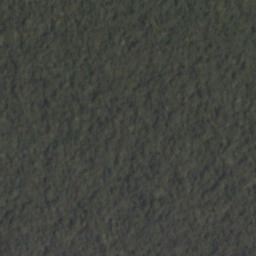

True label
clear primary
Predicted
['primary clear']


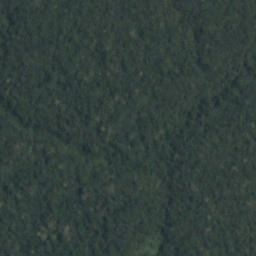

True label
clear primary
Predicted
['primary clear']


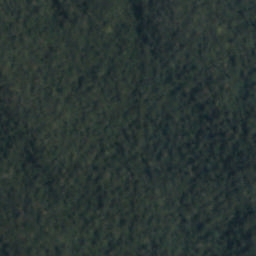

True label
clear primary
Predicted
['primary clear']


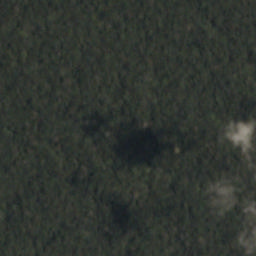

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


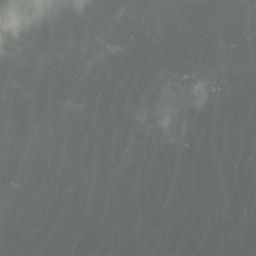

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


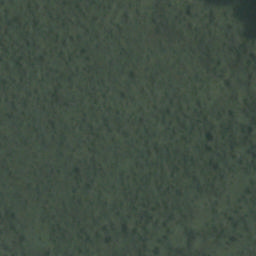

True label
clear primary
Predicted
['primary clear']


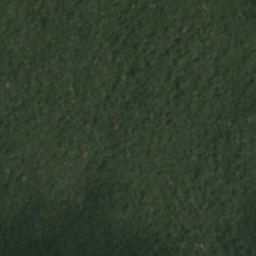

True label
clear primary
Predicted
['primary clear']


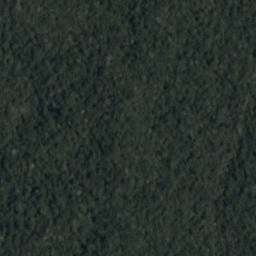

True label
clear primary
Predicted
['primary clear']


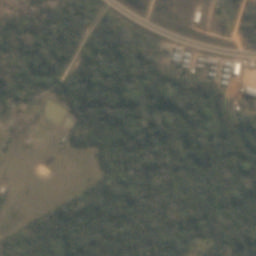

True label
agriculture clear habitation primary road
Predicted
['habitation road agriculture primary clear']


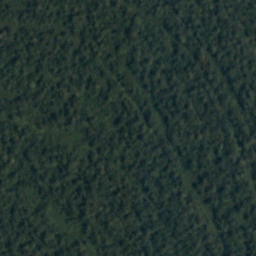

True label
clear primary
Predicted
['primary clear']


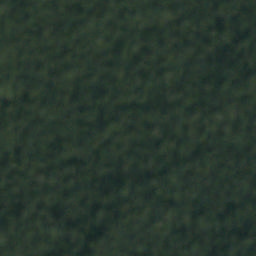

True label
clear primary
Predicted
['primary clear']


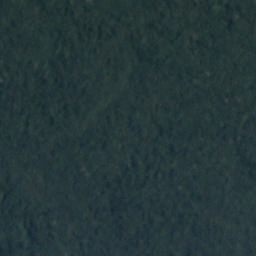

True label
clear primary
Predicted
['primary clear']


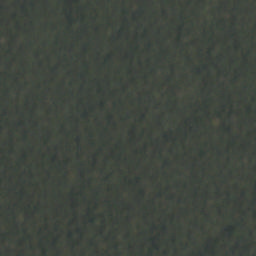

True label
clear primary
Predicted
['primary clear']


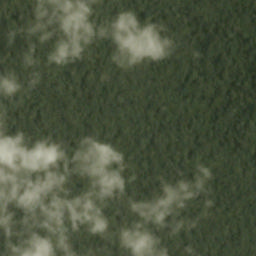

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


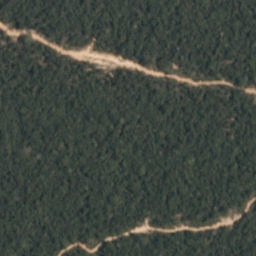

True label
clear primary road water
Predicted
['road water primary clear']


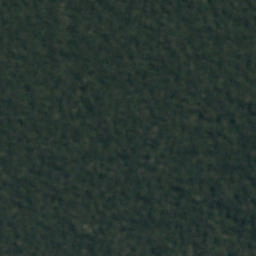

True label
clear primary
Predicted
['primary clear']


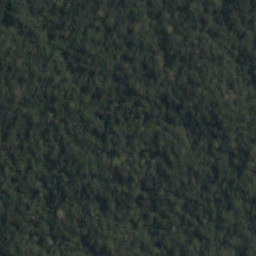

True label
clear primary
Predicted
['primary clear']


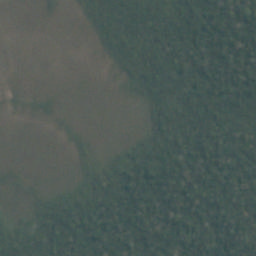

True label
agriculture clear primary
Predicted
['agriculture primary clear']


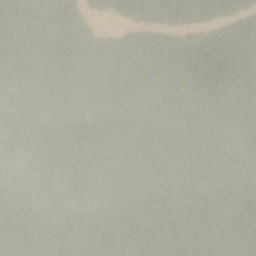

True label
haze primary water
Predicted
['water primary haze']


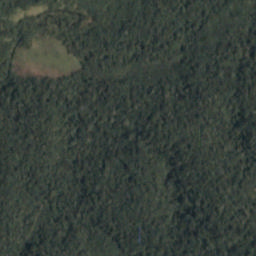

True label
agriculture clear cultivation primary
Predicted
['cultivation agriculture primary clear']


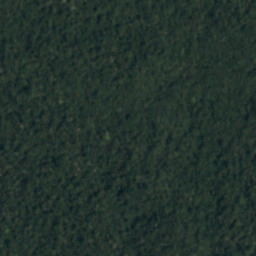

True label
clear primary
Predicted
['primary clear']


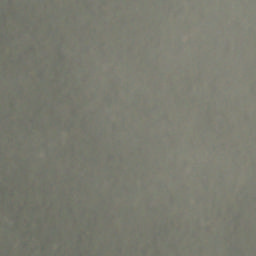

True label
haze primary
Predicted
['primary haze']


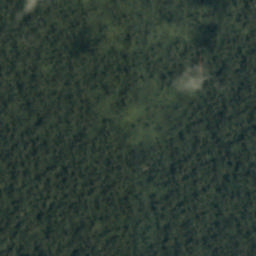

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


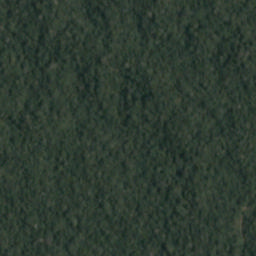

True label
clear primary
Predicted
['primary clear']


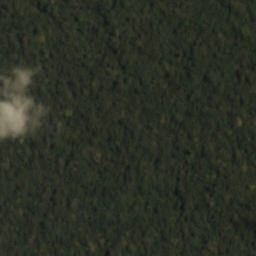

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


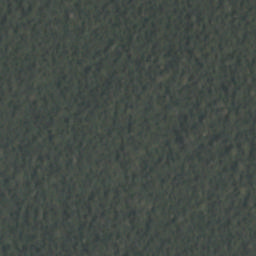

True label
clear primary
Predicted
['primary clear']


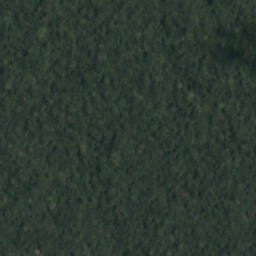

True label
clear primary
Predicted
['primary clear']


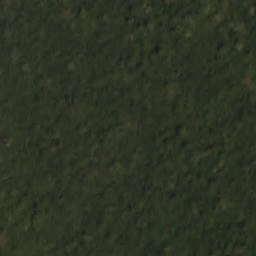

True label
clear primary
Predicted
['primary clear']


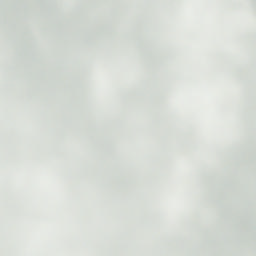

True label
cloudy
Predicted
['cloudy']


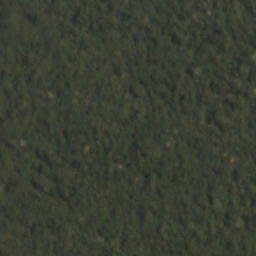

True label
clear primary
Predicted
['primary clear']


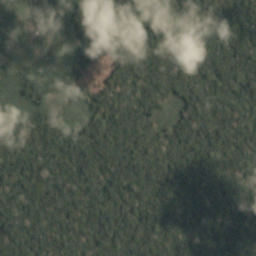

True label
agriculture cultivation partly_cloudy primary slash_burn
Predicted
['slash_burn cultivation agriculture primary partly_cloudy']


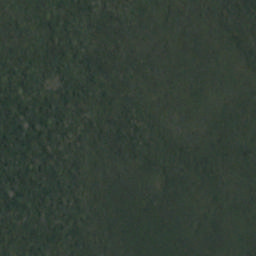

True label
clear primary
Predicted
['primary clear']


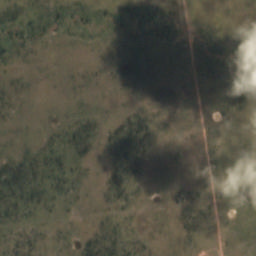

True label
agriculture habitation partly_cloudy primary road
Predicted
['habitation road agriculture primary partly_cloudy']


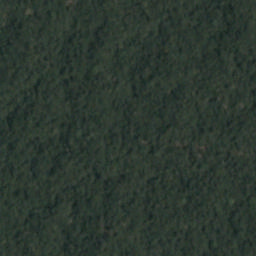

True label
clear primary
Predicted
['primary clear']


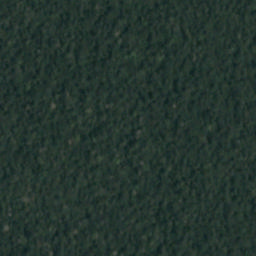

True label
clear primary
Predicted
['primary clear']


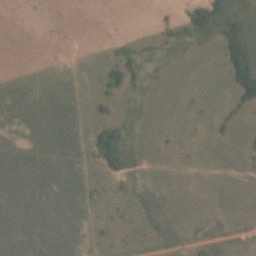

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


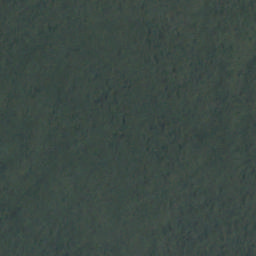

True label
clear primary
Predicted
['primary clear']


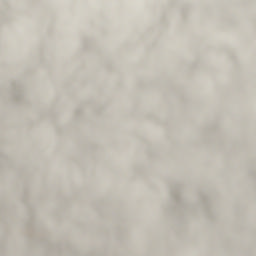

True label
cloudy
Predicted
['cloudy']


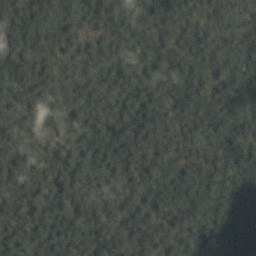

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


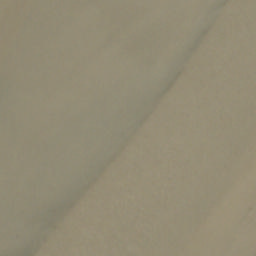

True label
agriculture clear primary water
Predicted
['agriculture water primary clear']


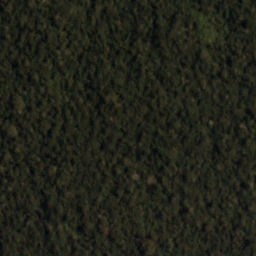

True label
clear primary
Predicted
['primary clear']


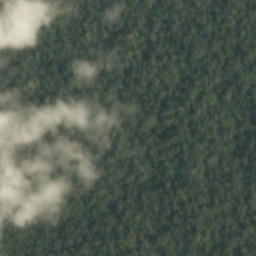

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


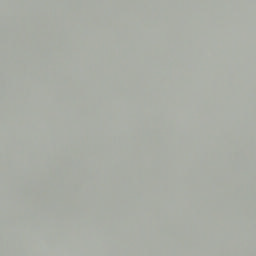

True label
cloudy
Predicted
['cloudy']


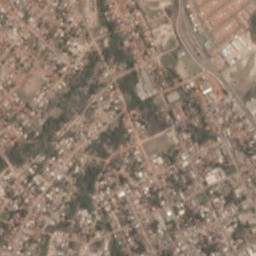

True label
clear habitation primary road
Predicted
['habitation road primary clear']


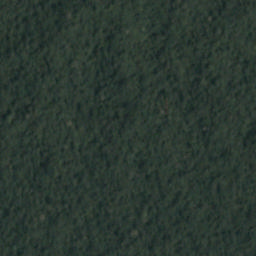

True label
clear primary
Predicted
['primary clear']


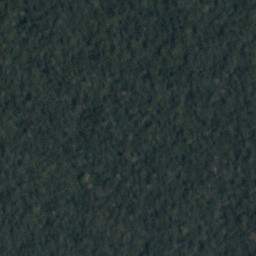

True label
clear primary
Predicted
['primary clear']


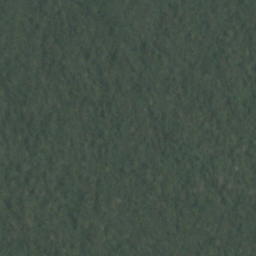

True label
clear primary
Predicted
['primary clear']


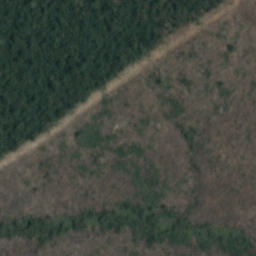

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


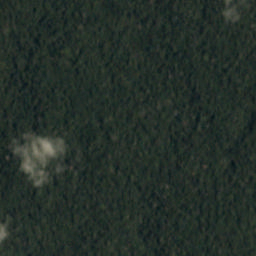

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


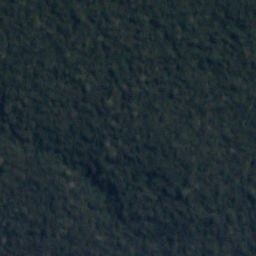

True label
clear primary
Predicted
['primary clear']


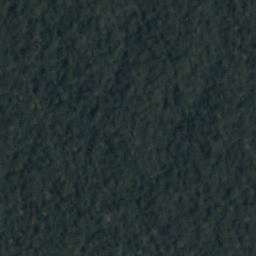

True label
clear primary
Predicted
['primary clear']


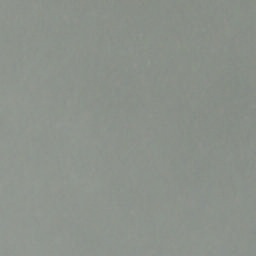

True label
cloudy
Predicted
['cloudy']


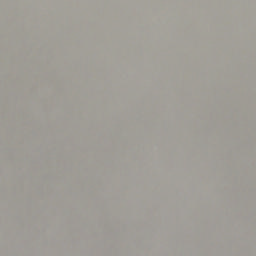

True label
cloudy
Predicted
['cloudy']


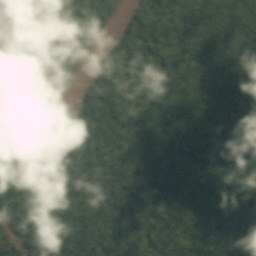

True label
partly_cloudy primary water
Predicted
['water primary partly_cloudy']


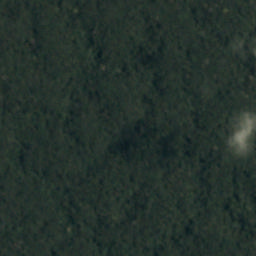

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


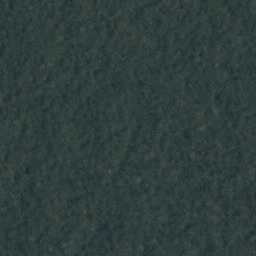

True label
clear primary
Predicted
['primary clear']


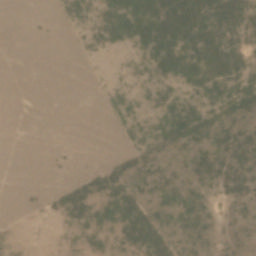

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


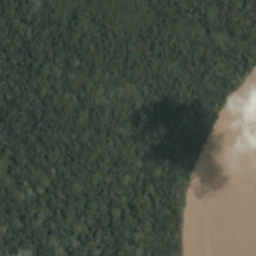

True label
partly_cloudy primary water
Predicted
['water primary partly_cloudy']


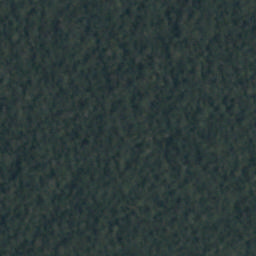

True label
clear primary
Predicted
['primary clear']


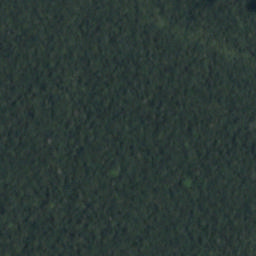

True label
clear primary
Predicted
['primary clear']


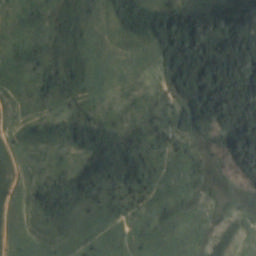

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


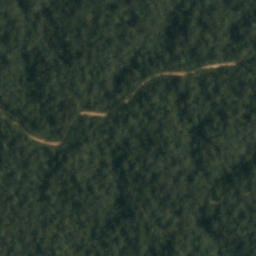

True label
clear primary road water
Predicted
['road water primary clear']


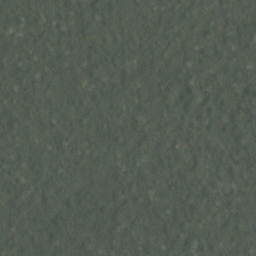

True label
clear primary
Predicted
['primary clear']


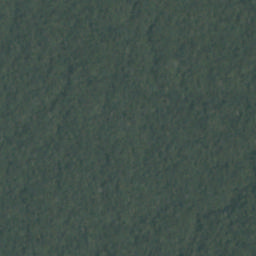

True label
clear primary
Predicted
['primary clear']


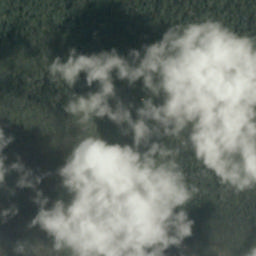

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


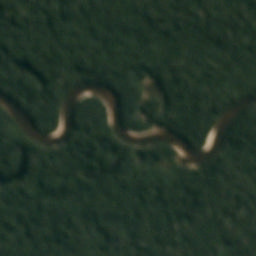

True label
clear primary water
Predicted
['water primary clear']


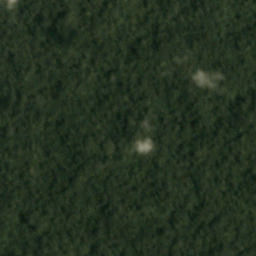

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


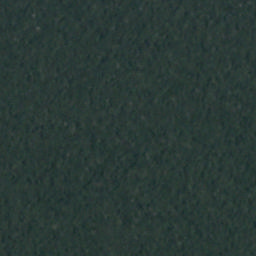

True label
clear primary
Predicted
['primary clear']


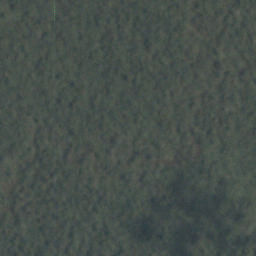

True label
clear primary
Predicted
['primary clear']


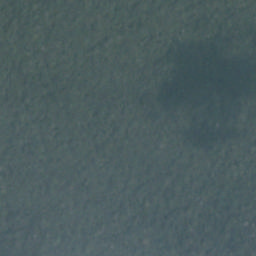

True label
clear primary
Predicted
['primary clear']


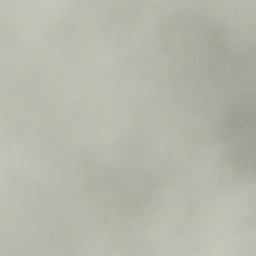

True label
cloudy
Predicted
['cloudy']


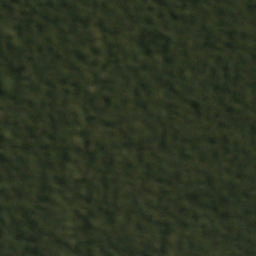

True label
clear primary
Predicted
['primary clear']


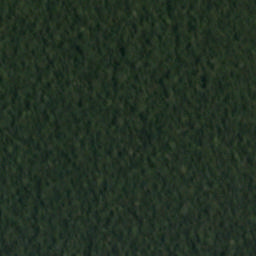

True label
clear primary
Predicted
['primary clear']


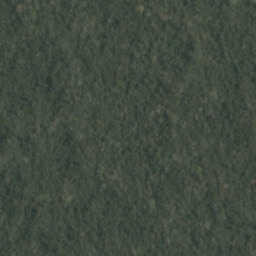

True label
clear primary
Predicted
['primary clear']


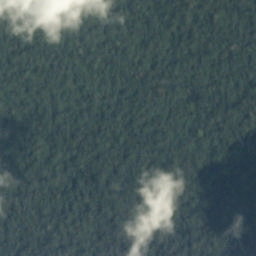

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


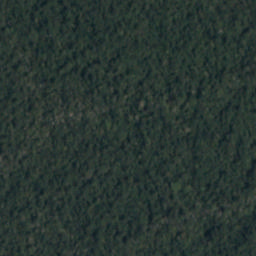

True label
clear primary
Predicted
['primary clear']


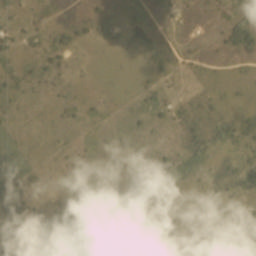

True label
agriculture habitation partly_cloudy primary road
Predicted
['habitation road agriculture primary partly_cloudy']


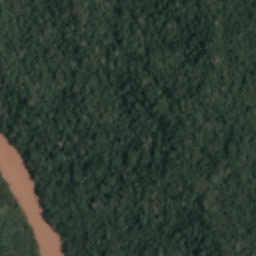

True label
clear primary water
Predicted
['water primary clear']


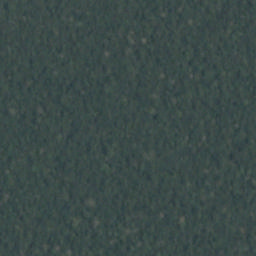

True label
clear primary
Predicted
['primary clear']


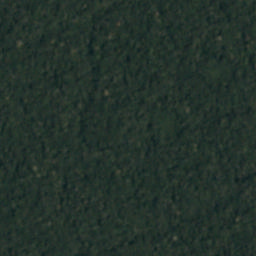

True label
clear primary
Predicted
['primary clear']


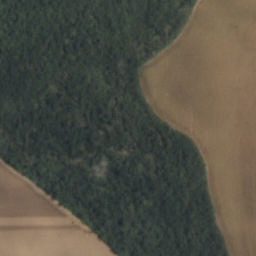

True label
agriculture clear primary water
Predicted
['agriculture water primary clear']


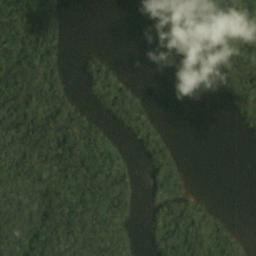

True label
partly_cloudy primary water
Predicted
['water primary partly_cloudy']


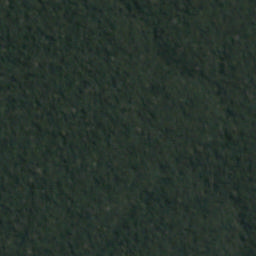

True label
clear primary
Predicted
['primary clear']


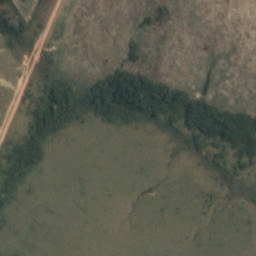

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


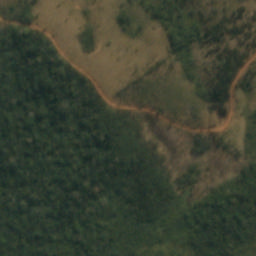

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


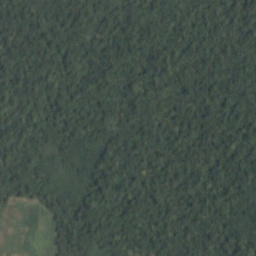

True label
agriculture clear cultivation primary
Predicted
['cultivation agriculture primary clear']


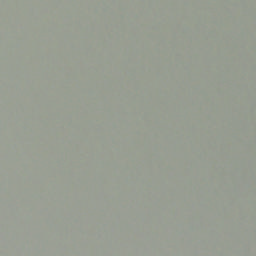

True label
cloudy
Predicted
['cloudy']


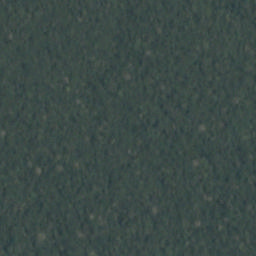

True label
clear primary
Predicted
['primary clear']


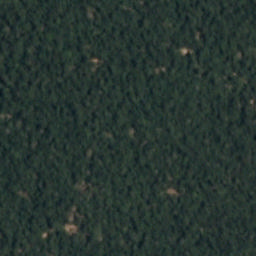

True label
clear primary selective_logging
Predicted
['selective_logging primary clear']


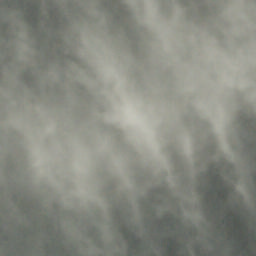

True label
cloudy
Predicted
['cloudy']


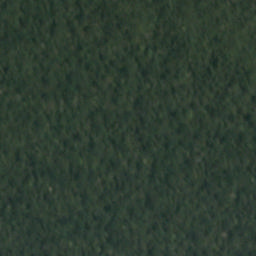

True label
clear primary
Predicted
['primary clear']


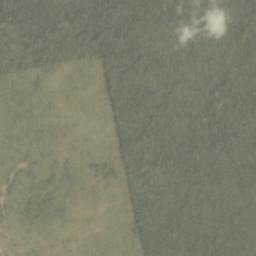

True label
agriculture partly_cloudy primary road
Predicted
['road agriculture primary partly_cloudy']


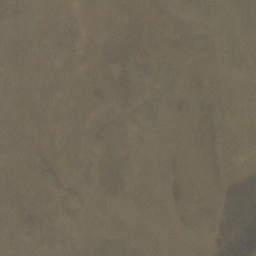

True label
bare_ground clear
Predicted
['bare_ground clear']


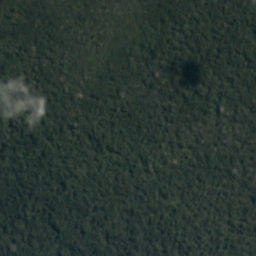

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


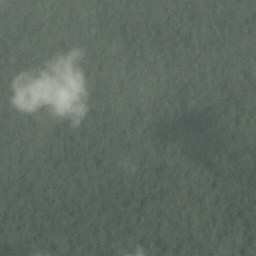

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


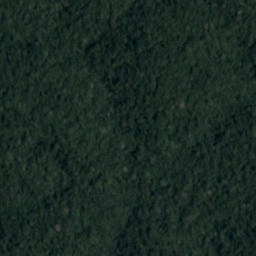

True label
clear primary
Predicted
['primary clear']


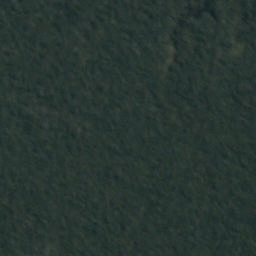

True label
clear primary
Predicted
['primary clear']


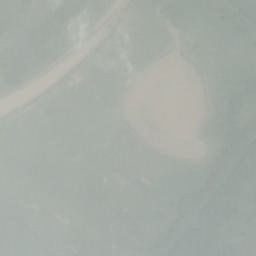

True label
agriculture haze primary water
Predicted
['agriculture water primary haze']


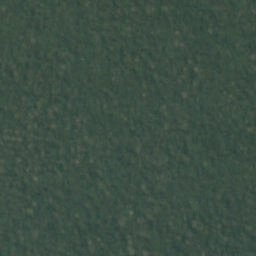

True label
clear primary
Predicted
['primary clear']


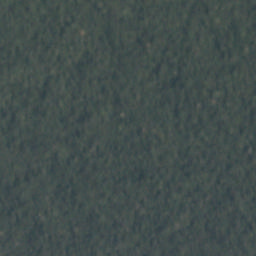

True label
clear primary
Predicted
['primary clear']


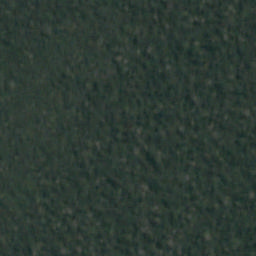

True label
clear primary
Predicted
['primary clear']


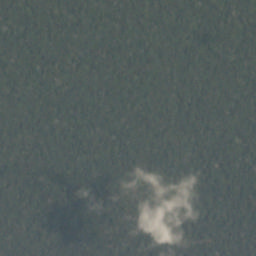

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


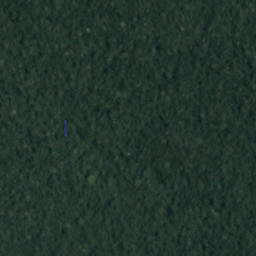

True label
clear primary
Predicted
['primary clear']


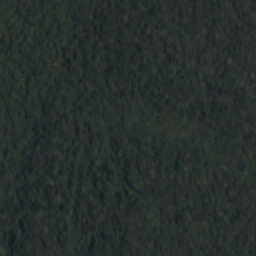

True label
clear primary
Predicted
['primary clear']


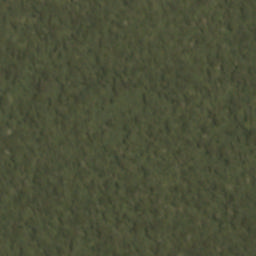

True label
clear primary
Predicted
['primary clear']


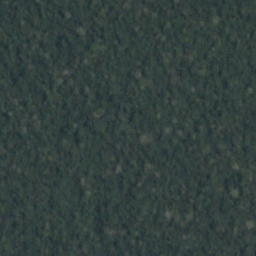

True label
clear primary
Predicted
['primary clear']


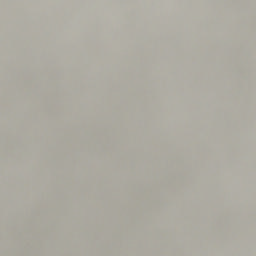

True label
cloudy
Predicted
['cloudy']


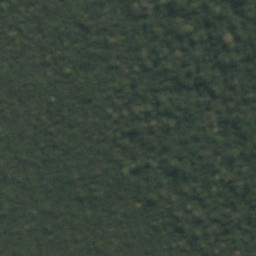

True label
clear primary
Predicted
['primary clear']


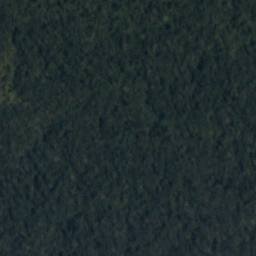

True label
clear primary
Predicted
['primary clear']


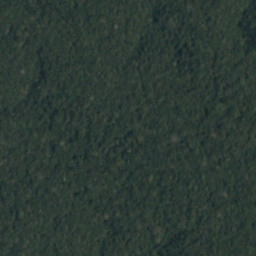

True label
clear primary
Predicted
['primary clear']


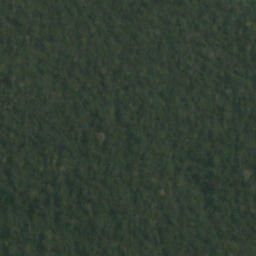

True label
clear primary
Predicted
['primary clear']


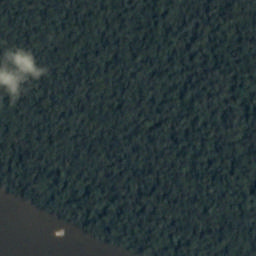

True label
partly_cloudy primary water
Predicted
['water primary partly_cloudy']


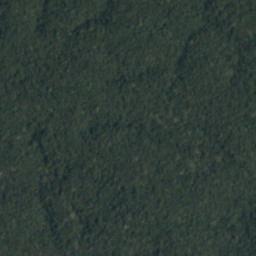

True label
clear primary
Predicted
['primary clear']


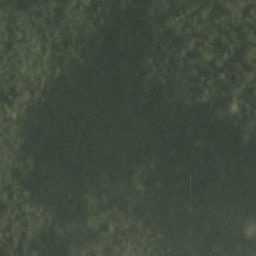

True label
clear primary
Predicted
['primary clear']


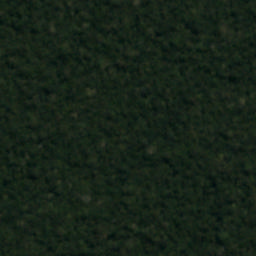

True label
clear primary
Predicted
['primary clear']


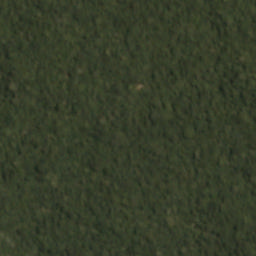

True label
clear primary
Predicted
['primary clear']


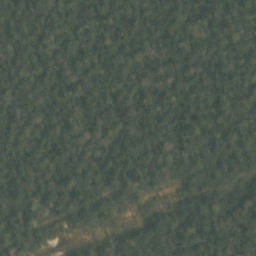

True label
clear primary
Predicted
['primary clear']


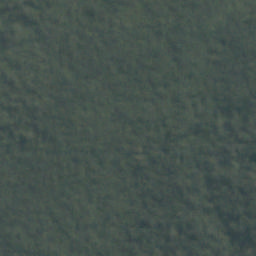

True label
clear primary
Predicted
['primary clear']


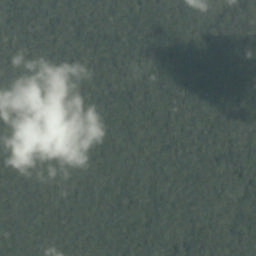

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


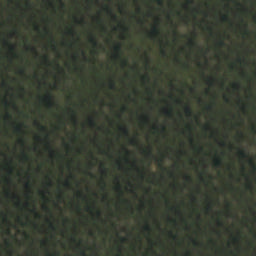

True label
clear primary
Predicted
['primary clear']


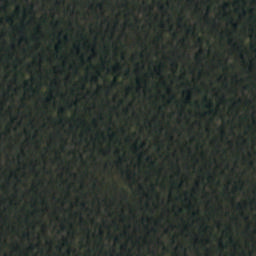

True label
clear primary
Predicted
['primary clear']


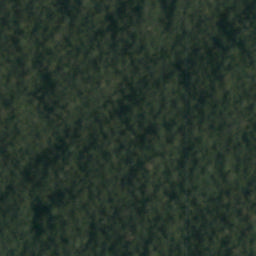

True label
clear primary
Predicted
['primary clear']


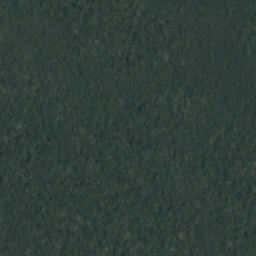

True label
clear primary
Predicted
['primary clear']


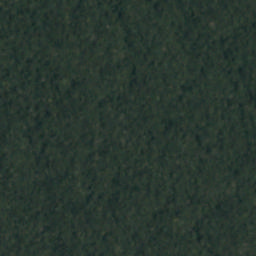

True label
clear primary
Predicted
['primary clear']


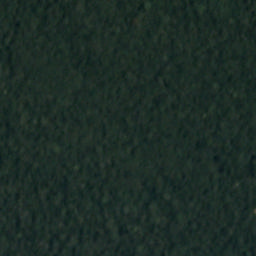

True label
clear primary
Predicted
['primary clear']


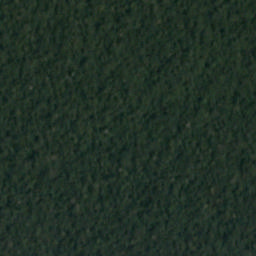

True label
clear primary
Predicted
['primary clear']


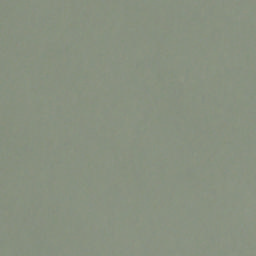

True label
cloudy
Predicted
['cloudy']


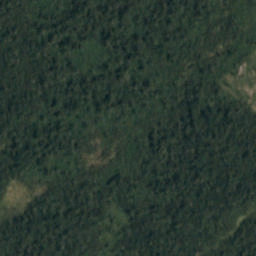

True label
agriculture clear cultivation primary
Predicted
['cultivation agriculture primary clear']


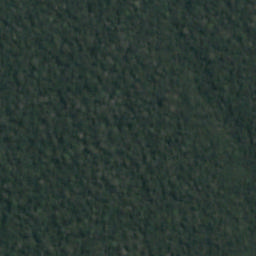

True label
clear primary
Predicted
['primary clear']


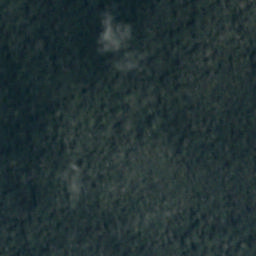

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


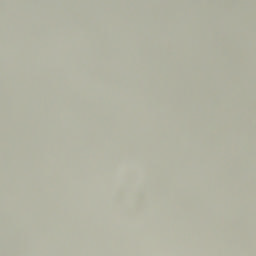

True label
cloudy
Predicted
['cloudy']


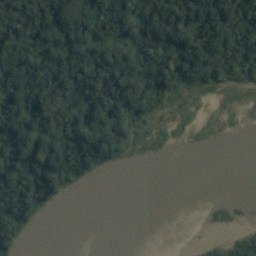

True label
agriculture clear primary water
Predicted
['agriculture water primary clear']


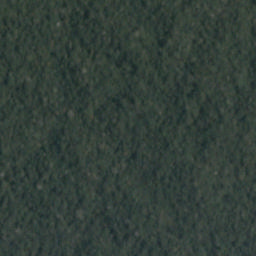

True label
clear primary
Predicted
['primary clear']


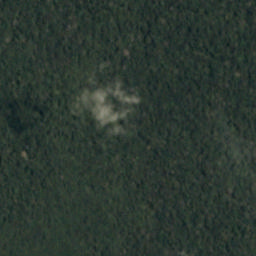

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


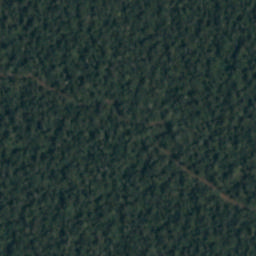

True label
clear primary road water
Predicted
['road water primary clear']


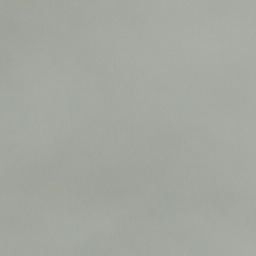

True label
cloudy
Predicted
['cloudy']


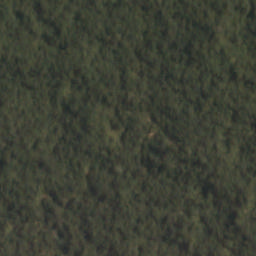

True label
clear primary
Predicted
['primary clear']


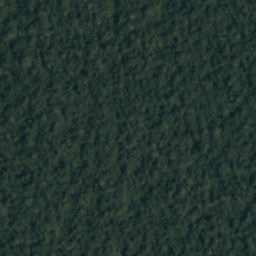

True label
clear primary
Predicted
['primary clear']


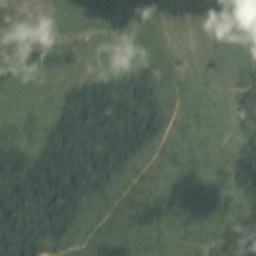

True label
agriculture partly_cloudy primary road
Predicted
['road agriculture primary partly_cloudy']


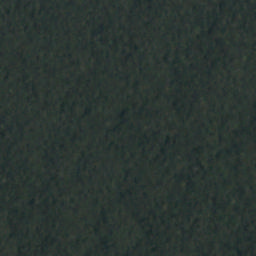

True label
clear primary
Predicted
['primary clear']


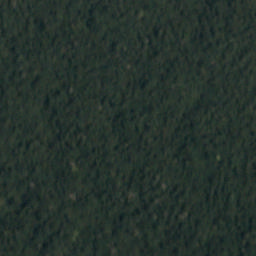

True label
clear primary
Predicted
['primary clear']


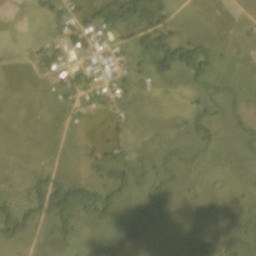

True label
agriculture clear habitation primary road
Predicted
['habitation road agriculture primary clear']


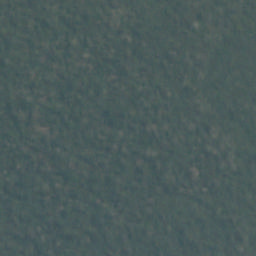

True label
clear primary
Predicted
['primary clear']


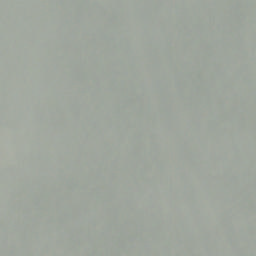

True label
cloudy
Predicted
['cloudy']


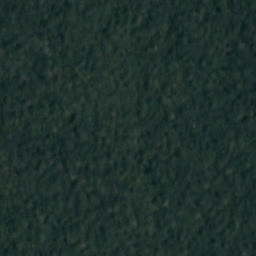

True label
clear primary
Predicted
['primary clear']


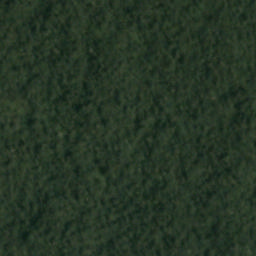

True label
clear primary
Predicted
['primary clear']


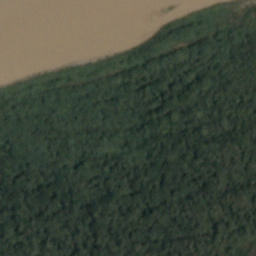

True label
clear primary water
Predicted
['water primary clear']


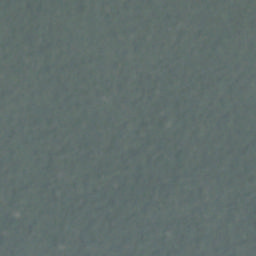

True label
haze primary
Predicted
['primary haze']


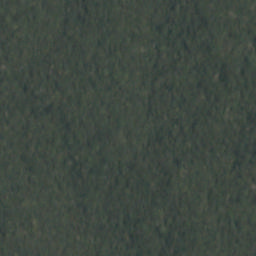

True label
clear primary
Predicted
['primary clear']


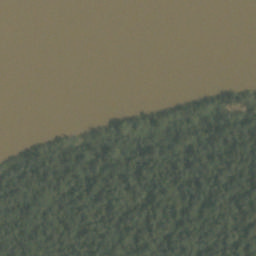

True label
clear primary water
Predicted
['water primary clear']


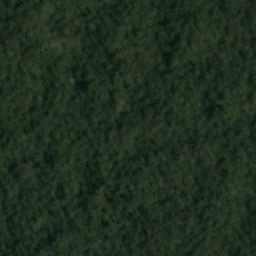

True label
clear primary
Predicted
['primary clear']


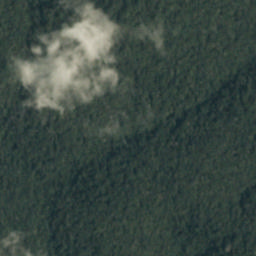

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


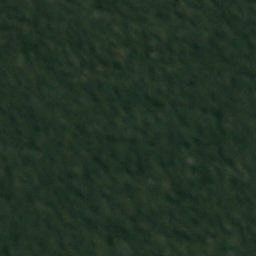

True label
clear primary
Predicted
['primary clear']


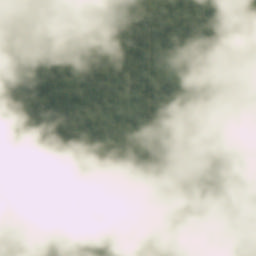

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


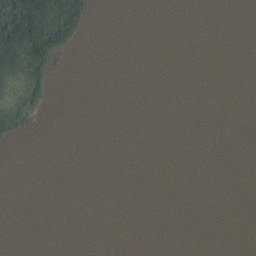

True label
clear primary water
Predicted
['water primary clear']


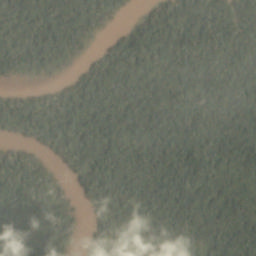

True label
partly_cloudy primary water
Predicted
['water primary partly_cloudy']


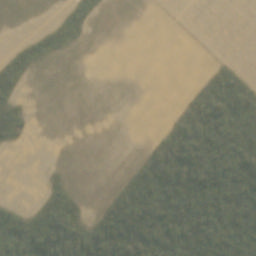

True label
agriculture clear primary road
Predicted
['road agriculture primary clear']


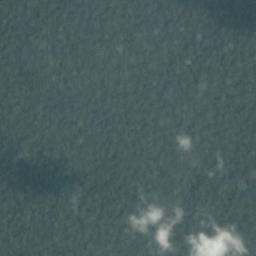

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


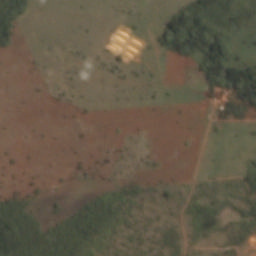

True label
agriculture clear habitation primary road
Predicted
['habitation road agriculture primary clear']


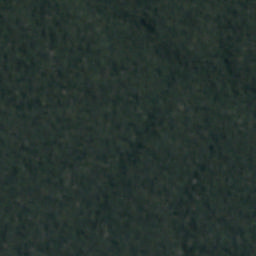

True label
clear primary
Predicted
['primary clear']


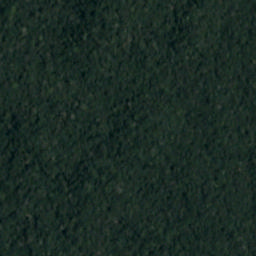

True label
clear primary
Predicted
['primary clear']


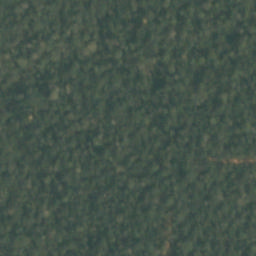

True label
clear primary
Predicted
['primary clear']


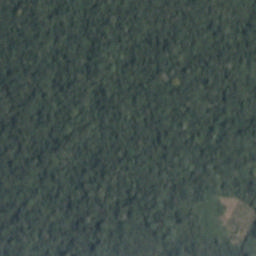

True label
agriculture clear cultivation primary
Predicted
['cultivation agriculture primary clear']


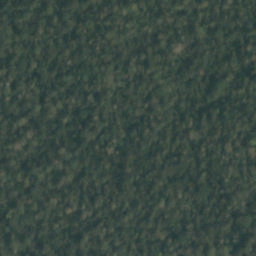

True label
clear primary
Predicted
['primary clear']


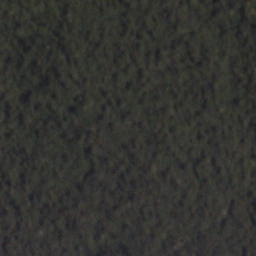

True label
clear primary
Predicted
['primary clear']


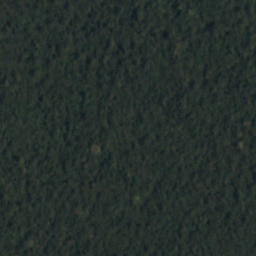

True label
clear primary
Predicted
['primary clear']


In [30]:
#Some correctly predicted examples
i = 0
while(i<300):
    idx = np.random.randint(40479)
    f,tags = df_train.values[idx,:]
    img = cv2.imread('train-jpg/{}.jpg'.format(f))
    targets = np.zeros(17)
    for t in tags.split(' '):
        targets[label_map[t]] = 1 
    x_train = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    x_train -= train_mean
    targets = np.array(targets,bool)
    y = model.predict(x_train[np.newaxis,:])
    y_pred = np.array(y > thresh_2_val,bool)
    if(y_pred==targets).all():
        ipython_img = Image(filename='train-jpg/{}.jpg'.format(f))
        display(ipython_img)
        labels_np = np.array(labels)
        preds = [' '.join(labels_np[np.array(y_pred[i,:],bool)]) for i in range(y_pred.shape[0])]
        print('True label')
        print(tags)
        print('Predicted')
        print(preds)
        i+=1

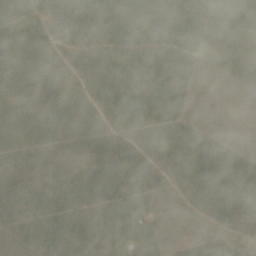

True label
agriculture haze primary road
Predicted
['road agriculture primary partly_cloudy haze']


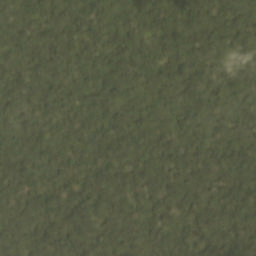

True label
partly_cloudy primary
Predicted
['primary partly_cloudy clear']


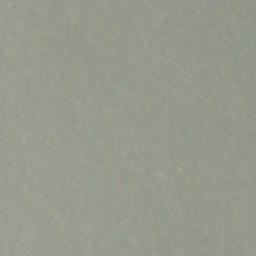

True label
haze primary
Predicted
['primary cloudy haze']


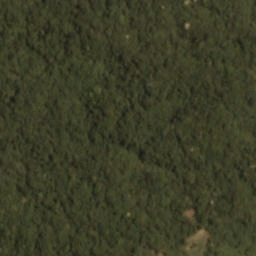

True label
clear primary
Predicted
['cultivation agriculture primary clear']


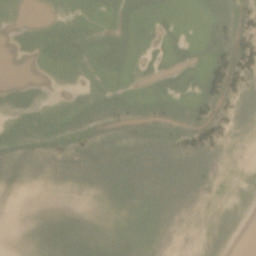

True label
agriculture clear cultivation primary road water
Predicted
['road agriculture water primary clear']


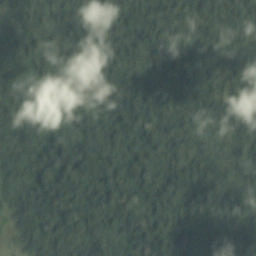

True label
partly_cloudy primary
Predicted
['agriculture primary partly_cloudy']


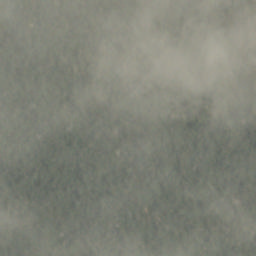

True label
partly_cloudy primary
Predicted
['primary partly_cloudy cloudy']


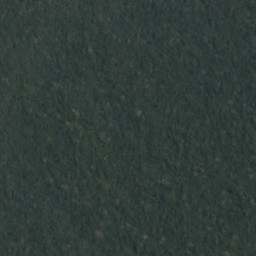

True label
clear primary blooming
Predicted
['primary clear']


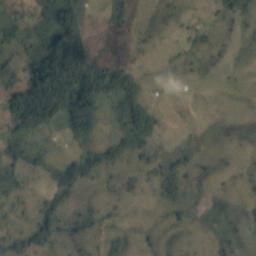

True label
agriculture clear cultivation primary road
Predicted
['cultivation habitation agriculture primary clear']


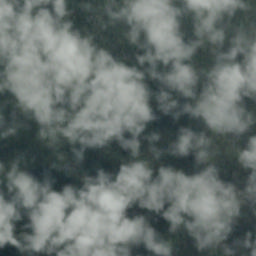

True label
cloudy
Predicted
['primary partly_cloudy cloudy']


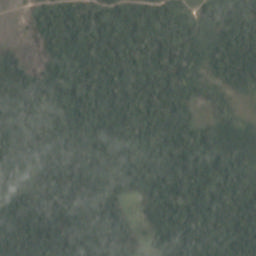

True label
agriculture cultivation partly_cloudy primary road
Predicted
['cultivation road agriculture primary partly_cloudy clear']


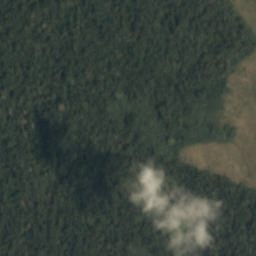

True label
agriculture partly_cloudy primary
Predicted
['cultivation agriculture primary partly_cloudy']


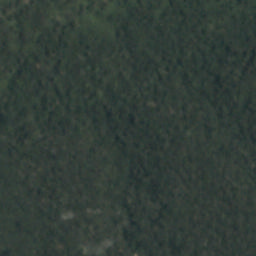

True label
clear primary
Predicted
['agriculture primary partly_cloudy clear']


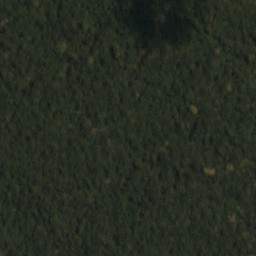

True label
clear primary
Predicted
['blooming primary clear']


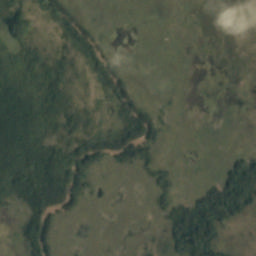

True label
agriculture clear primary road water
Predicted
['cultivation road agriculture water primary partly_cloudy clear']


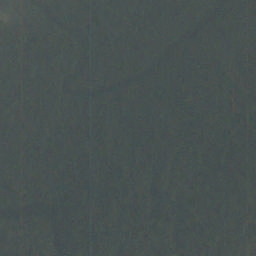

True label
haze primary road water
Predicted
['road water primary clear haze']


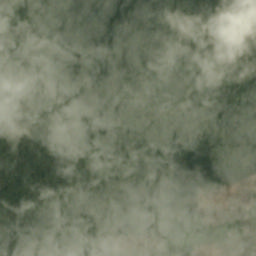

True label
agriculture partly_cloudy primary
Predicted
['agriculture primary partly_cloudy cloudy']


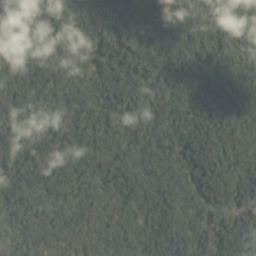

True label
partly_cloudy primary water
Predicted
['road water primary partly_cloudy']


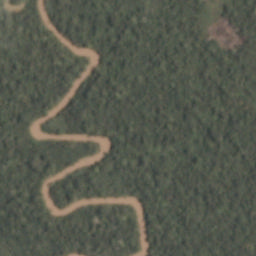

True label
agriculture clear primary road water
Predicted
['cultivation agriculture water primary clear']


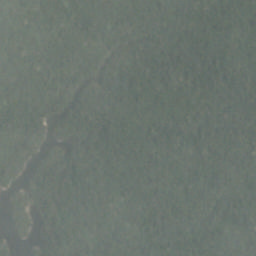

True label
haze primary water
Predicted
['water primary clear haze']


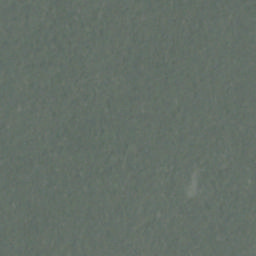

True label
clear primary
Predicted
['primary clear haze']


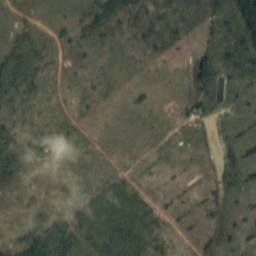

True label
agriculture habitation partly_cloudy primary road
Predicted
['cultivation habitation road agriculture primary partly_cloudy clear']


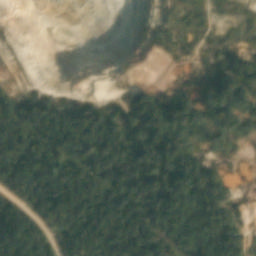

True label
agriculture clear primary road
Predicted
['artisinal_mine road water primary clear']


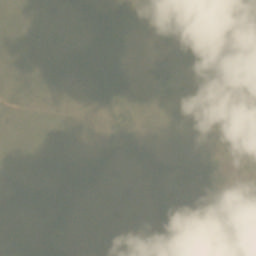

True label
agriculture partly_cloudy primary
Predicted
['cultivation road agriculture primary partly_cloudy']


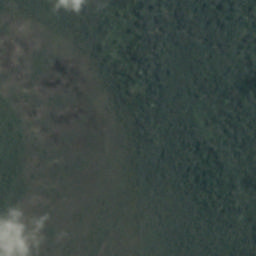

True label
agriculture cultivation partly_cloudy primary
Predicted
['agriculture primary partly_cloudy']


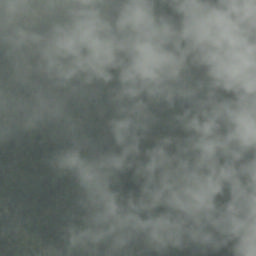

True label
partly_cloudy primary
Predicted
['primary partly_cloudy cloudy']


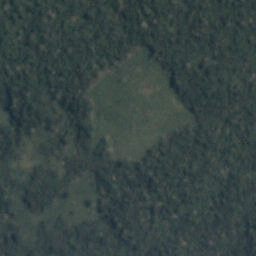

True label
agriculture clear primary
Predicted
['cultivation agriculture primary clear']


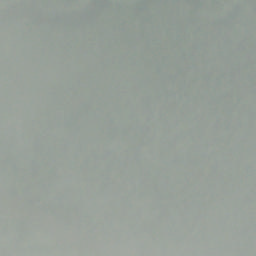

True label
cloudy
Predicted
['primary cloudy haze']


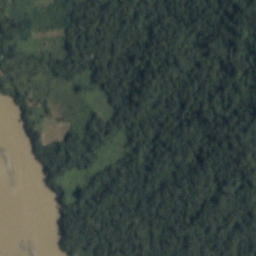

True label
agriculture clear primary water
Predicted
['cultivation agriculture water primary clear']


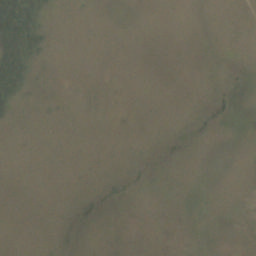

True label
agriculture clear primary water
Predicted
['bare_ground agriculture primary clear']


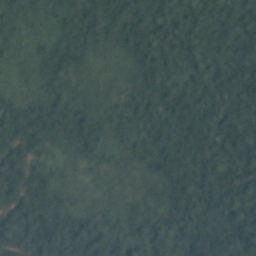

True label
agriculture clear cultivation primary
Predicted
['road agriculture water primary clear']


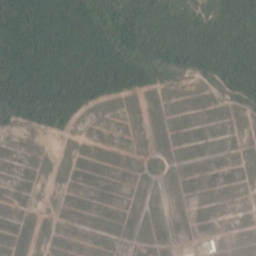

True label
clear habitation primary road
Predicted
['habitation road agriculture primary clear']


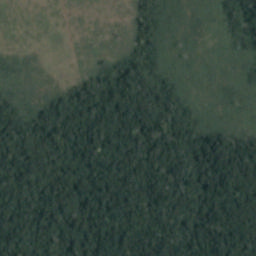

True label
agriculture clear primary
Predicted
['cultivation agriculture primary clear']


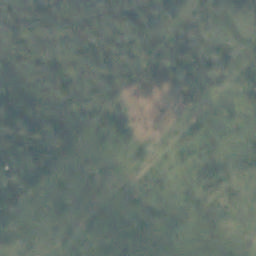

True label
agriculture clear primary road
Predicted
['cultivation road agriculture primary clear haze']


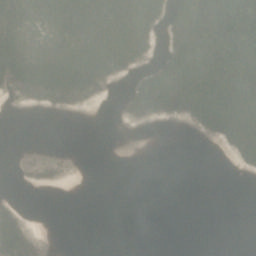

True label
agriculture clear primary water
Predicted
['water primary clear haze']


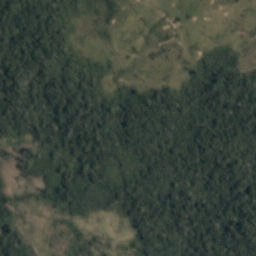

True label
agriculture clear primary
Predicted
['cultivation agriculture primary clear']


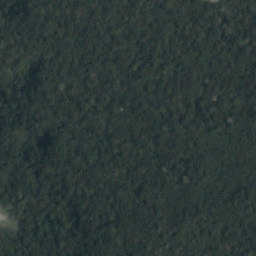

True label
clear primary
Predicted
['primary partly_cloudy']


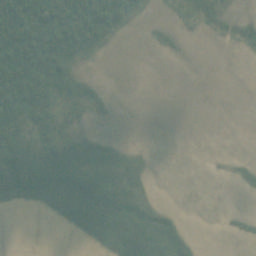

True label
agriculture clear primary
Predicted
['road agriculture primary clear']


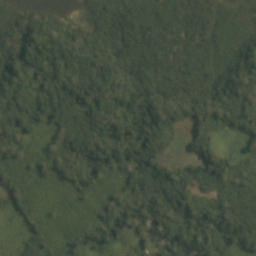

True label
agriculture bare_ground clear cultivation primary
Predicted
['bare_ground cultivation habitation agriculture water primary clear']


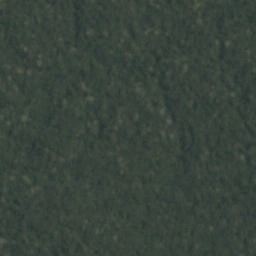

True label
blooming clear primary
Predicted
['primary clear']


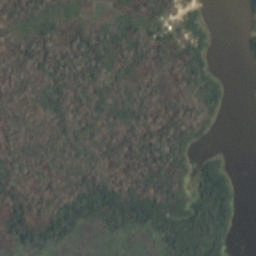

True label
agriculture clear habitation primary water
Predicted
['cultivation habitation agriculture water primary clear']


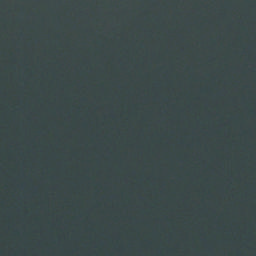

True label
clear primary
Predicted
['water primary clear']


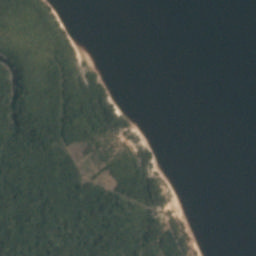

True label
agriculture clear primary road water
Predicted
['cultivation road agriculture water primary clear']


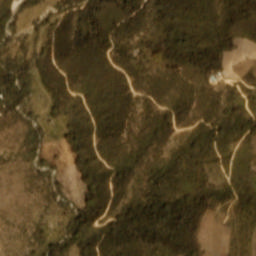

True label
bare_ground clear primary road
Predicted
['bare_ground habitation road agriculture primary clear']


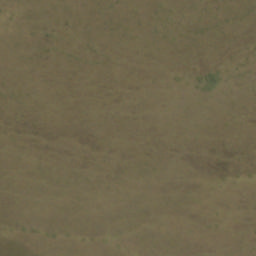

True label
bare_ground clear
Predicted
['bare_ground agriculture clear']


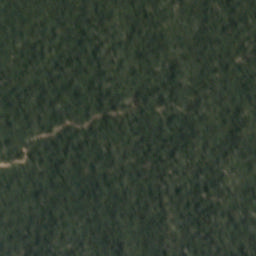

True label
clear primary road selective_logging
Predicted
['road water primary clear']


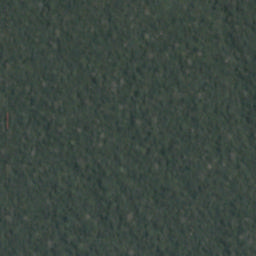

True label
blooming clear primary
Predicted
['primary clear']


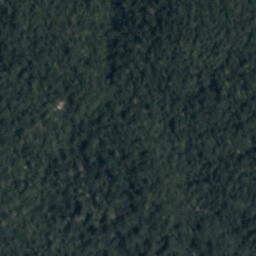

True label
clear habitation primary
Predicted
['primary clear']


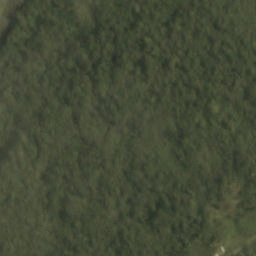

True label
clear primary
Predicted
['cultivation habitation agriculture water primary clear']


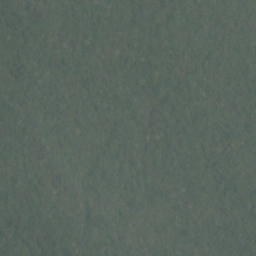

True label
haze primary
Predicted
['primary clear haze']


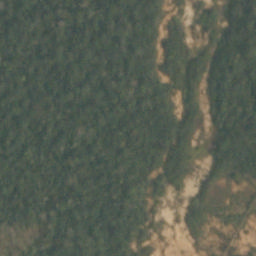

True label
artisinal_mine clear primary
Predicted
['artisinal_mine water primary clear']


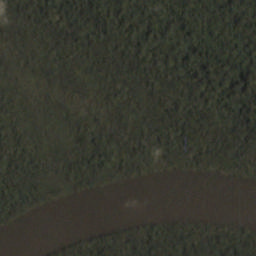

True label
clear primary water
Predicted
['water primary partly_cloudy clear']


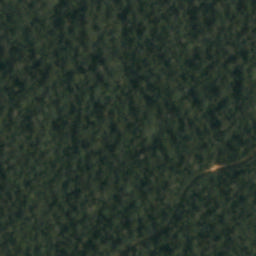

True label
clear primary road water
Predicted
['road primary clear']


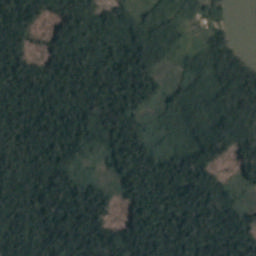

True label
agriculture clear cultivation primary
Predicted
['cultivation habitation agriculture water primary clear']


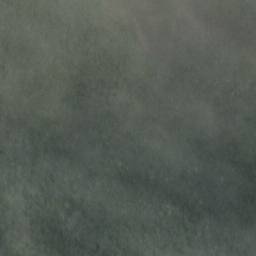

True label
partly_cloudy primary
Predicted
['primary partly_cloudy haze']


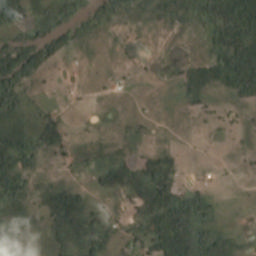

True label
agriculture cultivation partly_cloudy primary road
Predicted
['cultivation habitation road agriculture primary partly_cloudy']


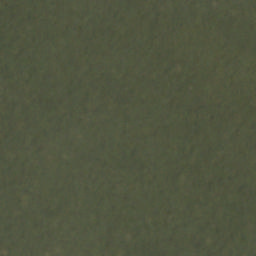

True label
haze primary
Predicted
['primary clear']


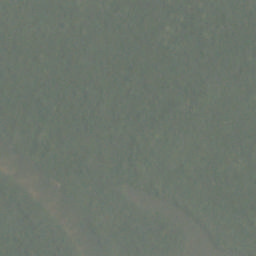

True label
agriculture clear cultivation primary water
Predicted
['water primary clear haze']


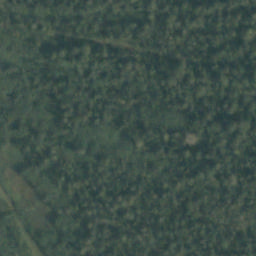

True label
agriculture clear cultivation primary
Predicted
['road agriculture primary clear']


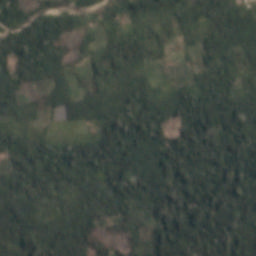

True label
agriculture clear primary water
Predicted
['cultivation habitation road agriculture primary clear']


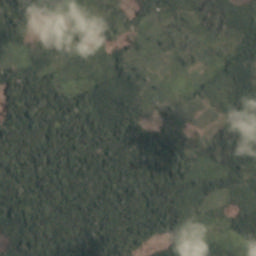

True label
agriculture cultivation partly_cloudy primary
Predicted
['slash_burn cultivation agriculture primary partly_cloudy']


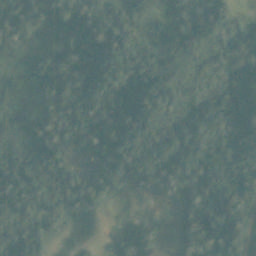

True label
agriculture clear cultivation primary
Predicted
['cultivation agriculture primary clear haze']


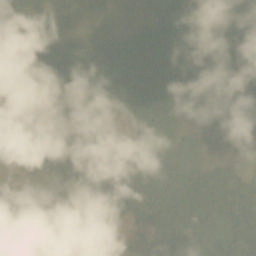

True label
cloudy
Predicted
['cultivation agriculture primary partly_cloudy cloudy']


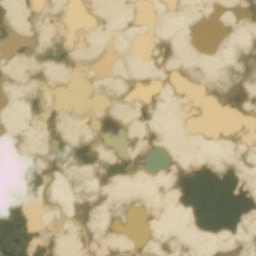

True label
artisinal_mine partly_cloudy primary water
Predicted
['artisinal_mine water primary clear']


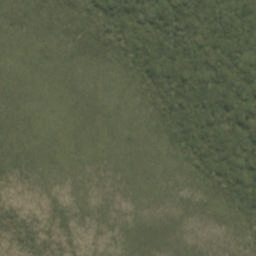

True label
agriculture clear primary
Predicted
['blow_down agriculture primary clear']


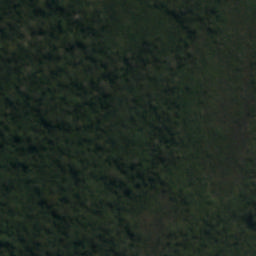

True label
clear primary
Predicted
['cultivation primary clear']


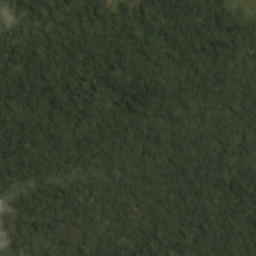

True label
clear primary
Predicted
['cultivation agriculture primary partly_cloudy']


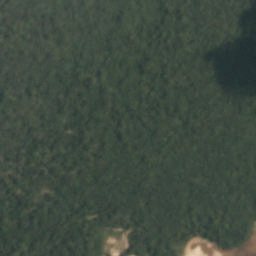

True label
agriculture clear primary selective_logging
Predicted
['cultivation agriculture water primary clear']


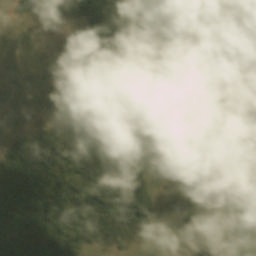

True label
cloudy
Predicted
['cultivation agriculture primary partly_cloudy']


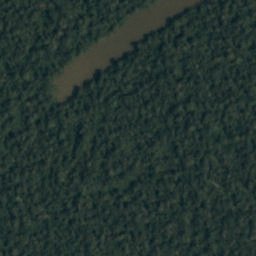

True label
agriculture clear primary water
Predicted
['water primary clear']


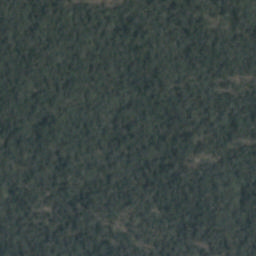

True label
clear primary
Predicted
['cultivation agriculture primary clear']


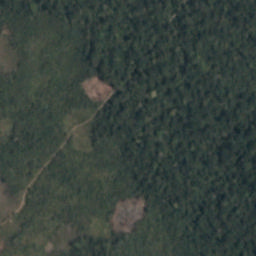

True label
agriculture clear cultivation primary road
Predicted
['slash_burn cultivation road agriculture primary clear']


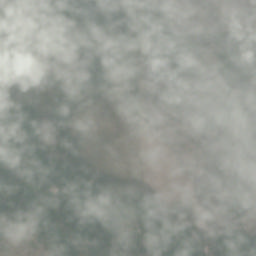

True label
cloudy
Predicted
['agriculture primary partly_cloudy cloudy']


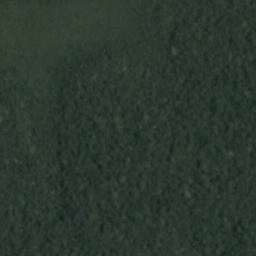

True label
agriculture clear primary
Predicted
['primary clear']


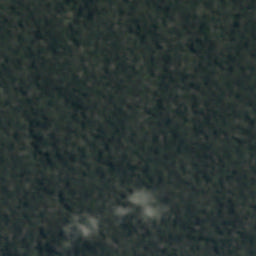

True label
clear primary
Predicted
['primary partly_cloudy']


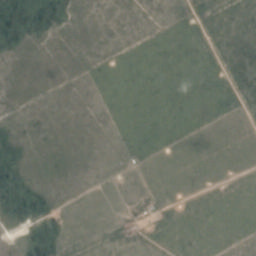

True label
agriculture clear primary road
Predicted
['cultivation road agriculture primary clear']


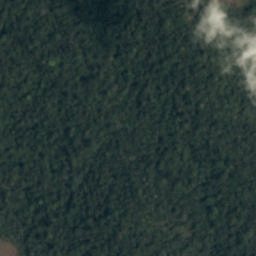

True label
partly_cloudy primary water
Predicted
['agriculture water primary partly_cloudy']


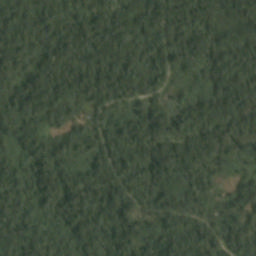

True label
agriculture clear cultivation primary road
Predicted
['cultivation road agriculture water primary clear']


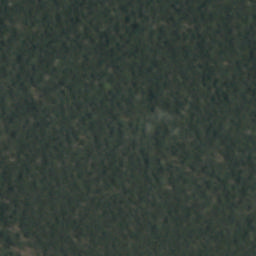

True label
clear primary
Predicted
['blooming agriculture primary clear']


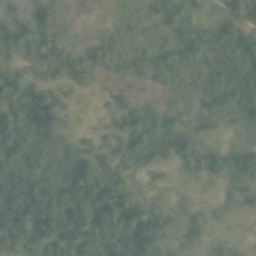

True label
agriculture clear primary
Predicted
['cultivation road agriculture primary clear haze']


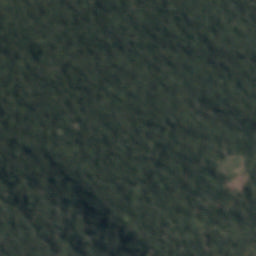

True label
clear cultivation primary
Predicted
['cultivation agriculture primary clear']


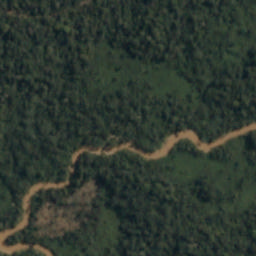

True label
agriculture clear cultivation primary water
Predicted
['cultivation road agriculture water primary clear']


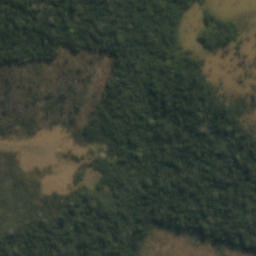

True label
clear cultivation primary
Predicted
['cultivation agriculture primary clear']


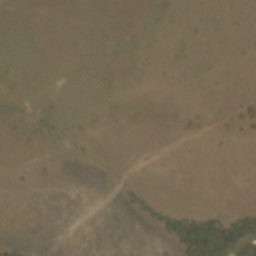

True label
bare_ground clear primary road
Predicted
['bare_ground road agriculture primary clear']


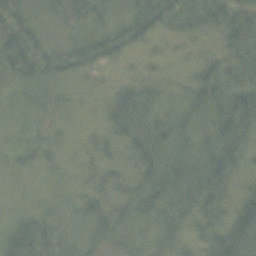

True label
agriculture haze primary
Predicted
['cultivation agriculture primary clear haze']


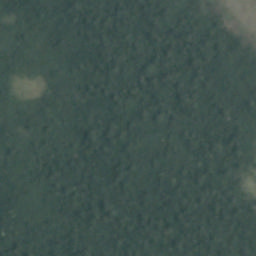

True label
agriculture clear primary
Predicted
['cultivation agriculture primary clear']


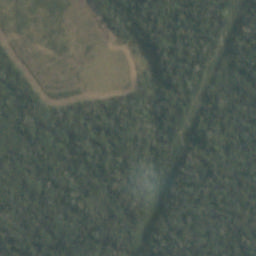

True label
agriculture partly_cloudy primary
Predicted
['cultivation road agriculture primary clear']


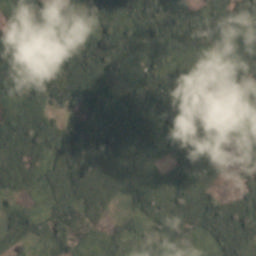

True label
agriculture partly_cloudy primary
Predicted
['slash_burn cultivation agriculture primary partly_cloudy']


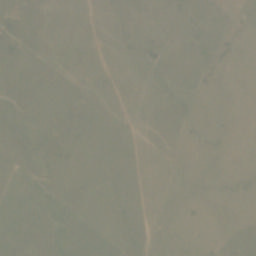

True label
haze primary road
Predicted
['road agriculture primary haze']


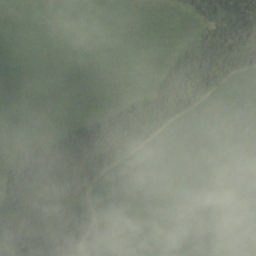

True label
agriculture partly_cloudy primary road water
Predicted
['road agriculture water primary partly_cloudy haze']


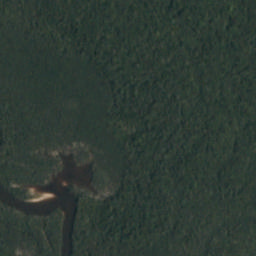

True label
clear primary water
Predicted
['cultivation agriculture water primary clear']


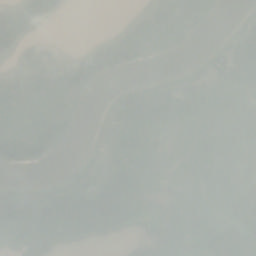

True label
agriculture haze primary road
Predicted
['agriculture water primary haze']


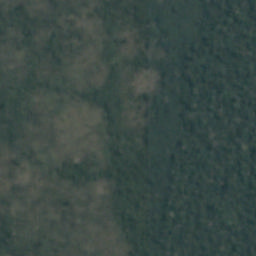

True label
agriculture clear primary
Predicted
['cultivation agriculture primary clear']


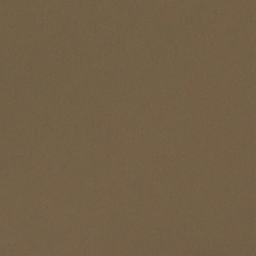

True label
clear water
Predicted
['agriculture water primary clear']


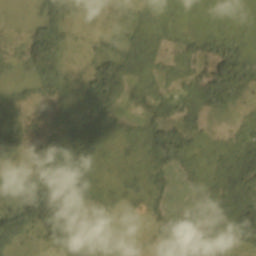

True label
agriculture partly_cloudy primary
Predicted
['cultivation agriculture primary partly_cloudy']


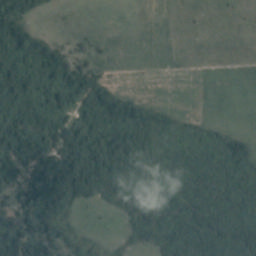

True label
agriculture cultivation partly_cloudy primary road
Predicted
['cultivation road agriculture primary partly_cloudy clear']


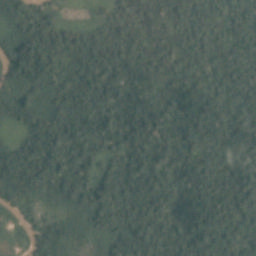

True label
clear cultivation primary road
Predicted
['cultivation road agriculture water primary clear']


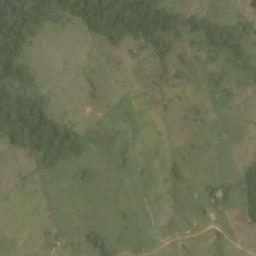

True label
agriculture clear primary road
Predicted
['cultivation habitation road agriculture primary clear']


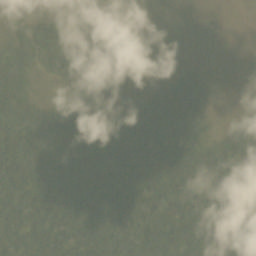

True label
agriculture cultivation partly_cloudy primary
Predicted
['agriculture primary partly_cloudy']


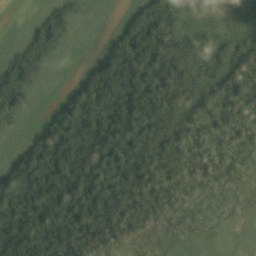

True label
agriculture clear primary road
Predicted
['road agriculture water primary partly_cloudy clear']


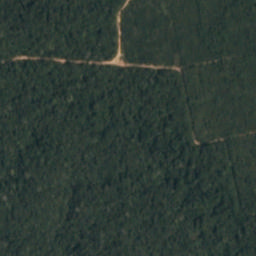

True label
clear primary road
Predicted
['road water primary clear']


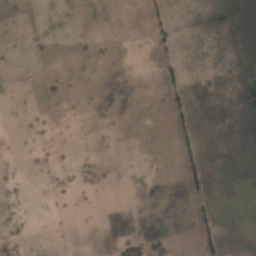

True label
agriculture clear primary
Predicted
['road agriculture water primary clear']


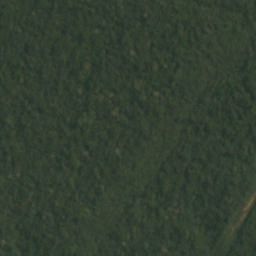

True label
clear primary
Predicted
['road primary clear']


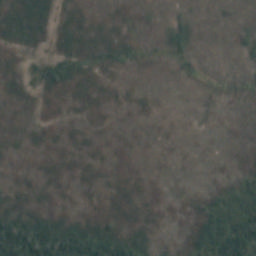

True label
agriculture clear primary
Predicted
['agriculture water primary clear']


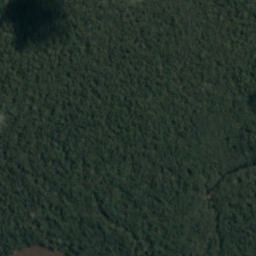

True label
clear primary
Predicted
['road water primary partly_cloudy clear']


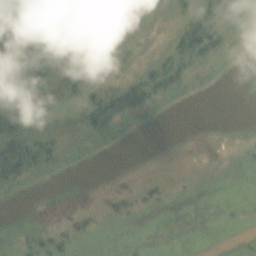

True label
agriculture partly_cloudy primary water
Predicted
['road agriculture water primary partly_cloudy']


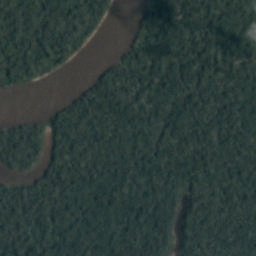

True label
clear primary water
Predicted
['water primary partly_cloudy clear']


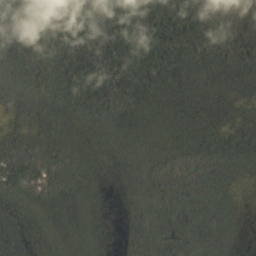

True label
habitation partly_cloudy primary
Predicted
['cultivation habitation agriculture primary partly_cloudy']


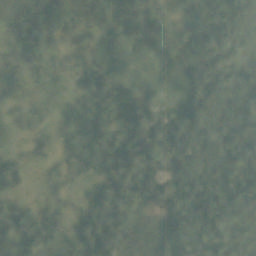

True label
agriculture clear cultivation primary
Predicted
['cultivation agriculture primary clear haze']


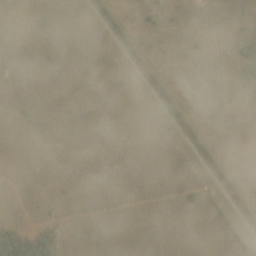

True label
agriculture partly_cloudy primary road
Predicted
['road agriculture primary clear haze']


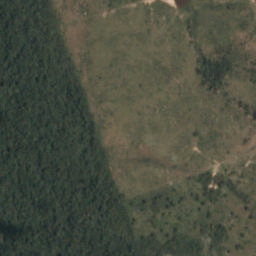

True label
agriculture clear cultivation primary
Predicted
['road agriculture primary clear']


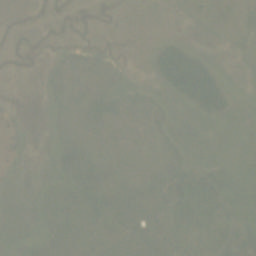

True label
haze primary road
Predicted
['road agriculture water primary haze']


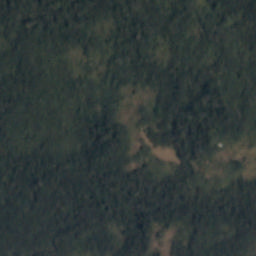

True label
clear cultivation habitation primary
Predicted
['cultivation habitation agriculture primary clear']


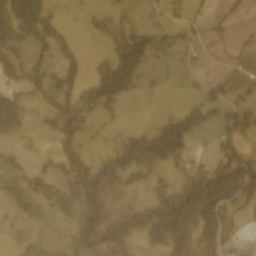

True label
agriculture clear primary road
Predicted
['bare_ground habitation road agriculture primary clear']


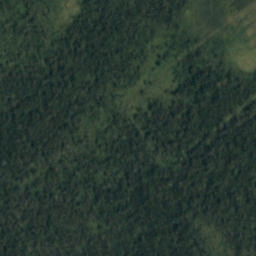

True label
agriculture blow_down clear primary
Predicted
['cultivation agriculture primary clear']


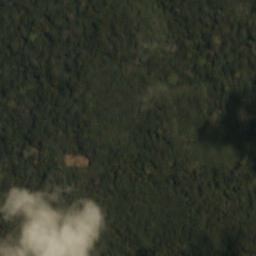

True label
cultivation partly_cloudy primary
Predicted
['cultivation agriculture primary partly_cloudy']


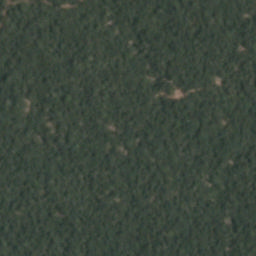

True label
clear primary selective_logging
Predicted
['selective_logging road primary clear']


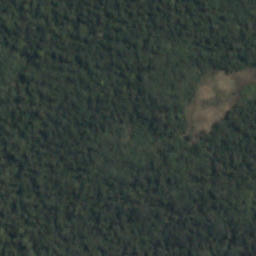

True label
clear cultivation primary
Predicted
['cultivation agriculture primary clear']


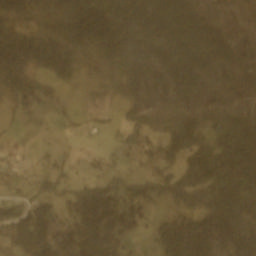

True label
agriculture clear cultivation primary road
Predicted
['bare_ground habitation road agriculture primary clear']


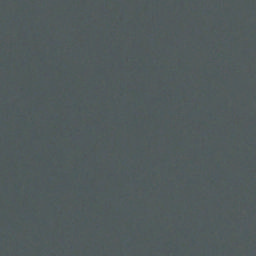

True label
haze primary water
Predicted
['water clear']


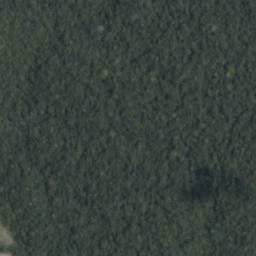

True label
clear primary
Predicted
['primary partly_cloudy clear']


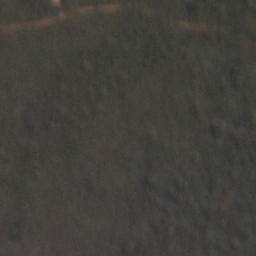

True label
clear primary road
Predicted
['road agriculture water primary clear']


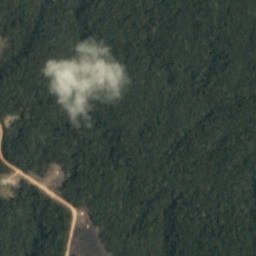

True label
habitation partly_cloudy primary road
Predicted
['cultivation habitation road agriculture primary partly_cloudy']


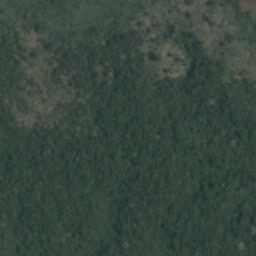

True label
clear primary
Predicted
['blow_down cultivation agriculture primary clear']


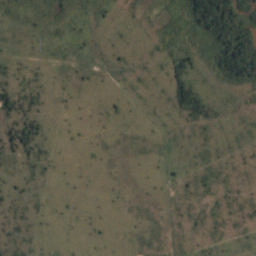

True label
agriculture clear cultivation primary
Predicted
['road agriculture primary clear']


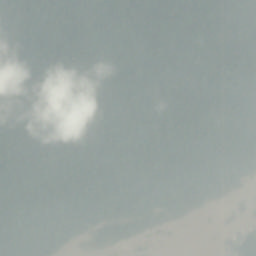

True label
partly_cloudy primary water
Predicted
['agriculture water primary partly_cloudy haze']


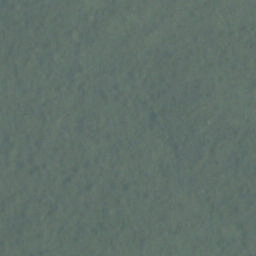

True label
haze primary
Predicted
['primary clear haze']


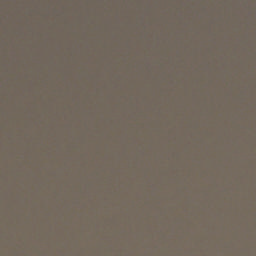

True label
clear water
Predicted
['water cloudy clear']


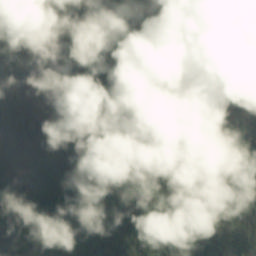

True label
cloudy
Predicted
['primary partly_cloudy cloudy']


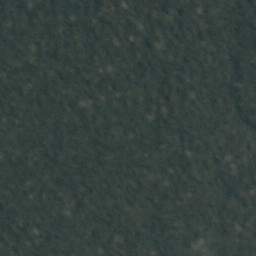

True label
clear primary
Predicted
['blooming primary clear']


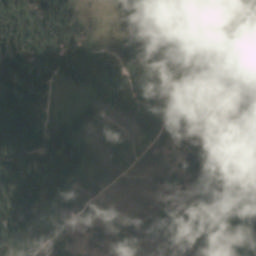

True label
agriculture partly_cloudy primary road water
Predicted
['road agriculture primary partly_cloudy']


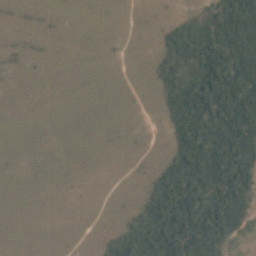

True label
agriculture clear primary road water
Predicted
['road agriculture primary clear']


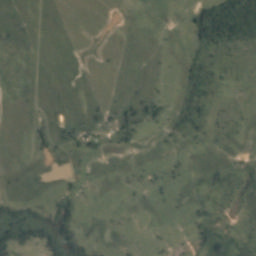

True label
agriculture clear habitation primary road water
Predicted
['habitation road agriculture primary clear']


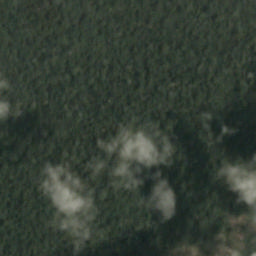

True label
partly_cloudy primary water
Predicted
['primary partly_cloudy']


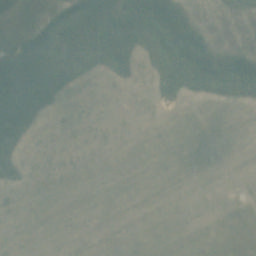

True label
agriculture haze primary
Predicted
['road agriculture primary clear haze']


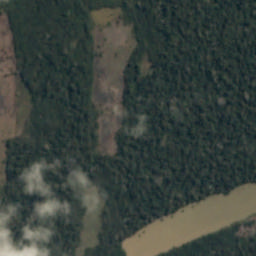

True label
agriculture partly_cloudy primary water
Predicted
['cultivation agriculture water primary partly_cloudy']


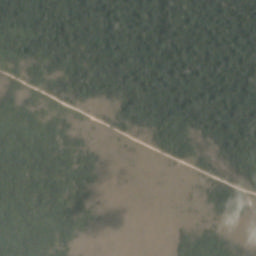

True label
agriculture partly_cloudy primary road
Predicted
['cultivation road agriculture primary partly_cloudy clear']


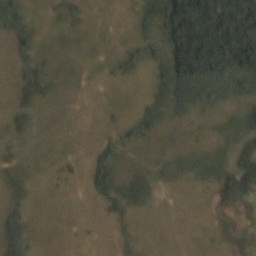

True label
agriculture clear primary road water
Predicted
['road agriculture primary clear']


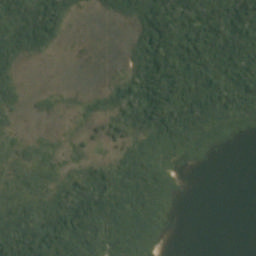

True label
bare_ground clear habitation primary water
Predicted
['bare_ground cultivation agriculture water primary clear']


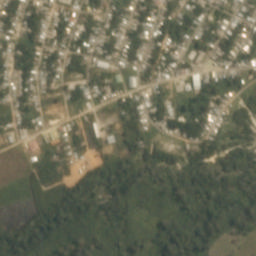

True label
clear habitation primary road
Predicted
['habitation road agriculture primary clear']


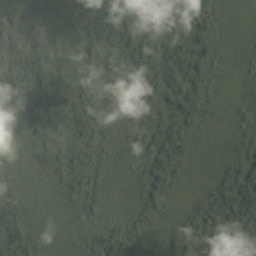

True label
partly_cloudy primary
Predicted
['cultivation agriculture water primary partly_cloudy']


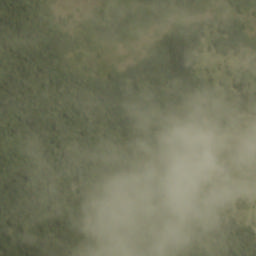

True label
bare_ground partly_cloudy primary
Predicted
['agriculture primary partly_cloudy']


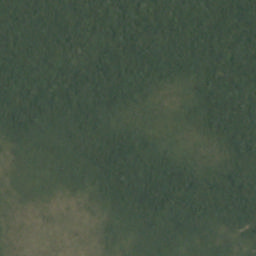

True label
clear primary
Predicted
['agriculture primary clear']


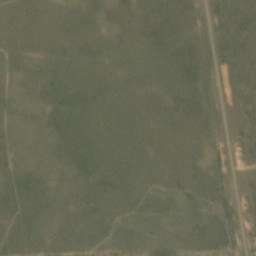

True label
agriculture clear road
Predicted
['road agriculture primary clear']


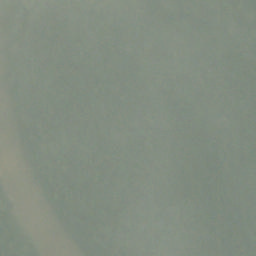

True label
haze primary road water
Predicted
['water primary haze']


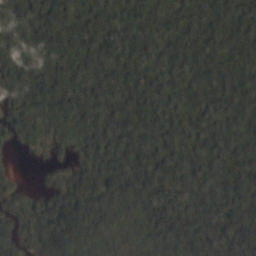

True label
clear primary water
Predicted
['water primary partly_cloudy clear']


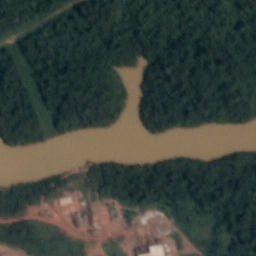

True label
clear habitation primary road water
Predicted
['cultivation habitation road agriculture water primary clear']


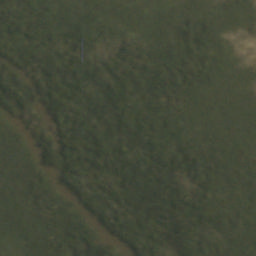

True label
agriculture clear primary water
Predicted
['cultivation road agriculture water primary clear']


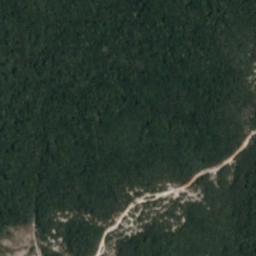

True label
clear primary road water
Predicted
['habitation road agriculture water primary clear']


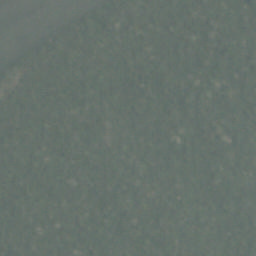

True label
clear primary
Predicted
['primary clear haze']


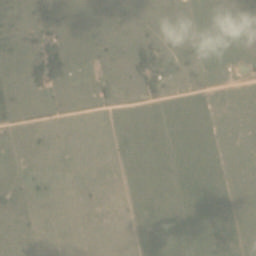

True label
agriculture habitation partly_cloudy primary road water
Predicted
['habitation road agriculture primary partly_cloudy clear']


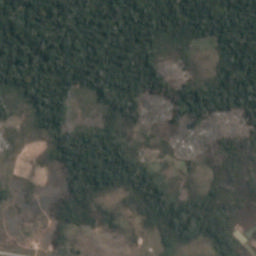

True label
agriculture clear cultivation habitation primary
Predicted
['cultivation habitation road agriculture primary clear']


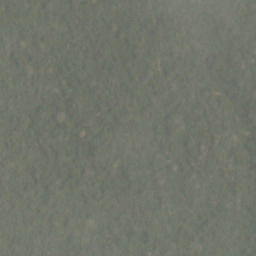

True label
clear primary
Predicted
['primary clear haze']


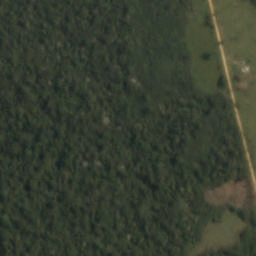

True label
agriculture clear cultivation primary road
Predicted
['cultivation habitation road agriculture primary clear']


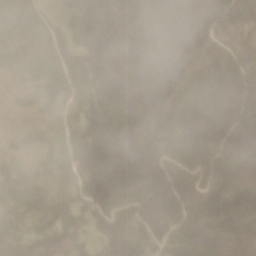

True label
haze primary road
Predicted
['road agriculture water primary clear haze']


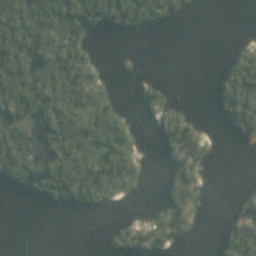

True label
clear primary water
Predicted
['habitation water primary clear']


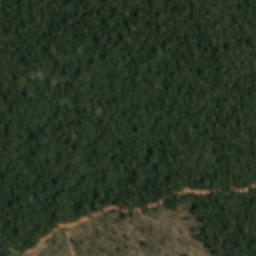

True label
agriculture clear cultivation primary road water
Predicted
['cultivation road agriculture primary clear']


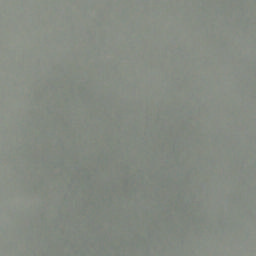

True label
haze primary
Predicted
['primary cloudy haze']


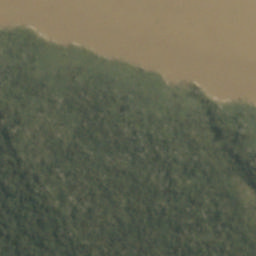

True label
agriculture clear primary water
Predicted
['water primary clear']


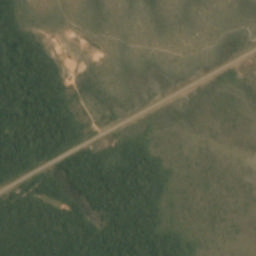

True label
agriculture clear primary road
Predicted
['habitation road agriculture primary clear']


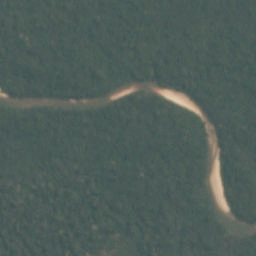

True label
clear primary water
Predicted
['road water primary clear']


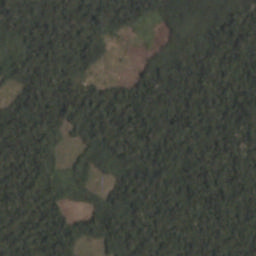

True label
clear cultivation primary
Predicted
['cultivation agriculture primary clear']


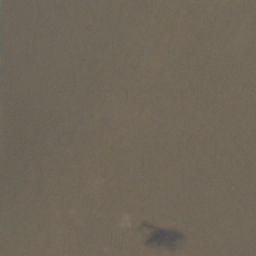

True label
cloudy
Predicted
['water primary cloudy clear']


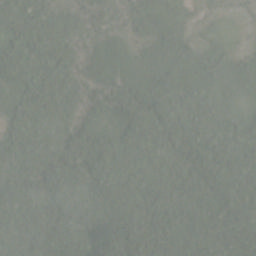

True label
agriculture clear cultivation primary
Predicted
['cultivation agriculture water primary haze']


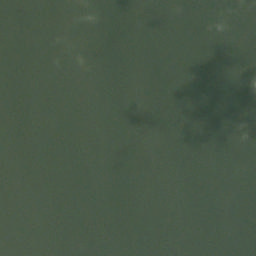

True label
haze primary water
Predicted
['water primary clear haze']


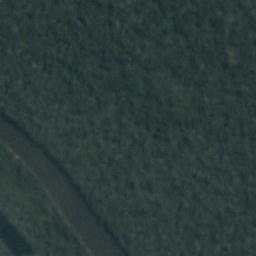

True label
clear primary road water
Predicted
['water primary clear']


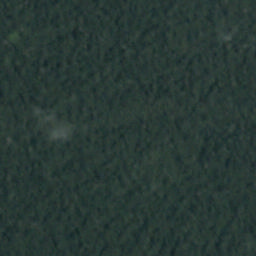

True label
partly_cloudy primary
Predicted
['primary partly_cloudy clear']


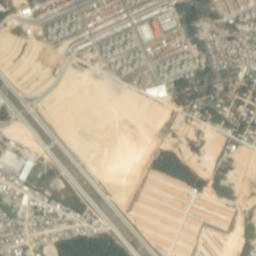

True label
agriculture bare_ground clear habitation primary road
Predicted
['habitation road agriculture primary clear']


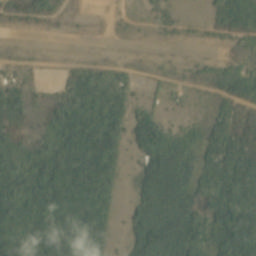

True label
agriculture clear primary road
Predicted
['habitation road agriculture primary partly_cloudy']


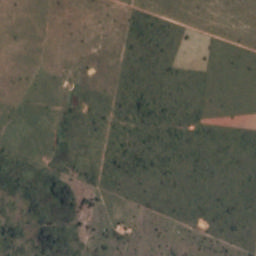

True label
agriculture clear cultivation habitation primary road
Predicted
['habitation road agriculture primary clear']


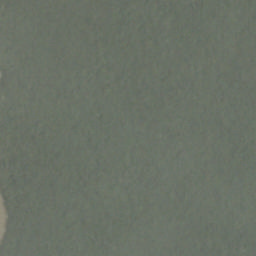

True label
haze primary
Predicted
['agriculture water primary clear haze']


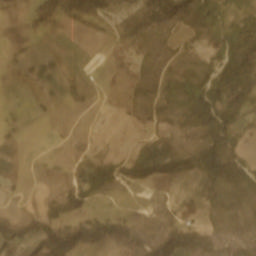

True label
bare_ground clear road
Predicted
['bare_ground road agriculture primary clear']


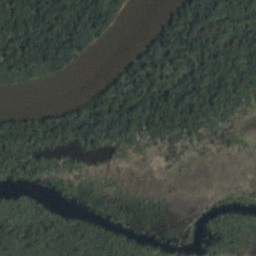

True label
agriculture clear primary water
Predicted
['cultivation agriculture water primary clear']


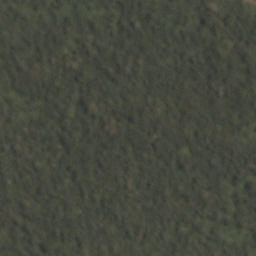

True label
clear primary
Predicted
['water primary clear']


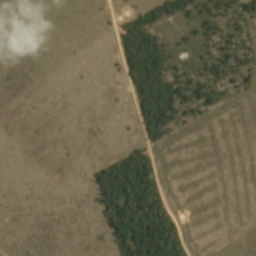

True label
agriculture clear habitation primary road
Predicted
['habitation road agriculture primary partly_cloudy clear']


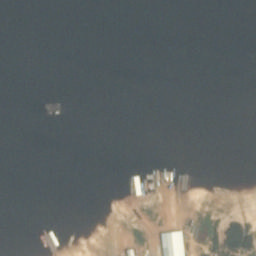

True label
clear habitation primary water
Predicted
['habitation road water primary clear']


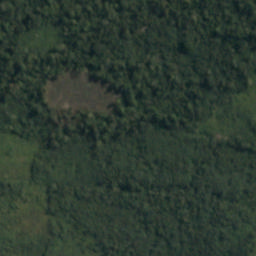

True label
clear cultivation primary
Predicted
['slash_burn cultivation agriculture primary clear']


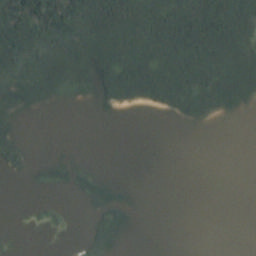

True label
haze primary water
Predicted
['water primary clear']


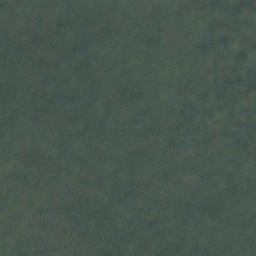

True label
haze primary
Predicted
['primary clear']


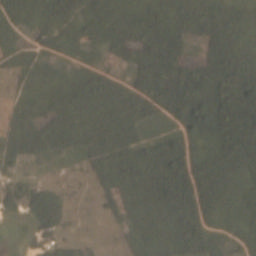

True label
agriculture clear cultivation habitation primary road water
Predicted
['cultivation habitation road agriculture primary clear']


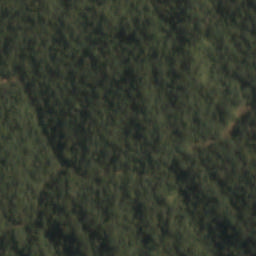

True label
clear primary water
Predicted
['road water primary clear']


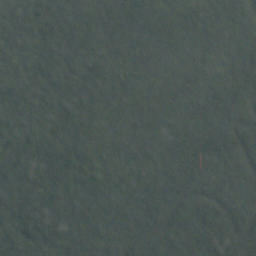

True label
clear primary
Predicted
['road water primary clear haze']


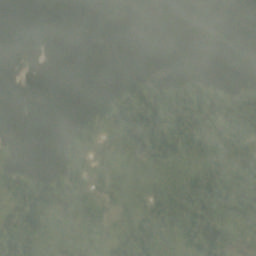

True label
haze primary selective_logging
Predicted
['cultivation habitation agriculture primary haze']


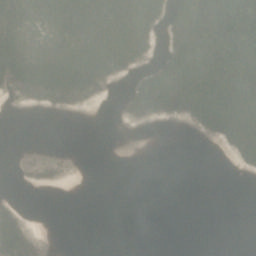

True label
agriculture clear primary water
Predicted
['water primary clear haze']


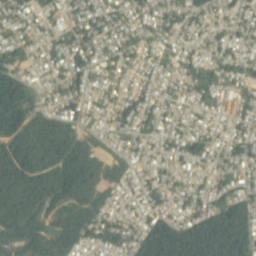

True label
clear habitation primary road
Predicted
['habitation road water primary clear']


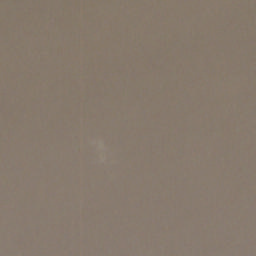

True label
agriculture cultivation haze primary road
Predicted
['water cloudy clear']


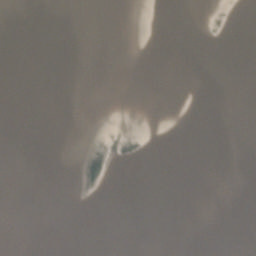

True label
clear primary water
Predicted
['agriculture water primary clear']


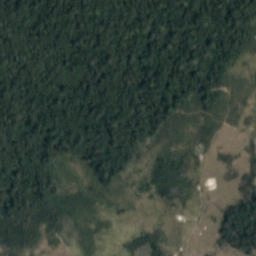

True label
agriculture clear primary
Predicted
['cultivation habitation road agriculture primary clear']


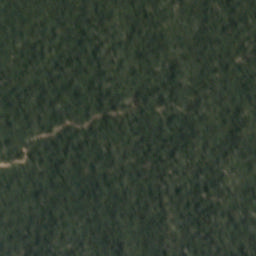

True label
clear primary road selective_logging
Predicted
['road water primary clear']


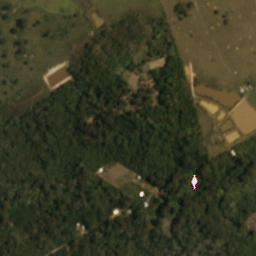

True label
agriculture clear habitation primary
Predicted
['cultivation habitation road agriculture primary clear']


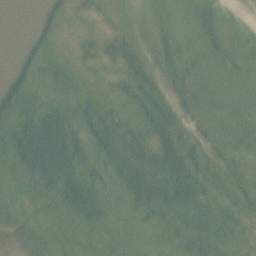

True label
agriculture clear primary water
Predicted
['road agriculture water primary clear']


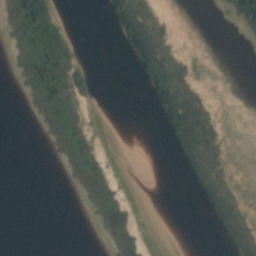

True label
clear primary water
Predicted
['agriculture water primary clear']


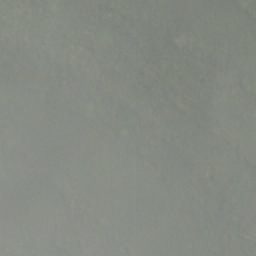

True label
cloudy
Predicted
['primary cloudy haze']


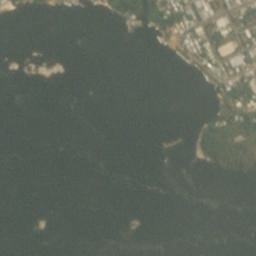

True label
clear habitation primary road water
Predicted
['habitation road agriculture water primary clear haze']


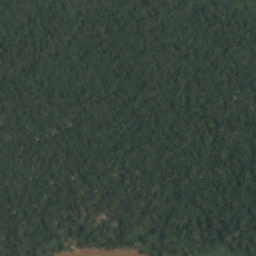

True label
clear primary water
Predicted
['cultivation agriculture water primary clear']


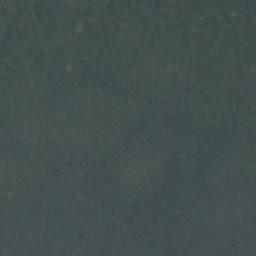

True label
haze primary
Predicted
['primary clear haze']


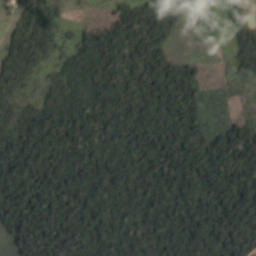

True label
agriculture partly_cloudy primary
Predicted
['cultivation road agriculture primary partly_cloudy']


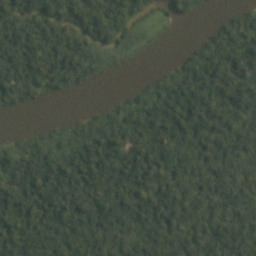

True label
clear primary road water
Predicted
['water primary clear']


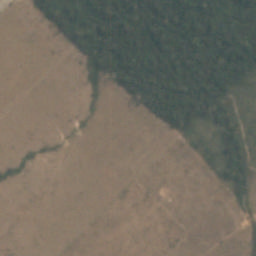

True label
agriculture clear primary
Predicted
['road agriculture primary clear']


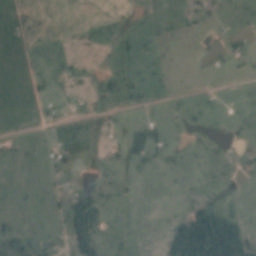

True label
agriculture clear cultivation primary road water
Predicted
['habitation road agriculture primary clear']


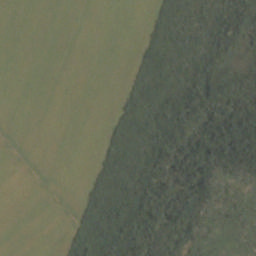

True label
agriculture clear primary water
Predicted
['agriculture primary clear']


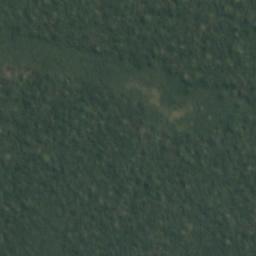

True label
haze primary
Predicted
['cultivation agriculture primary clear']


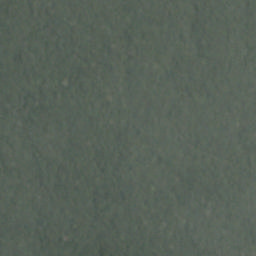

True label
clear primary
Predicted
['primary clear haze']


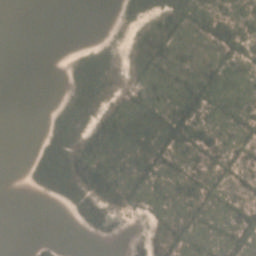

True label
agriculture clear primary water
Predicted
['road agriculture water primary clear haze']


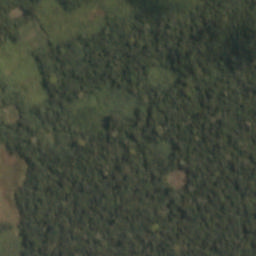

True label
agriculture clear cultivation primary slash_burn
Predicted
['cultivation agriculture primary clear']


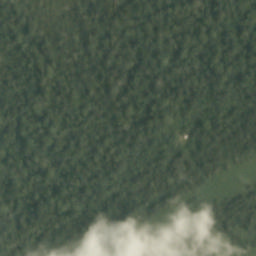

True label
habitation partly_cloudy primary
Predicted
['cultivation habitation agriculture primary partly_cloudy']


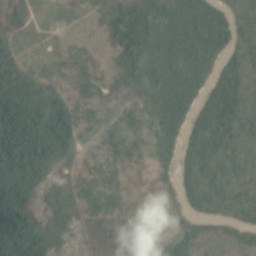

True label
agriculture clear habitation primary road water
Predicted
['cultivation habitation road agriculture water primary partly_cloudy']


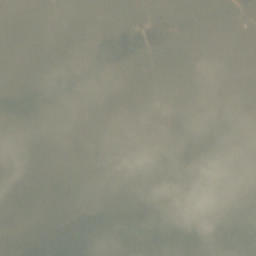

True label
haze primary
Predicted
['road agriculture primary cloudy haze']


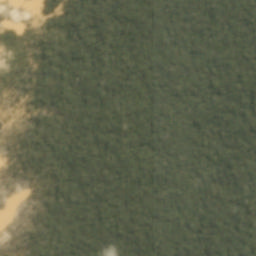

True label
artisinal_mine clear primary water
Predicted
['artisinal_mine water primary partly_cloudy clear']


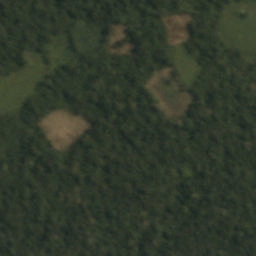

True label
clear cultivation primary
Predicted
['cultivation agriculture primary clear']


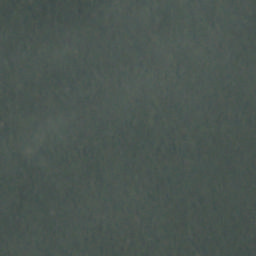

True label
haze primary
Predicted
['primary clear haze']


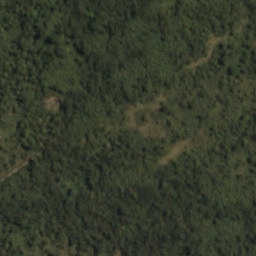

True label
clear primary road water
Predicted
['cultivation road agriculture primary clear']


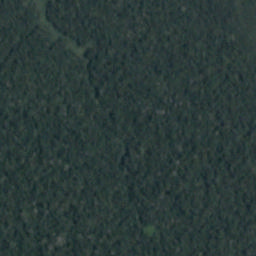

True label
clear primary road water
Predicted
['water primary clear']


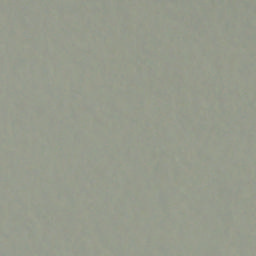

True label
cloudy
Predicted
['primary cloudy haze']


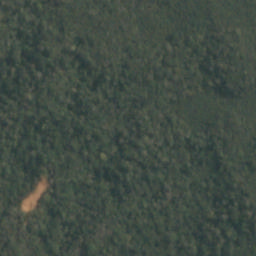

True label
agriculture clear primary
Predicted
['primary clear']


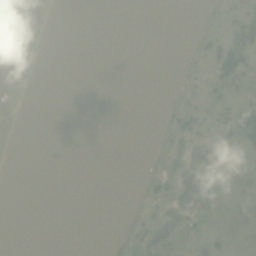

True label
agriculture habitation partly_cloudy primary water
Predicted
['agriculture water primary partly_cloudy']


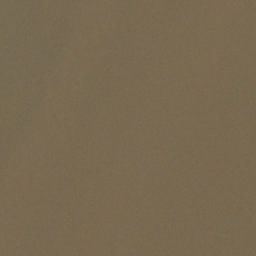

True label
agriculture clear primary water
Predicted
['water primary clear']


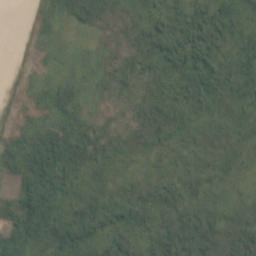

True label
clear cultivation primary water
Predicted
['cultivation agriculture water primary clear']


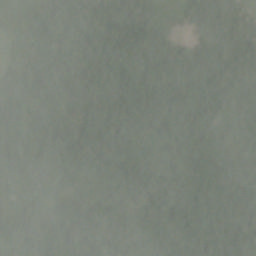

True label
agriculture haze primary
Predicted
['cultivation agriculture primary haze']


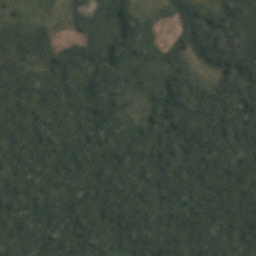

True label
agriculture clear primary
Predicted
['cultivation agriculture primary clear']


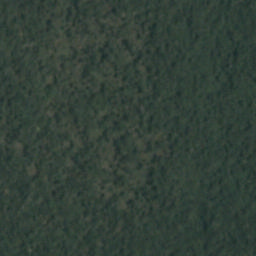

True label
agriculture clear primary
Predicted
['blow_down primary clear']


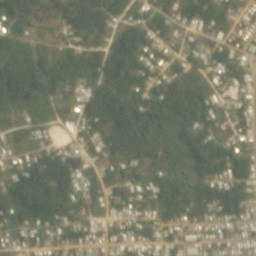

True label
clear habitation primary road
Predicted
['habitation road agriculture primary clear']


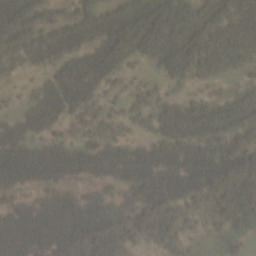

True label
agriculture clear habitation primary road
Predicted
['bare_ground agriculture primary clear haze']


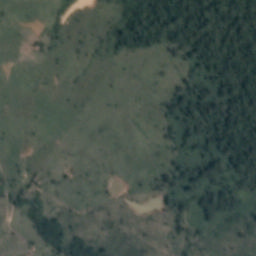

True label
agriculture clear cultivation primary
Predicted
['cultivation road agriculture primary clear']


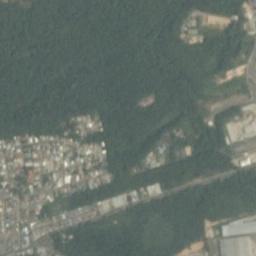

True label
clear habitation primary road
Predicted
['habitation road agriculture primary clear']


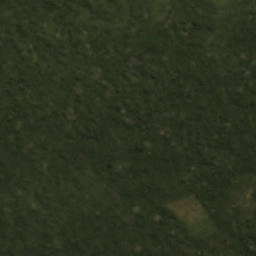

True label
agriculture blooming clear primary
Predicted
['blooming cultivation agriculture primary clear']


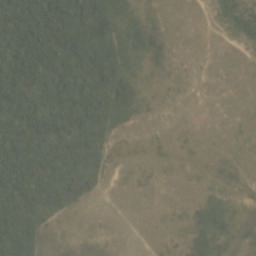

True label
agriculture clear primary road water
Predicted
['road agriculture primary clear']


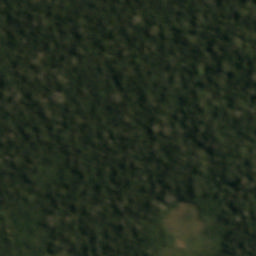

True label
agriculture blooming clear cultivation primary slash_burn
Predicted
['blooming cultivation agriculture primary clear']


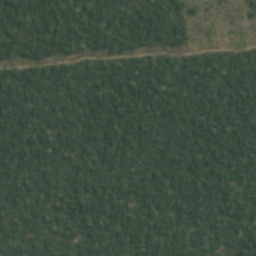

True label
agriculture clear primary road
Predicted
['cultivation road agriculture primary clear']


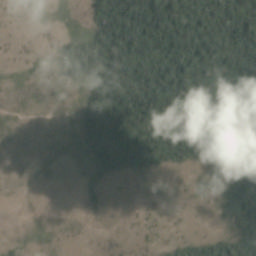

True label
agriculture partly_cloudy primary road
Predicted
['cultivation road agriculture primary partly_cloudy']


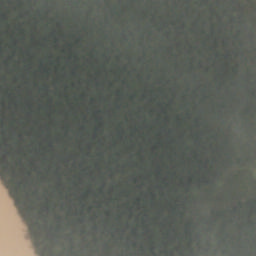

True label
clear primary water
Predicted
['water primary clear haze']


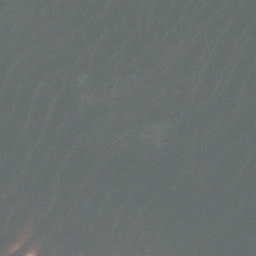

True label
haze primary water
Predicted
['road agriculture water primary clear haze']


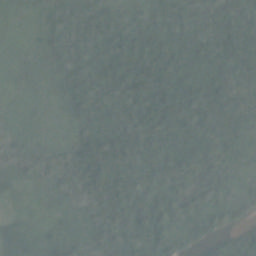

True label
haze primary water
Predicted
['road agriculture water primary clear haze']


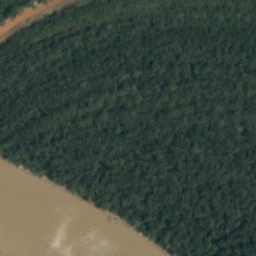

True label
clear primary water
Predicted
['water primary partly_cloudy clear']


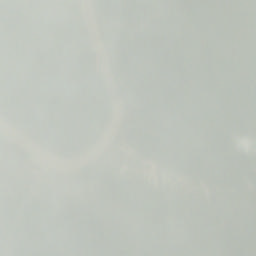

True label
cloudy
Predicted
['water primary cloudy haze']


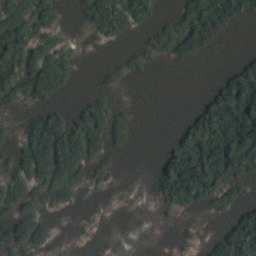

True label
clear primary water
Predicted
['agriculture water primary clear']


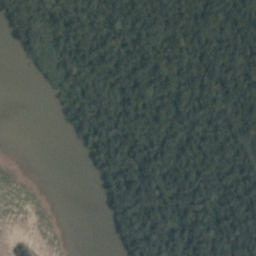

True label
clear primary water
Predicted
['agriculture water primary clear']


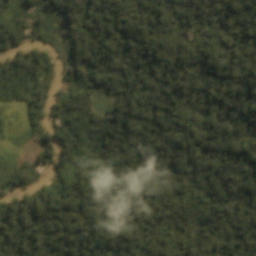

True label
cultivation partly_cloudy primary water
Predicted
['cultivation agriculture water primary partly_cloudy']


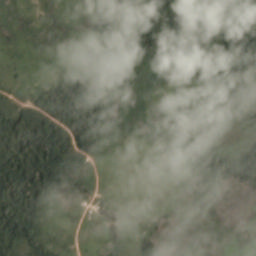

True label
partly_cloudy primary road water
Predicted
['road agriculture water primary partly_cloudy']


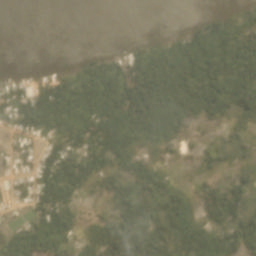

True label
habitation haze primary water
Predicted
['habitation road agriculture water primary clear haze']


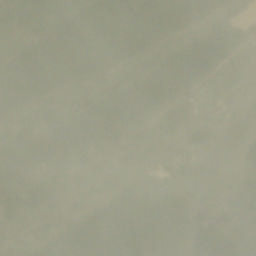

True label
agriculture cultivation haze primary
Predicted
['agriculture primary cloudy haze']


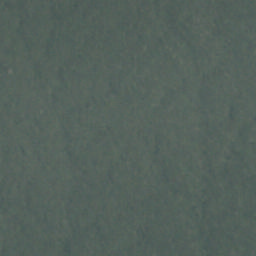

True label
haze primary
Predicted
['primary clear haze']


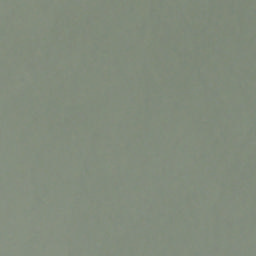

True label
clear primary
Predicted
['primary cloudy haze']


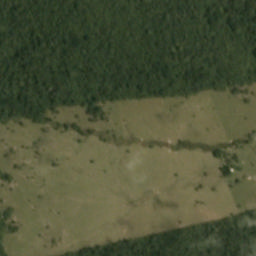

True label
agriculture clear habitation primary
Predicted
['cultivation habitation agriculture primary clear']


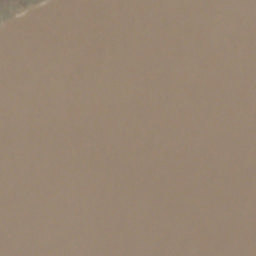

True label
cloudy
Predicted
['agriculture water primary clear']


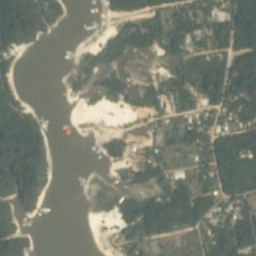

True label
clear habitation primary road water
Predicted
['habitation road agriculture water primary clear']


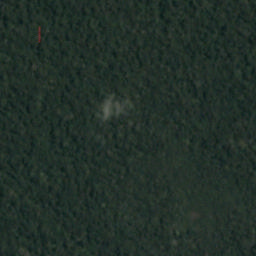

True label
partly_cloudy primary
Predicted
['primary partly_cloudy clear']


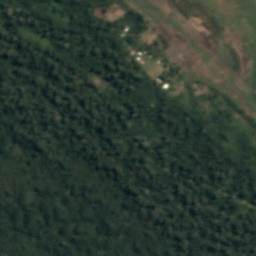

True label
agriculture clear habitation primary
Predicted
['cultivation habitation road agriculture primary clear']


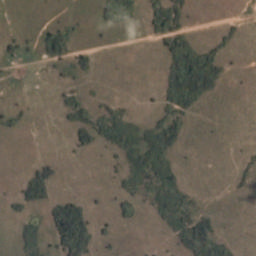

True label
agriculture clear primary road
Predicted
['cultivation road agriculture primary clear']


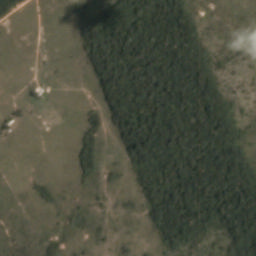

True label
agriculture clear habitation primary road
Predicted
['cultivation habitation road agriculture primary partly_cloudy clear']


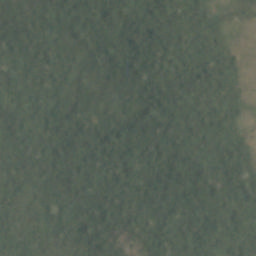

True label
agriculture clear primary
Predicted
['cultivation agriculture primary clear']


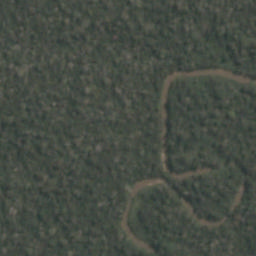

True label
clear primary water
Predicted
['road water primary clear']


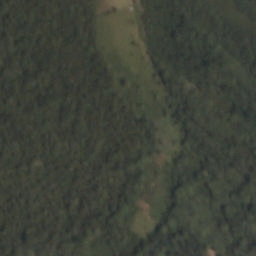

True label
clear primary
Predicted
['cultivation agriculture primary clear']


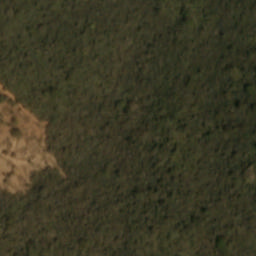

True label
clear cultivation primary
Predicted
['cultivation agriculture primary clear']


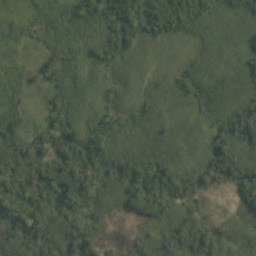

True label
clear cultivation primary
Predicted
['slash_burn cultivation agriculture primary clear']


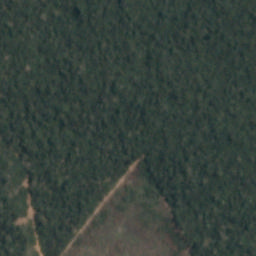

True label
agriculture clear primary
Predicted
['cultivation road agriculture primary clear']


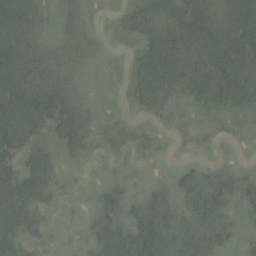

True label
agriculture haze primary water
Predicted
['agriculture water primary clear haze']


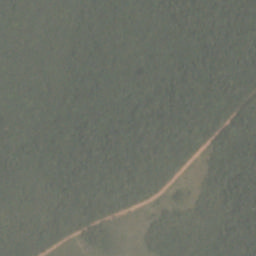

True label
agriculture cultivation haze primary road water
Predicted
['cultivation road agriculture water primary clear haze']


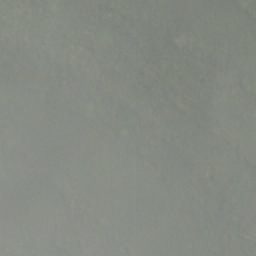

True label
cloudy
Predicted
['primary cloudy haze']


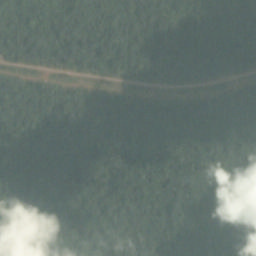

True label
partly_cloudy primary road
Predicted
['road water primary partly_cloudy']


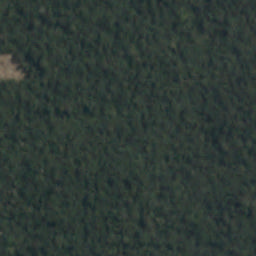

True label
clear cultivation primary
Predicted
['cultivation agriculture primary clear']


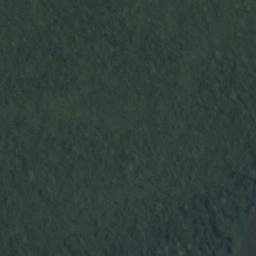

True label
clear primary
Predicted
['water primary clear']


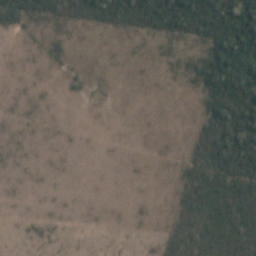

True label
agriculture clear primary
Predicted
['cultivation road agriculture primary clear']


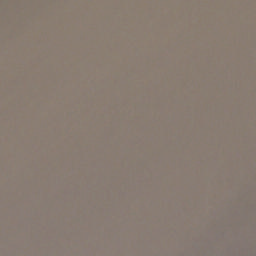

True label
clear primary water
Predicted
['cloudy clear']


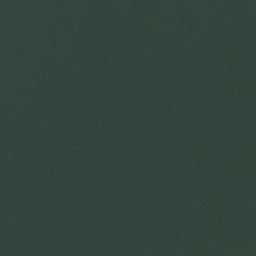

True label
clear water
Predicted
['water primary clear']


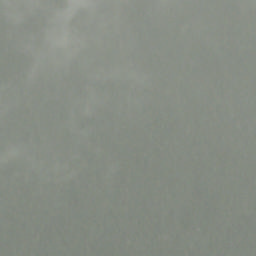

True label
haze primary
Predicted
['primary cloudy haze']


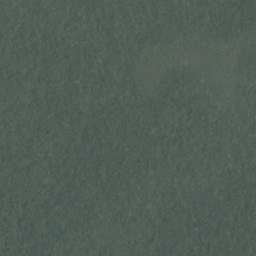

True label
haze primary
Predicted
['primary clear haze']


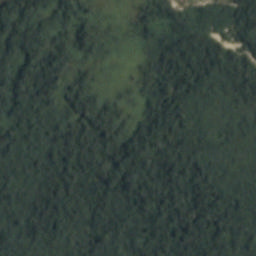

True label
clear primary
Predicted
['cultivation agriculture water primary clear']


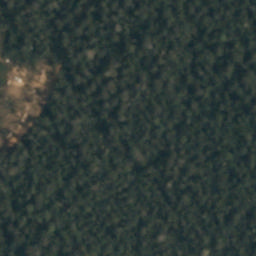

True label
bare_ground clear habitation primary selective_logging
Predicted
['cultivation habitation road agriculture primary clear']


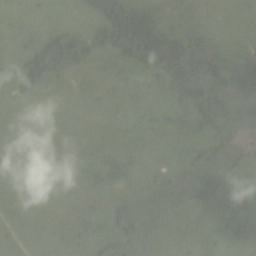

True label
partly_cloudy primary
Predicted
['cultivation road agriculture primary partly_cloudy']


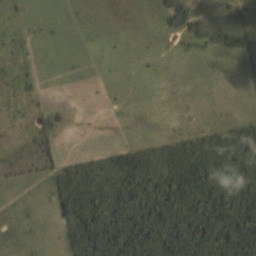

True label
agriculture cultivation partly_cloudy primary road
Predicted
['road agriculture primary partly_cloudy clear']


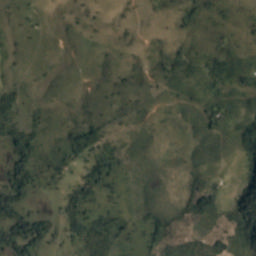

True label
agriculture clear primary road
Predicted
['cultivation habitation road agriculture primary clear']


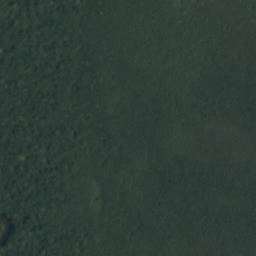

True label
clear primary
Predicted
['water primary clear']


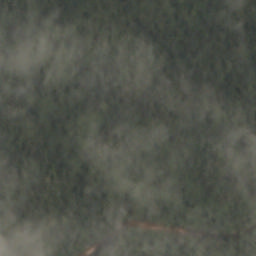

True label
agriculture partly_cloudy primary water
Predicted
['water primary partly_cloudy']


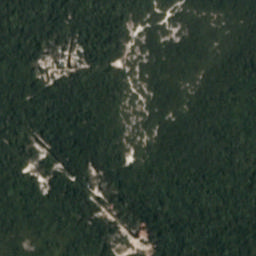

True label
agriculture clear habitation primary road water conventional_mine
Predicted
['cultivation habitation road agriculture primary clear']


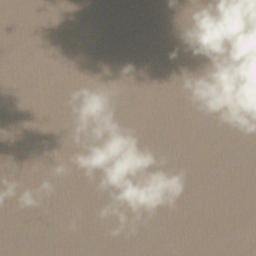

True label
partly_cloudy primary water
Predicted
['agriculture water primary partly_cloudy']


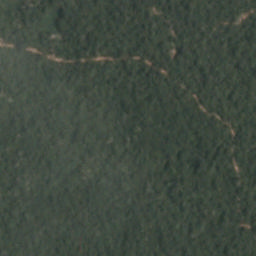

True label
clear primary road selective_logging
Predicted
['selective_logging road water primary clear']


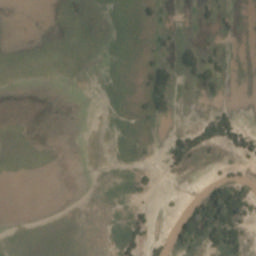

True label
agriculture clear cultivation primary water
Predicted
['road agriculture water primary clear']


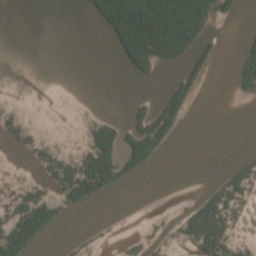

True label
bare_ground clear primary water
Predicted
['bare_ground agriculture water primary clear']


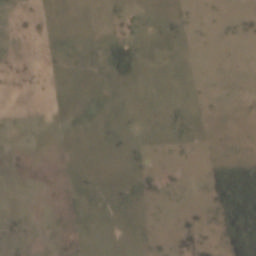

True label
agriculture clear primary
Predicted
['road agriculture primary clear']


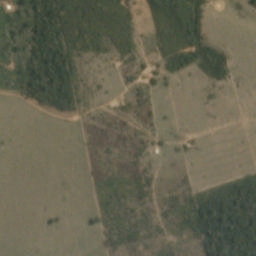

True label
agriculture clear primary road
Predicted
['habitation road agriculture primary clear']


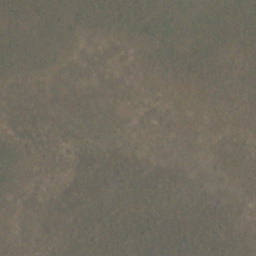

True label
bare_ground haze
Predicted
['bare_ground agriculture primary clear haze']


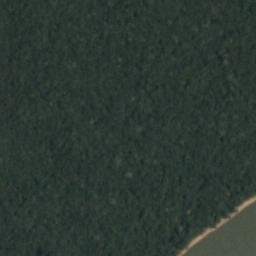

True label
clear primary water
Predicted
['road water primary clear']


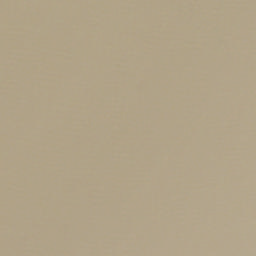

True label
cloudy
Predicted
['water cloudy clear']


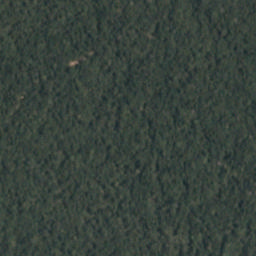

True label
clear primary selective_logging
Predicted
['primary clear']


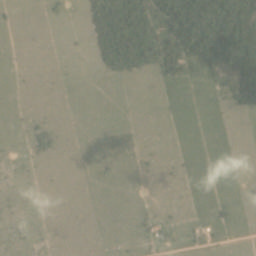

True label
agriculture habitation partly_cloudy primary road
Predicted
['habitation road agriculture primary partly_cloudy clear']


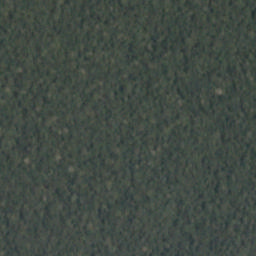

True label
blooming clear primary
Predicted
['primary clear']


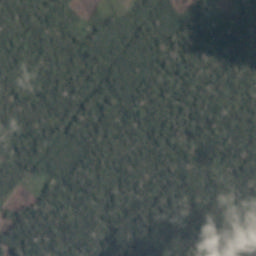

True label
agriculture blooming cultivation partly_cloudy primary selective_logging
Predicted
['cultivation agriculture primary partly_cloudy']


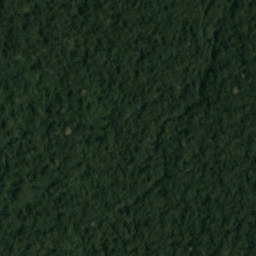

True label
blooming clear primary
Predicted
['primary clear']


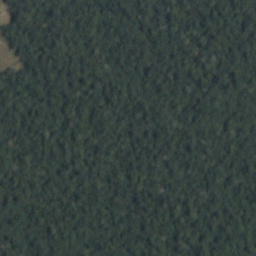

True label
agriculture clear primary
Predicted
['cultivation agriculture primary clear']


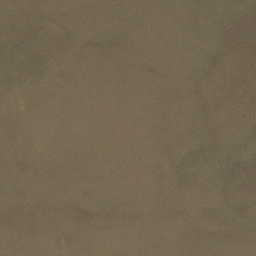

True label
bare_ground haze
Predicted
['bare_ground agriculture clear']


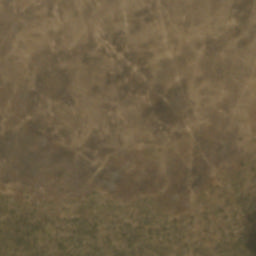

True label
agriculture clear primary road
Predicted
['bare_ground agriculture clear']


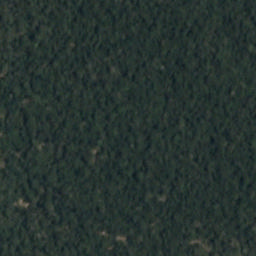

True label
clear primary selective_logging
Predicted
['selective_logging road primary clear']


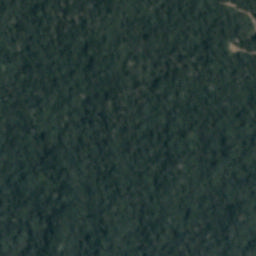

True label
clear primary
Predicted
['road water primary clear']


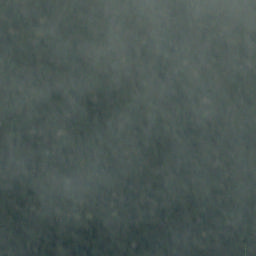

True label
partly_cloudy primary
Predicted
['primary partly_cloudy haze']


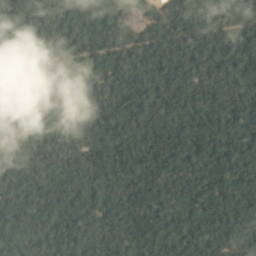

True label
agriculture cultivation partly_cloudy primary road selective_logging
Predicted
['cultivation habitation road agriculture water primary partly_cloudy']


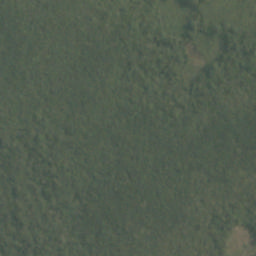

True label
clear cultivation primary
Predicted
['cultivation agriculture primary clear']


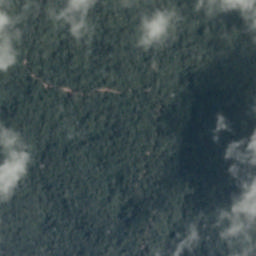

True label
partly_cloudy primary road selective_logging water
Predicted
['road water primary partly_cloudy']


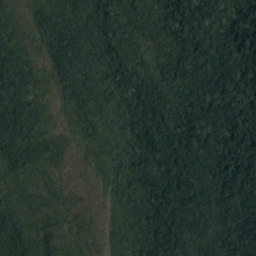

True label
agriculture clear primary
Predicted
['road agriculture primary clear']


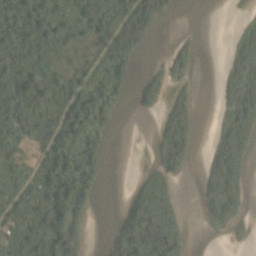

True label
agriculture clear primary road water
Predicted
['habitation road agriculture water primary clear']


In [31]:
#Some incorrectly predicted examples
i = 0
while(i<300):
    idx = np.random.randint(40479)
    f,tags = df_train.values[idx,:]
    img = cv2.imread('train-jpg/{}.jpg'.format(f))
    targets = np.zeros(17)
    for t in tags.split(' '):
        targets[label_map[t]] = 1 
    x_train = np.array(cv2.resize(img, (224, 224)),np.float32)/255.#139 minimum size for inception
    x_train -= train_mean
    targets = np.array(targets,bool)
    y = model.predict(x_train[np.newaxis,:])
    y_pred = np.array(y > thresh_2_val,bool)
    if(not (y_pred==targets).all()):
        ipython_img = Image(filename='train-jpg/{}.jpg'.format(f))
        display(ipython_img)
        labels_np = np.array(labels)
        preds = [' '.join(labels_np[np.array(y_pred[i,:],bool)]) for i in range(y_pred.shape[0])]
        print('True label')
        print(tags)
        print('Predicted')
        print(preds)
        i+=1

In [32]:
model.layers[-1].name

'dense_2'

True label
agriculture clear primary road water
Predicted
['cultivation habitation road agriculture water primary partly_cloudy clear']


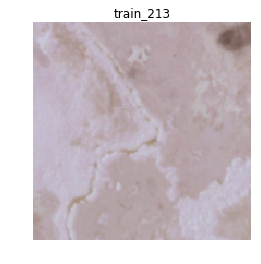

Working on filters: [9]


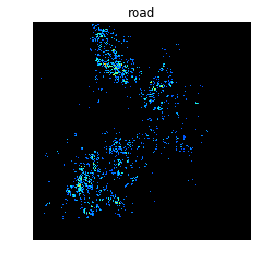

Working on filters: [10]


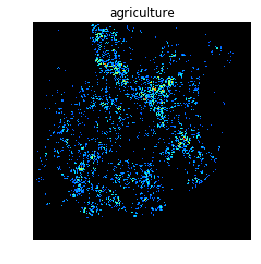

Working on filters: [11]


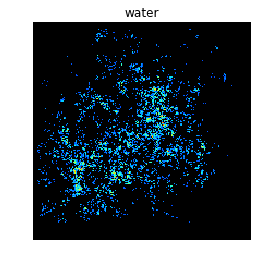

Working on filters: [12]


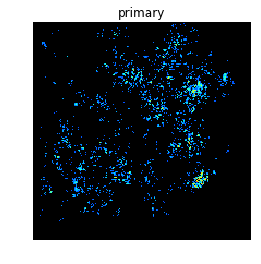

Working on filters: [15]


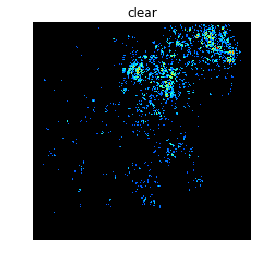

True label
partly_cloudy primary selective_logging
Predicted
['selective_logging road primary partly_cloudy clear']


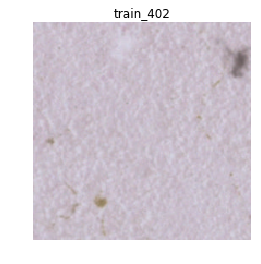

Working on filters: [5]


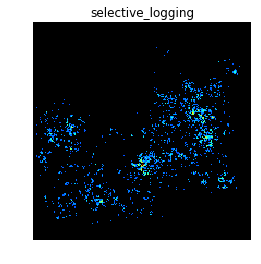

Working on filters: [12]


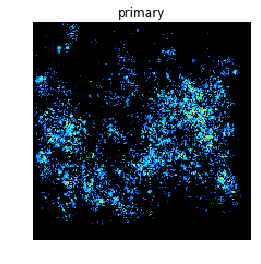

Working on filters: [13]


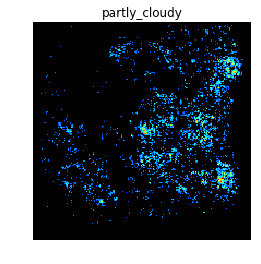

True label
clear primary
Predicted
['primary clear']


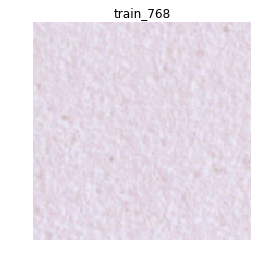

Working on filters: [12]


/home/cs231n/myVE35/lib/python3.5/site-packages/vis/visualization.py:169: RuntimeWarning: invalid value encountered in true_divide
  grads /= np.max(grads)
/home/cs231n/myVE35/lib/python3.5/site-packages/matplotlib/colors.py:494: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)
/home/cs231n/myVE35/lib/python3.5/site-packages/vis/visualization.py:171: RuntimeWarning: invalid value encountered in less
  heatmap[np.where(grads < 0.2)] = 0


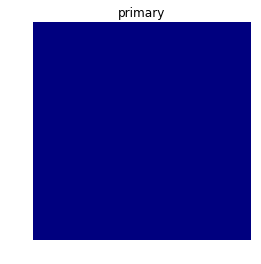

Working on filters: [15]


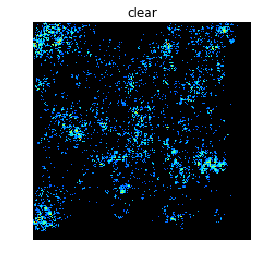

True label
agriculture clear habitation primary road
Predicted
['habitation road agriculture primary clear']


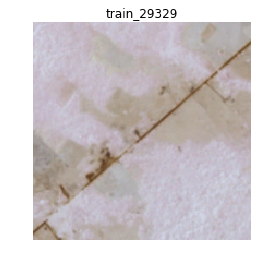

Working on filters: [8]


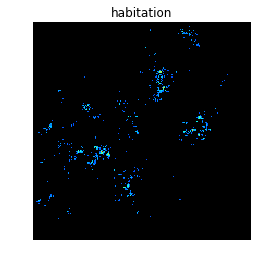

Working on filters: [9]


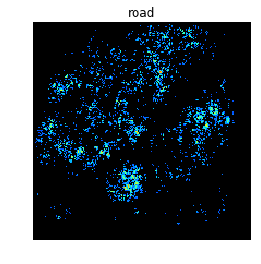

Working on filters: [10]


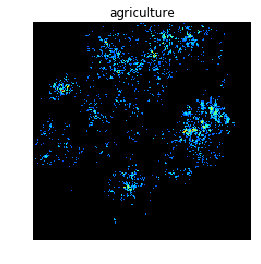

Working on filters: [12]


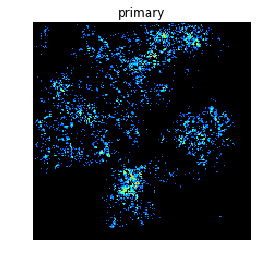

Working on filters: [15]


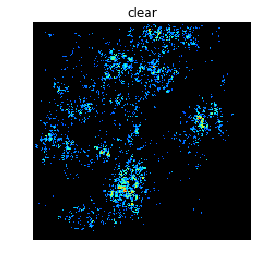

True label
artisinal_mine clear primary water
Predicted
['artisinal_mine water primary clear']


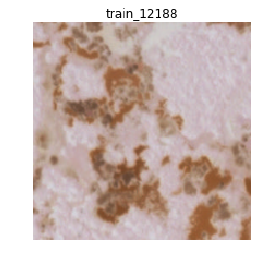

Working on filters: [4]


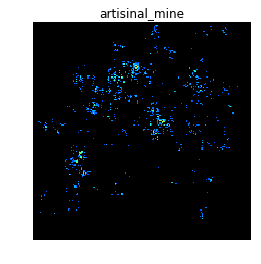

Working on filters: [11]


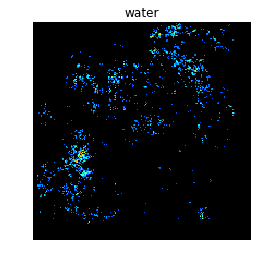

Working on filters: [12]


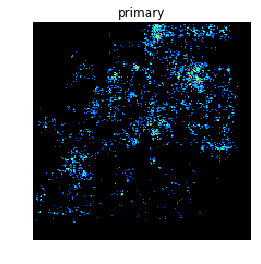

Working on filters: [15]


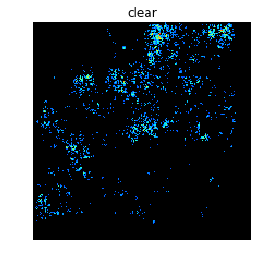

In [5]:
%matplotlib inline
# The name of the layer we want to visualize
# (see model definition in vggnet.py)
layer_name = 'dense_2'
layer_idx = [idx for idx, layer in enumerate(model.layers) if layer.name == layer_name][0]
for idx in [213,402,768,29329,12188]:
    f,tags = df_train.values[idx,:]
    img = cv2.imread('train-jpg/{}.jpg'.format(f))
    targets = np.zeros(17)
    for t in tags.split(' '):
        targets[label_map[t]] = 1 

    x = np.array(cv2.resize(img, (200, 200)),np.float32)
    x_1 = x/255.
    x_train = x_1 - train_mean
    targets = np.array(targets,bool)
    y = model.predict(x_train[np.newaxis,:])
    y_pred = np.array(y > thresh_2_val,bool)
    labels_np = np.array(labels)
    preds = [' '.join(labels_np[np.array(y_pred[i,:],bool)]) for i in range(y_pred.shape[0])]
    print('True label')
    print(tags)
    print('Predicted')
    print(preds)
    
    plt.axis('off')
    plt.imshow(x)
    plt.title(f)
    plt.show()
    for j in np.nonzero(targets)[0]:
        pred_class = j
        heatmap = visualize_saliency(model, layer_idx, [pred_class], x_train, alpha=0)
        plt.axis('off')
        plt.imshow(heatmap)
        plt.title(labels[j])
        plt.show()

True label
partly_cloudy primary
Predicted
['primary partly_cloudy']


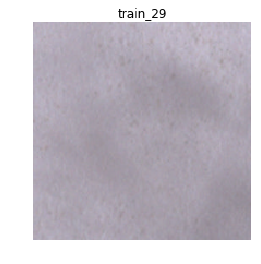

Working on filters: [12]


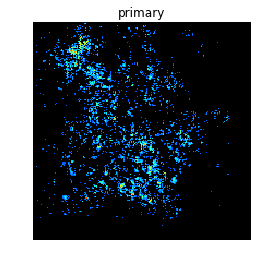

Working on filters: [13]


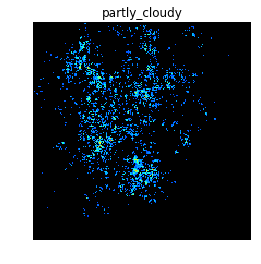

In [5]:
%matplotlib inline
# The name of the layer we want to visualize
# (see model definition in vggnet.py)
layer_name = 'dense_2'
layer_idx = [idx for idx, layer in enumerate(model.layers) if layer.name == layer_name][0]
for idx in [29]:
    f,tags = df_train.values[idx,:]
    img = cv2.imread('train-jpg/{}.jpg'.format(f))
    targets = np.zeros(17)
    for t in tags.split(' '):
        targets[label_map[t]] = 1 

    x = np.array(cv2.resize(img, (200, 200)),np.float32)
    x_1 = x/255.
    x_train = x_1 - train_mean
    targets = np.array(targets,bool)
    y = model.predict(x_train[np.newaxis,:])
    y_pred = np.array(y > thresh_2_val,bool)
    labels_np = np.array(labels)
    preds = [' '.join(labels_np[np.array(y_pred[i,:],bool)]) for i in range(y_pred.shape[0])]
    print('True label')
    print(tags)
    print('Predicted')
    print(preds)
    
    plt.axis('off')
    plt.imshow(x)
    plt.title(f)
    plt.show()
    for j in np.nonzero(targets)[0]:
        pred_class = j
        heatmap = visualize_saliency(model, layer_idx, [pred_class], x_train, alpha=0)
        plt.axis('off')
        plt.imshow(heatmap)
        plt.title(labels[j])

        plt.show()

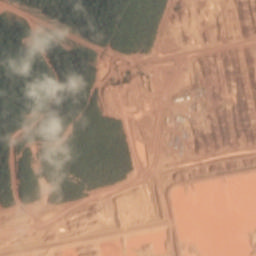

In [33]:
f = 'train_24'
ipython_img = Image(filename='train-jpg/{}.jpg'.format(f))
display(ipython_img)


True label
conventional_mine partly_cloudy primary
Predicted
['conventional_mine road primary partly_cloudy']


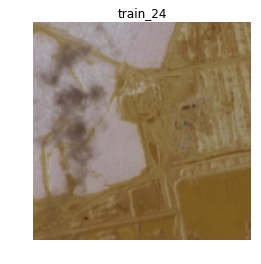

Working on filters: [2]


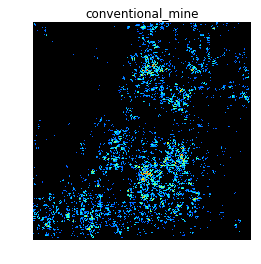

Working on filters: [12]


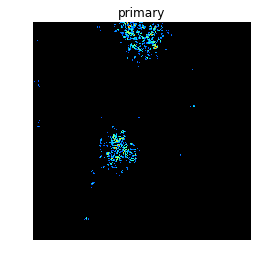

Working on filters: [13]


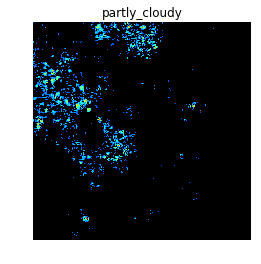

In [34]:
%matplotlib inline
# The name of the layer we want to visualize
# (see model definition in vggnet.py)
layer_name = 'dense_2'
layer_idx = [idx for idx, layer in enumerate(model.layers) if layer.name == layer_name][0]
for idx in [24]:
    f,tags = df_train.values[idx,:]
    img = cv2.imread('train-jpg/{}.jpg'.format(f))
    targets = np.zeros(17)
    for t in tags.split(' '):
        targets[label_map[t]] = 1 

    x = np.array(cv2.resize(img, (224, 224)),np.float32)
    x_1 = x/255.
    x_train = x_1 - train_mean
    targets = np.array(targets,bool)
    y = model.predict(x_train[np.newaxis,:])
    y_pred = np.array(y > thresh_2_val,bool)
    labels_np = np.array(labels)
    preds = [' '.join(labels_np[np.array(y_pred[i,:],bool)]) for i in range(y_pred.shape[0])]
    print('True label')
    print(tags)
    print('Predicted')
    print(preds)
    
    plt.axis('off')
    plt.imshow(x)
    plt.title(f)
    plt.show()
    for j in np.nonzero(targets)[0]:
        pred_class = j
        heatmap = visualize_saliency(model, layer_idx, [pred_class], x_train, alpha=0)
        plt.axis('off')
        plt.imshow(heatmap)
        plt.title(labels[j])

        plt.show()

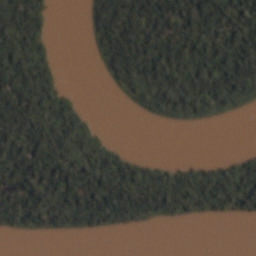

In [57]:
f = 'train_33733'
ipython_img = Image(filename='train-jpg/{}.jpg'.format(f))
display(ipython_img)


True label
clear primary water
Predicted
['water primary clear']


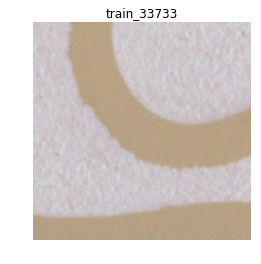

Working on filters: [11]


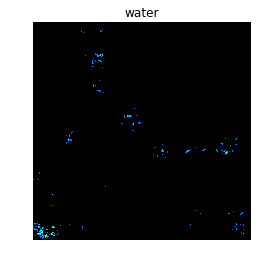

Working on filters: [12]


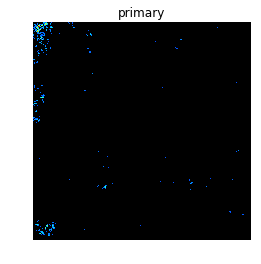

Working on filters: [15]


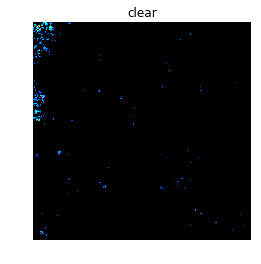

In [58]:
%matplotlib inline
# The name of the layer we want to visualize
# (see model definition in vggnet.py)
layer_name = 'dense_2'
layer_idx = [idx for idx, layer in enumerate(model.layers) if layer.name == layer_name][0]
for idx in [33733]:
    f,tags = df_train.values[idx,:]
    img = cv2.imread('train-jpg/{}.jpg'.format(f))
    targets = np.zeros(17)
    for t in tags.split(' '):
        targets[label_map[t]] = 1 

    x = np.array(cv2.resize(img, (224, 224)),np.float32)
    x_1 = x/255.
    x_train = x_1 - train_mean
    targets = np.array(targets,bool)
    y = model.predict(x_train[np.newaxis,:])
    y_pred = np.array(y > thresh_2_val,bool)
    labels_np = np.array(labels)
    preds = [' '.join(labels_np[np.array(y_pred[i,:],bool)]) for i in range(y_pred.shape[0])]
    print('True label')
    print(tags)
    print('Predicted')
    print(preds)
    
    plt.axis('off')
    plt.imshow(x)
    plt.title(f)
    plt.show()
    for j in np.nonzero(targets)[0]:
        pred_class = j
        heatmap = visualize_saliency(model, layer_idx, [pred_class], x_train, alpha=0)
        plt.axis('off')
        plt.imshow(heatmap)
        plt.title(labels[j])

        plt.show()

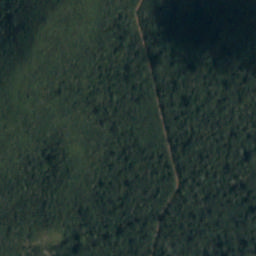

In [59]:
f = 'train_33766'
ipython_img = Image(filename='train-jpg/{}.jpg'.format(f))
display(ipython_img)


True label
clear primary road
Predicted
['road agriculture water primary clear']


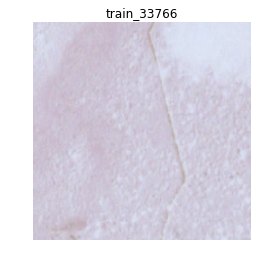

Working on filters: [9]


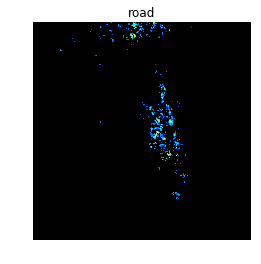

Working on filters: [12]


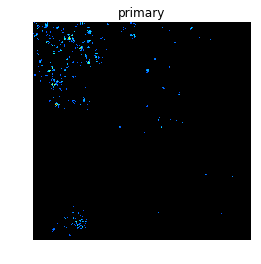

Working on filters: [15]


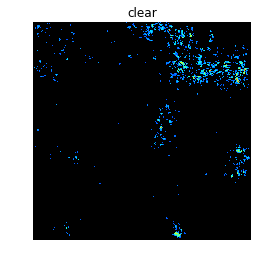

In [60]:
%matplotlib inline
# The name of the layer we want to visualize
# (see model definition in vggnet.py)
layer_name = 'dense_2'
layer_idx = [idx for idx, layer in enumerate(model.layers) if layer.name == layer_name][0]
for idx in [33766]:
    f,tags = df_train.values[idx,:]
    img = cv2.imread('train-jpg/{}.jpg'.format(f))
    targets = np.zeros(17)
    for t in tags.split(' '):
        targets[label_map[t]] = 1 

    x = np.array(cv2.resize(img, (224, 224)),np.float32)
    x_1 = x/255.
    x_train = x_1 - train_mean
    targets = np.array(targets,bool)
    y = model.predict(x_train[np.newaxis,:])
    y_pred = np.array(y > thresh_2_val,bool)
    labels_np = np.array(labels)
    preds = [' '.join(labels_np[np.array(y_pred[i,:],bool)]) for i in range(y_pred.shape[0])]
    print('True label')
    print(tags)
    print('Predicted')
    print(preds)
    
    plt.axis('off')
    plt.imshow(x)
    plt.title(f)
    plt.show()
    for j in np.nonzero(targets)[0]:
        pred_class = j
        heatmap = visualize_saliency(model, layer_idx, [pred_class], x_train, alpha=0)
        plt.axis('off')
        plt.imshow(heatmap)
        plt.title(labels[j])

        plt.show()

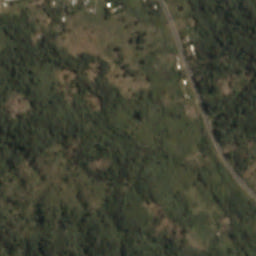

In [2]:
ipython_img = Image(filename='test-jpg/test_16.jpg')
display(ipython_img)


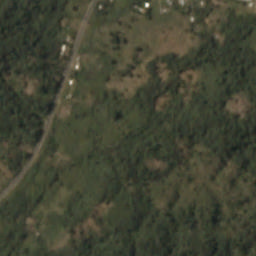

In [3]:
ipython_img = Image(filename='test-jpg-1/test_16.jpg')
display(ipython_img)


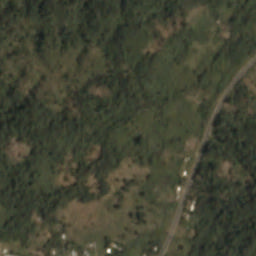

In [4]:
ipython_img = Image(filename='test-jpg-2/test_16.jpg')
display(ipython_img)


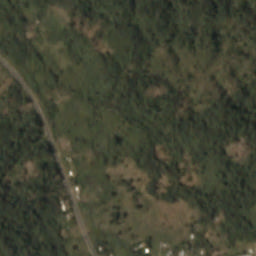

In [5]:
ipython_img = Image(filename='test-jpg-3/test_16.jpg')
display(ipython_img)


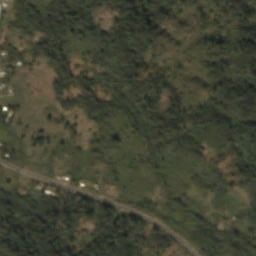

In [6]:
ipython_img = Image(filename='test-jpg-4/test_16.jpg')
display(ipython_img)


In [68]:
model.layers[1].name

'zero_padding2d_1'

In [66]:
from vis.visualization import visualize_activation, get_num_filters

layer_name = 'conv1'
layer_idx = [idx for idx, layer in enumerate(model.layers) if layer.name == layer_name][0]

# Visualize all filters in this layer.
filters = np.arange(get_num_filters(model.layers[layer_idx]))

# Generate input image for each filter. Here `text` field is used to overlay `filter_value` on top of the image.
vis_images = []
for idx in filters:
    img = visualize_activation(model, layer_idx, filter_indices=idx) 
    img = utils.draw_text(img, str(idx))
    vis_images.append(img)

# Generate stitched image palette with 8 cols.
stitched = utils.stitch_images(vis_images, cols=8)    
plt.axis('off')
plt.imshow(stitched)
plt.title(layer_name)
plt.show()

Working on filters: [0]


TypeError: unsupported operand type(s) for *: 'NoneType' and 'NoneType'